# Fine Grain Clustering QC of Myeloid Cells

In [1]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(tidyr)
library(viridis)
library(stringr)
library(pheatmap)
library(presto)
library(pals)
library(harmony)
library(singlecellmethods)
library(lisi)
source("/data/srlab/ik936/Foxxy/utils/utils.R")
source("/data/srlab/anathan/scripts/scseq_utils.R")
library(parallel)

# weighted PCA is in immunogenomics/singlecellmethods, function weighted_pca
weighted_pca <- function(X, weights, genes_use=NULL, npc=20, do_corr=TRUE, scale_thresh=10) {
    if (!identical(length(weights), ncol(X))) {
        stop('Columns in X must match length of weights')
    }
    
#     y <- factor(y)
#     weights <- as.numeric((1 / prop.table(table(y)))[y]) / nlevels(y)
    if (any(is.na(weights))) {
        idx_keep <- which(is.na(weights))
#         y <- y[idx_keep]
        weights <- weights[idx_keep]
        X <- X[, idx_keep]
    }
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    } else if (length(genes_use) < nrow(X)) {
        if (any(!genes_use %in% row.names(X))) {
            stop('genes_use not in rownames of X')
        }
        X <- X[genes_use, ]
    }
    
    ## weighted z-scores
#     mu <- X %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
#     sig <- X %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    mu <- singlecellmethods::rowMeans(X, weights = weights)
    sig <- singlecellmethods::rowSDs(X, weights = weights)
    
    # Added 12/9/19: save weighted scaling means and std devs
    vargenes_means_sds <- tibble(
        symbol = genes_use,
        mean = mu
    )
    vargenes_means_sds$stddev <- sig
    # finish added 12/9/19
    
    X <- scaleDataWithStats(X, mu, sig) 
    X <- X[which(is.na(rowSums(X)) == 0), ]
    if (do_corr) {
        X <- X %>% scale() %>% pmin(scale_thresh) %>% pmax(-scale_thresh)
    }
    
    ## weighted SVD
#     pres <- rsvd::rsvd(X %*% Matrix::Diagonal(x = sqrt(weights)), k = npc)
    pres <- RSpectra::svds(X %*% Matrix::Diagonal(x = sqrt(weights)), npc)
    V <- (Matrix::Diagonal(x = 1 / sqrt(weights)) %*% pres$v) %*% diag(pres$d)
    V <- as.matrix(V)
    colnames(V) <- paste0('PC', 1:npc)
    row.names(V) <- colnames(X)
    colnames(pres$u) <- paste0('PC', 1:npc)
    row.names(pres$u) <- row.names(X)
    return(list(loadings = pres$u, embeddings = V, vargenes = vargenes_means_sds))
}

# Cosine normalize values
cosine_normalize <- function(X, MARGIN = 1, do_safe = TRUE) {
    if (do_safe) {
        X <- sweep(X, MARGIN, apply(X, MARGIN, max), "/")
    }
    sweep(X, MARGIN, apply(X, MARGIN, function(x) sqrt(sum(x^2))), "/")
}
                           
                                                    
do_pca <- function(X, weights, genes_use=NULL, npc=10, do_corr=TRUE) {
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    }
    mu <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
    sig <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    
    X <- X[genes_use, ] %>% scaleDataWithStats(mu, sig) 
    X <- X[which(is.na(rowSums(X)) == 0), ]
    if (do_corr) {
        X <- scale(X)
    }
    pres <- rsvd::rsvd(X, k = npc)
    V <- pres$v %*% diag(pres$d)
    V <- data.table(V)
    colnames(V) <- paste0('PC', 1:npc)
    return(V)    
}
                           
get_stats <- function(X, weights, genes_use=NULL) {
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    }
    mu <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
    sig <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    return(list(mu = mu, sig = sig))
}
                           
                           
vargenes_vst <- function(object, groups, topn, loess.span = 0.3) {
    clip.max <- sqrt(ncol(object))

    N <- ncol(object)
    if (missing(groups)) {
        groups <- rep('A', N)
    }
    
    res <- split(seq_len(N), groups) %>% lapply(function(idx) {
        object_group <- object[, idx]
        ## row means
        hvf.info <- data.frame(
          symbol = rownames(object_group), 
          mean = Matrix::rowMeans(object_group)
        )

        ## row vars
        hvf.info$variance <- rowVars(object_group, hvf.info$mean)

        ## initialize
        hvf.info$variance.expected <- 0
        hvf.info$variance.standardized <- 0

        not.const <- hvf.info$variance > 0

        ## loess curve fit 
        suppressWarnings({
            fit <- loess(formula = log10(variance) ~ log10(mean), 
                data = hvf.info[not.const, ], span = loess.span)            
        })

        ## extract fitted variance 
        hvf.info$variance.expected[not.const] <- 10^fit$fitted

        ## get row standard deviations after clipping
        hvf.info$variance.standardized <- rowVarsStd(
            object_group, 
            hvf.info$mean, 
            sqrt(hvf.info$variance.expected), 
            clip.max
        )

        hvf.info <- hvf.info %>% 
#             tibble::rownames_to_column('symbol') %>% 
            arrange(-variance.standardized) %>% 
            tibble::rowid_to_column('rank') %>% 
            transform(group = unique(groups[idx]))

        return(hvf.info)        
    })
    
    
    if (missing(topn)) {
        ## MODE 1: return table 
        res <- Reduce(rbind, res) %>% 
            dplyr::select(group, symbol, rank, everything())

        if (length(unique(res$group)) == 1) {
            res$group <- NULL
        }
    } else {
        ## MODE 2: return genes
        res <- lapply(res, function(x) head(x, topn)$symbol)
    }
    return(res)
}
                      
                      
plot_clusters3 <- function(cluster_ids, labels, label_size = 2, pt_size = 20, umap_use = umap_post,
                           do_labels = FALSE,
                           do_points = TRUE, do_density = FALSE, alpha_pt = 1, min_cluster_size = 20) {
    cluster_table <- table(cluster_ids)
    plt_df <- umap_use %>% data.frame() %>% cbind(cluster = cluster_ids) %>% cbind(cluster_label = labels)
    factor_levels <- plt_df %>% select(cluster_label, cluster) %>% unique() %>% arrange(as.numeric(cluster)) %>% pull(cluster_label)
    plt <- plt_df %>%
        dplyr::sample_frac(1L) %>%
        ggplot(aes(hUMAP1, hUMAP2, col = factor(cluster_label, levels = factor_levels), fill = factor(cluster_label, factor_levels)))
    if (do_points)
        plt <- plt + geom_point(alpha = alpha_pt, size = 0.5) + theme_classic()
    if (do_density)
        plt <- plt + geom_density_2d()


    plt <- plt +
     #   theme_tufte() +
#         theme(axis.line = element_line()) +
        guides(color = guide_legend(override.aes = list(size = 6))) +
#         scale_color_manual(values = sample(unique(singler.colors))) +
#         scale_color_manual(values = palette_use) +
        labs(x = "UMAP 1", y = "UMAP 2") +
        theme(plot.title = element_text(hjust = .5))

    if (do_labels)
        plt <- plt + ggrepel::geom_label_repel(data = data.table(plt_df)[, .(hUMAP1 = mean(hUMAP1), hUMAP2 = mean(hUMAP2)), by = .(cluster, cluster_label)], label.size = NA,
                                aes(label = cluster), color = "white", size = label_size,  max.overlaps = 15) +
        guides(col = FALSE, fill = FALSE) 
#         scale_fill_manual(values = palette_use) +
    return(plt)
}

plot_shuffled_features <- function(ab, umap, exprs, pct) {
    library(viridis)
    max.cutoff = quantile(exprs[ab,], pct)
    min.cutoff = quantile(exprs[ab,], 1-pct)
    
    tmp <- sapply(X = exprs[ab,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
    umap_res_plot <- cbind(umap, tmp)
    return(ggplot(data = as.data.frame(umap_res_plot)[sample(nrow(umap_res_plot)),] , aes(x = V1, y = V2)) +
      geom_point(mapping = aes(color = tmp), size = 0.75) +
      scale_color_viridis(option = "inferno", end = pct) +
      theme_classic() +
      theme(plot.title = element_text(size = 15), legend.position = "none") +
      labs(title = ab, x = 'hUMAP1', y = 'hUMAP2', color = "Normalized Expression"))
}
                           fig.size <- function (height, width) {
    options(repr.plot.height = height, repr.plot.width = width, repr.plot.res = 300)
}

Attaching SeuratObject


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: viridisLite

Loading required package: Rcpp

Loading required package: data.table


Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last



Attaching package: ‘pals’


The following objects are masked from ‘package:viridis’:

    cividis, inferno, magma, plasma, turbo, viridis


The following objects are masked from ‘package:viridisLite’:

    cividis, inferno, magma, plasma, turbo, viridis



Attaching package: ‘singlecellmethods’


The following object is masked from ‘package:SeuratObject’:

    rowMeans


The following object is masked from ‘package:base’:

    rowMeans




In [11]:
temp_meta <- readRDS('/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/nuc-seq-output/full_metadata/meta_all_filtered_500nGene_0.01pctmtUMI7500uppernGene_1000nUMI_40000uppernUMI_doublet_removal.rds')

In [10]:
meta <- readRDS("/data/srlab/ssg34/SLE_kidney/data/all_immune/all_immune_cells.integrated.consolidated_clusters.rds")@meta.data

In [4]:
doublet_meta <- rbind(temp_meta %>% select(cells, doublet_score_scrublet, isscrubletdoublet) %>% 
                      rename(doublet_score = doublet_score_scrublet, doublet_classification = isscrubletdoublet, cell = cells), 
                      meta %>% select(cells, doublet_score, doublet_classification) %>% rename(cell = cells)) 

### Read In Files

In [30]:
all_meta <- readRDS('/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/meta_ScNuc_500nGene_1000nUMI_3pctnontargetMTwdoubletandsampleFINAL-8-10-22.rds')

In [114]:
norm <- readRDS('/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/normalized_data_ScNuc_500nGene_1000nUMI_3pctnontargetMTwdoubletandsampleFINAL-8-10-22.rds')

In [121]:
Myeloid_meta <- all_meta %>% filter(broad.type == 'Myeloid')

In [122]:
Myeloid_norm <- norm[, Myeloid_meta$cell]

In [73]:
arnon_clusters <- readRDS("/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/Final-Arnon-Output/all_myeloid_cells.w_clustering.rds")@active.ident
arnon_clusters <- data.frame(cell = names(arnon_clusters), arnon_cluster = arnon_clusters)

In [9]:
genes_exclude <- c(grep("^MT-|^RPL|^RPS|MALAT1|MIR-", row.names(norm), value = TRUE), Seurat::cc.genes$s.genes, Seurat::cc.genes$g2m.genes) 

In [7]:
rm(norm)

### QC Clustering

In [10]:
nuc_norm <- Myeloid_norm[, Myeloid_meta %>% filter(dataset == 'snRNAseq') %>% pull(cell)]

sc_norm <- Myeloid_norm[, Myeloid_meta %>% filter(dataset == 'scRNAseq') %>% pull(cell)]

nuc_meta <- Myeloid_meta %>% filter(dataset == 'snRNAseq')

sc_meta <- Myeloid_meta %>% filter(dataset == 'scRNAseq')

In [11]:
## Filtering for expressed genes
threshold_genes <- nuc_norm[rownames(nuc_norm[rowMeans(nuc_norm) >= .01, ]), ]

samples_25 <- nuc_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, nuc_meta %>% filter(sample %in% samples_25) %>% pull(cell)]
 
## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 10 cells
var_genes_raw <- singlecellmethods::vargenes_vst(object = threshold_samples, groups = nuc_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [12]:
## Scale Data
myeloid_scaled_nuc <- nuc_norm[var_genes_raw[! var_genes_raw %in% genes_exclude], ] %>% scaleData
## PCA
myeloid_pca_res_nuc <- irlba::prcomp_irlba(t(myeloid_scaled_nuc), 20)
## UMAP
myeloid_umap_res_nuc <- uwot::umap(myeloid_pca_res_nuc$x[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [13]:
## Filtering for expressed genes
threshold_genes <- sc_norm[rownames(sc_norm[rowMeans(sc_norm) >= .01, ]), ]

samples_25 <- sc_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, sc_meta %>% filter(sample %in% samples_25) %>% pull(cell)]

## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 100 cells
var_genes_raw <- singlecellmethods::vargenes_vst(object = threshold_samples, groups = sc_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [14]:
## Scale Data
myeloid_scaled_sc <- sc_norm[var_genes_raw[!var_genes_raw %in% genes_exclude], ] %>% scaleData
## PCA
myeloid_pca_res_sc <- irlba::prcomp_irlba(t(myeloid_scaled_sc), 20)
## UMAP
myeloid_umap_res_sc <- uwot::umap(myeloid_pca_res_sc$x[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [20]:
myeloid_sc_lisi <- compute_lisi(myeloid_pca_res_sc$x[, 1:20], sc_meta, c('Site', 'processing.batch', 'sample'))
myeloid_nuc_lisi <- compute_lisi(myeloid_pca_res_nuc$x[, 1:20], nuc_meta, c('Site', 'processing.batch', 'sample'))

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



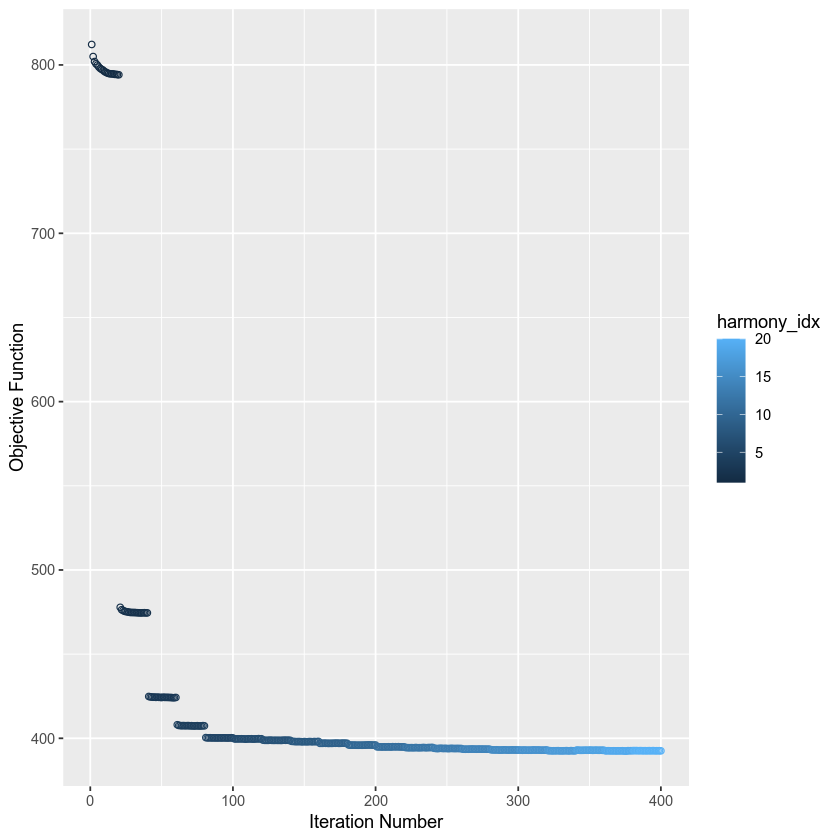

In [15]:
Myeloid_harmony_nuc <- HarmonyMatrix(myeloid_pca_res_nuc$x[, 1:20], nuc_meta, 
                                     vars_use = c("sample", "processing.batch", "Site"), theta = c(2, 1, 1),
                        # lambda = 1, 
                        # tau = 0, 
                        epsilon.cluster = -Inf,
                        epsilon.harmony = -Inf,
                        max.iter.cluster = 20,
                        max.iter.harmony = 20,
                        plot_convergence = TRUE,
                        npcs = 20, do_pca = FALSE)

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



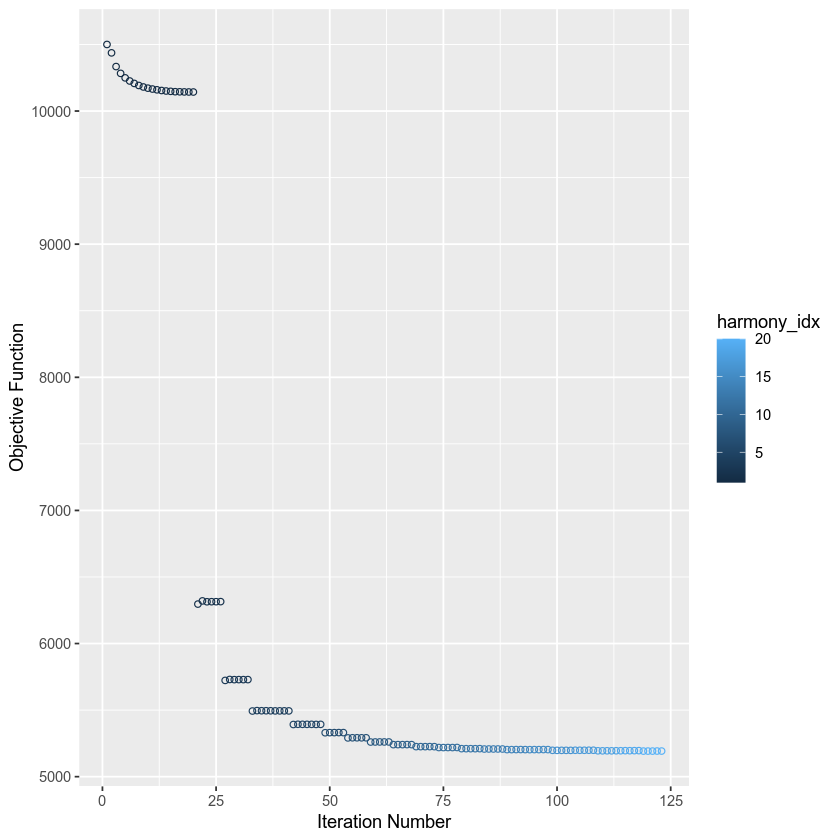

In [16]:
Myeloid_harmony_sc <- HarmonyMatrix(myeloid_pca_res_sc$x[, 1:20], sc_meta, 
                                     vars_use = c("sample", "processing.batch", "Site"), theta = c(2, 1, 1),
                        # lambda = 1, 
                        # tau = 0, 
                        epsilon.harmony = -Inf,
                        max.iter.cluster = 20,
                        max.iter.harmony = 20,
                        plot_convergence = TRUE,
                        npcs = 20, do_pca = FALSE)

In [17]:
myeloid_humap_res_nuc <- uwot::umap(Myeloid_harmony_nuc[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [18]:
myeloid_humap_res_sc <- uwot::umap(Myeloid_harmony_sc[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [23]:
myeloid_sc_lisi_harmony <- compute_lisi(Myeloid_harmony_sc[, 1:20], sc_meta, c('Site', 'processing.batch', 'sample'))
myeloid_nuc_lisi_harmny <- compute_lisi(Myeloid_harmony_nuc[, 1:20], nuc_meta, c('Site', 'processing.batch', 'sample'))

In [24]:
sc_lisi <- rbind(myeloid_sc_lisi %>% mutate(status = 'preharmony'), myeloid_sc_lisi_harmony %>% mutate(status = 'postharmony'))
nuc_lisi <- rbind(myeloid_nuc_lisi %>% mutate(status = 'preharmony'), myeloid_nuc_lisi_harmny %>% mutate(status = 'postharmony'))

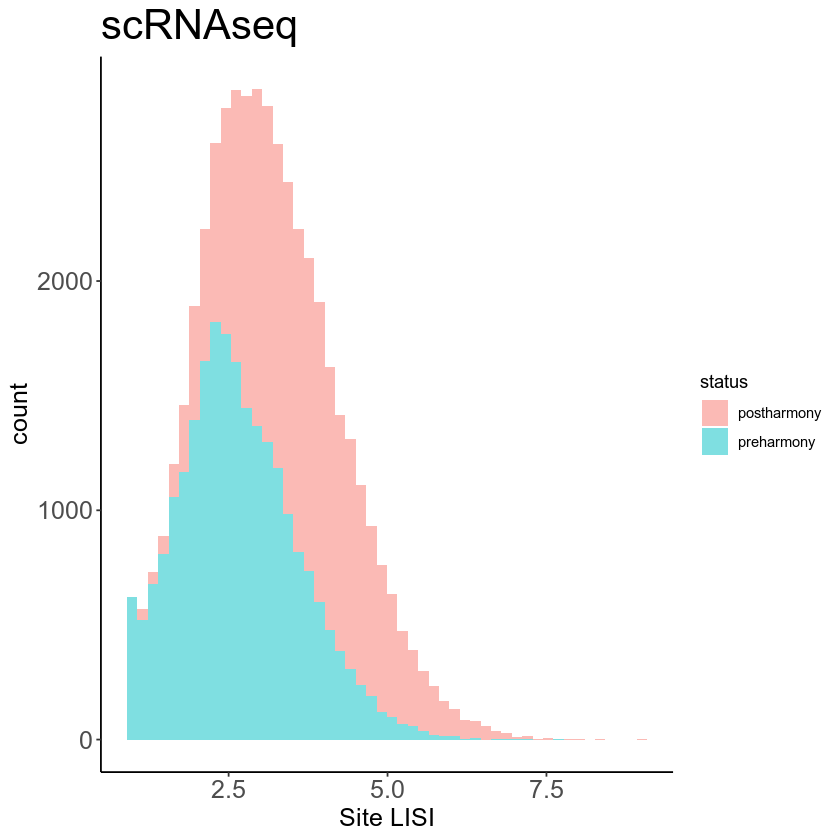

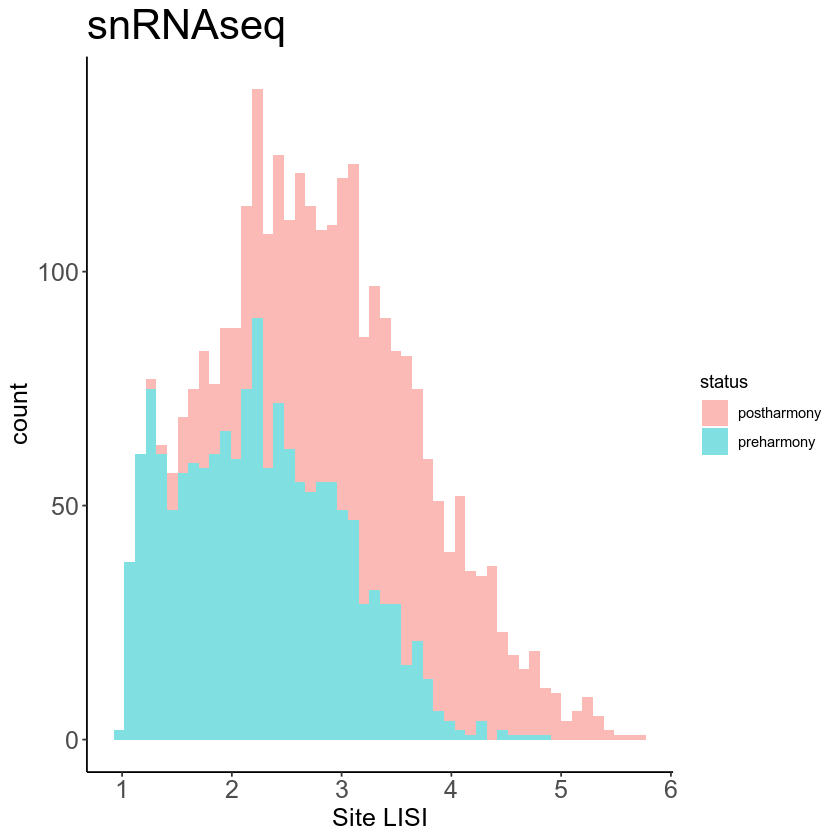

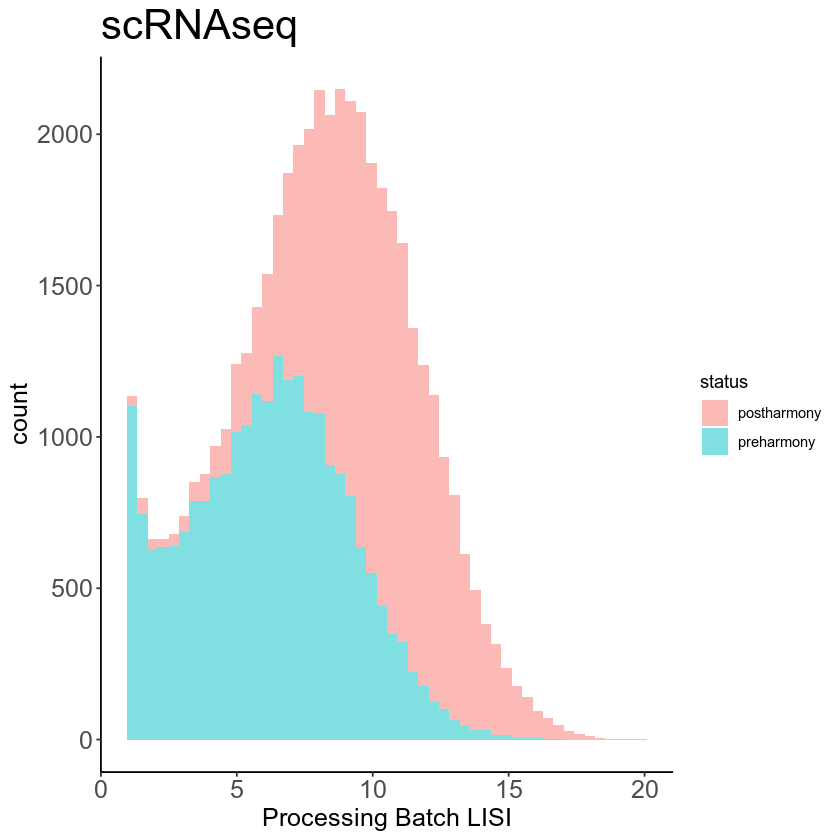

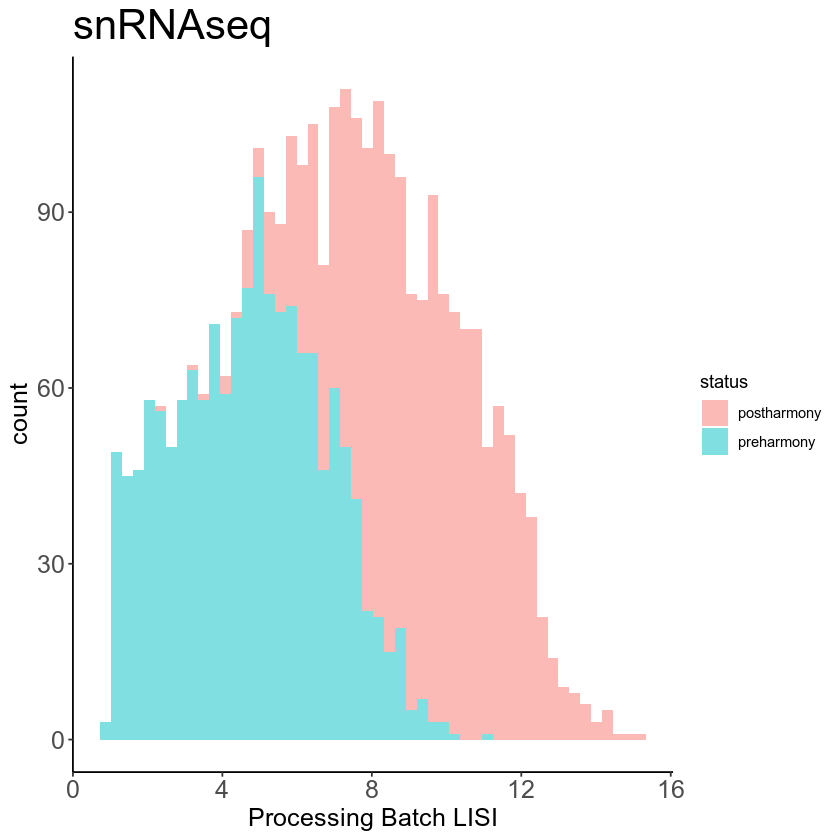

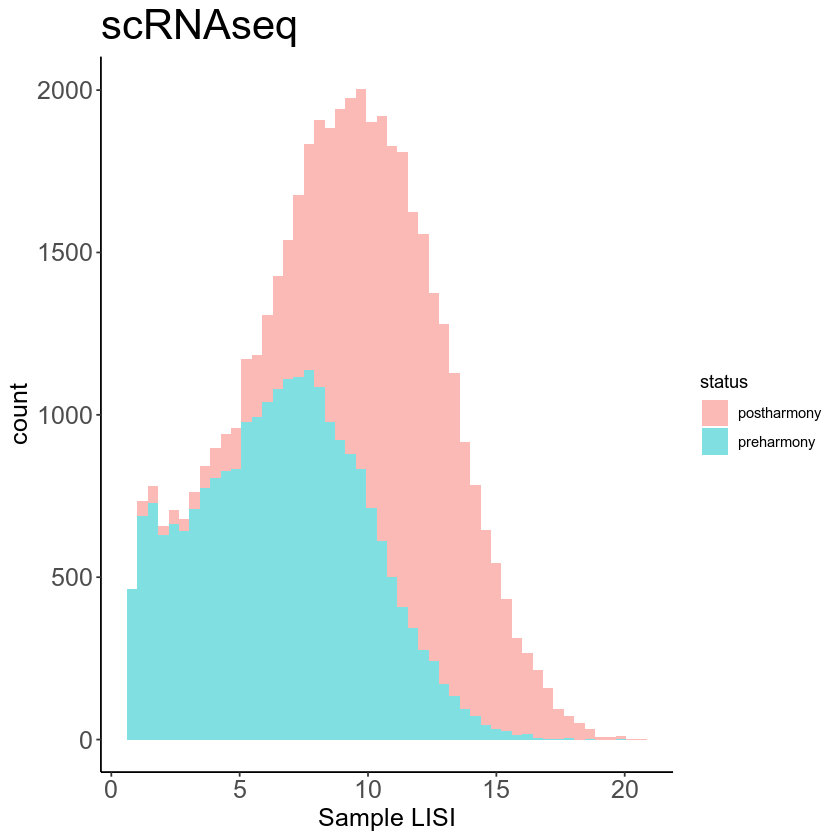

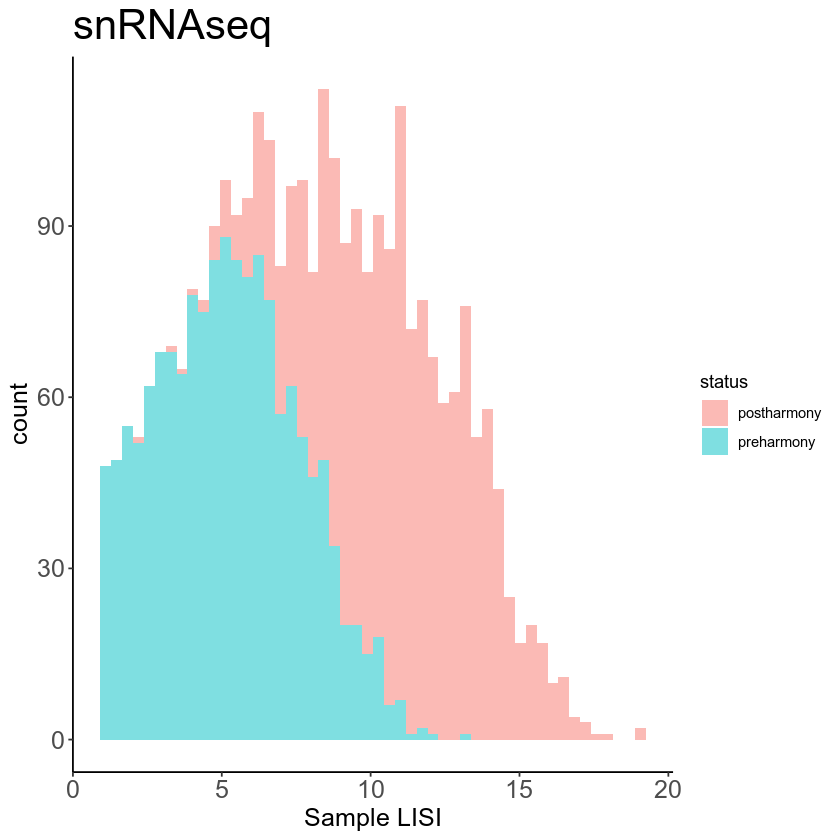

In [25]:
ggplot(sc_lisi, aes(x = Site, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Site LISI', title = 'scRNAseq')  +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 


ggplot(nuc_lisi, aes(x = Site, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Site LISI', title = 'snRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 



ggplot(sc_lisi, aes(x = processing.batch, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Processing Batch LISI', title = 'scRNAseq') + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 


ggplot(nuc_lisi, aes(x = processing.batch, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Processing Batch LISI', title = 'snRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 



ggplot(sc_lisi, aes(x = sample, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Sample LISI', title = 'scRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 


ggplot(nuc_lisi, aes(x = sample, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Sample LISI', title = 'snRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 


In [19]:
snn_ref <- BuildSNNSeurat(Myeloid_harmony_sc[,1:20], nn.eps = 0)

resolution_list <- c(2.0)
ids_ref_sc <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [20]:
snn_ref <- BuildSNNSeurat(Myeloid_harmony_nuc[,1:20], nn.eps = 0)

resolution_list <- c(1.8)
ids_ref_nuc <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [336]:
Myeloid_meta_clust <- cbind(Myeloid_meta[, c('cell', 'sample', 'Annot.separate', 'dataset', 
                                 'Site', 'Type', 'processing.batch',
                                 'nCount_RNA', 'nFeature_RNA')], ids_ref[, 9]) 
colnames(Myeloid_meta_clust)[ncol(Myeloid_meta_clust)] <- 'cluster'

In [246]:
MYL <- c("AIF1", "LYZ", "FCGR3A", "CD14")

B <- c("MS4A1", "IGHG1", "MZB1")

T <- c("CD2", "CD3D")

EC <- c("ENG", "EGFL7", "EMCN")

IC <- c("ATP6V0D2", "ATP6V1G3", "SLC26A7")

PC_DCT_CNT <- c("CALB1", "FXYD4", "AQP2")

ATL_TAL <- c("SLC12A1", "SFRP1", "EGF")

FIB <- c("COL1A2", "COL1A1", "CCDC80")

POD <- c("PTGDS", "PODXL", "NPHS2")

PT1 <- c("SLC13A3", "SLC34A1", "LRP2")

MAST <- c("TPSB2", "TPSAB1", "CPA3")

pDC <- c('IL3RA', 'JCHAIN', 'NRP1')

In [2]:
library(dplyr)
nuc_meta <- nuc_meta %>% mutate(Myeloid = colMeans(nuc_norm[rownames(nuc_norm) %in% MYL, ]),
                                        T = colMeans(nuc_norm[rownames(nuc_norm) %in% T, ]), 
                                        B = colMeans(nuc_norm[rownames(nuc_norm) %in% B, ]),
                                        EC = colMeans(nuc_norm[rownames(nuc_norm) %in% EC, ]),
                                        IC = colMeans(nuc_norm[rownames(nuc_norm) %in% IC, ]),
                                        PC = colMeans(nuc_norm[rownames(nuc_norm) %in% PC_DCT_CNT, ]),
                                        ATL = colMeans(nuc_norm[rownames(nuc_norm) %in% ATL_TAL, ]),
                                        Fib = colMeans(nuc_norm[rownames(nuc_norm) %in% FIB, ]),
                                        Pod = colMeans(nuc_norm[rownames(nuc_norm) %in% POD, ]),
                                        PT = colMeans(nuc_norm[rownames(nuc_norm) %in% PT1, ]),
                                        MAST = colMeans(nuc_norm[rownames(nuc_norm) %in% MAST, ]),
                                        pDC = colMeans(nuc_norm[rownames(nuc_norm) %in% pDC, ]),
                                        qc_cluster = ids_ref_nuc)

Warning message:
“package ‘dplyr’ was built under R version 4.1.3”

Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




ERROR: Error in mutate(., Myeloid = colMeans(nuc_norm[rownames(nuc_norm) %in% : object 'nuc_meta' not found


In [24]:
sc_meta <- sc_meta %>% mutate(Myeloid = colSums(sc_norm[rownames(sc_norm) %in% MYL, ]),
                                        T = colSums(sc_norm[rownames(sc_norm) %in% T, ]), 
                                        B = colSums(sc_norm[rownames(sc_norm) %in% B, ]),
                                        EC = colSums(sc_norm[rownames(sc_norm) %in% EC, ]),
                                        IC = colSums(sc_norm[rownames(sc_norm) %in% IC, ]),
                                        PC = colSums(sc_norm[rownames(sc_norm) %in% PC_DCT_CNT, ]),
                                        ATL = colSums(sc_norm[rownames(sc_norm) %in% ATL_TAL, ]),
                                        Fib = colSums(sc_norm[rownames(sc_norm) %in% FIB, ]),
                                        Pod = colSums(sc_norm[rownames(sc_norm) %in% POD, ]),
                                        PT = colSums(sc_norm[rownames(sc_norm) %in% PT1, ]),
                                        MAST = colSums(sc_norm[rownames(sc_norm) %in% MAST, ]),
                                        qc_cluster = ids_ref_sc)

In [25]:
nuc_meta <- left_join(nuc_meta, doublet_meta)

Joining, by = "cell"


In [26]:
sc_meta <- left_join(sc_meta , doublet_meta)

Joining, by = "cell"


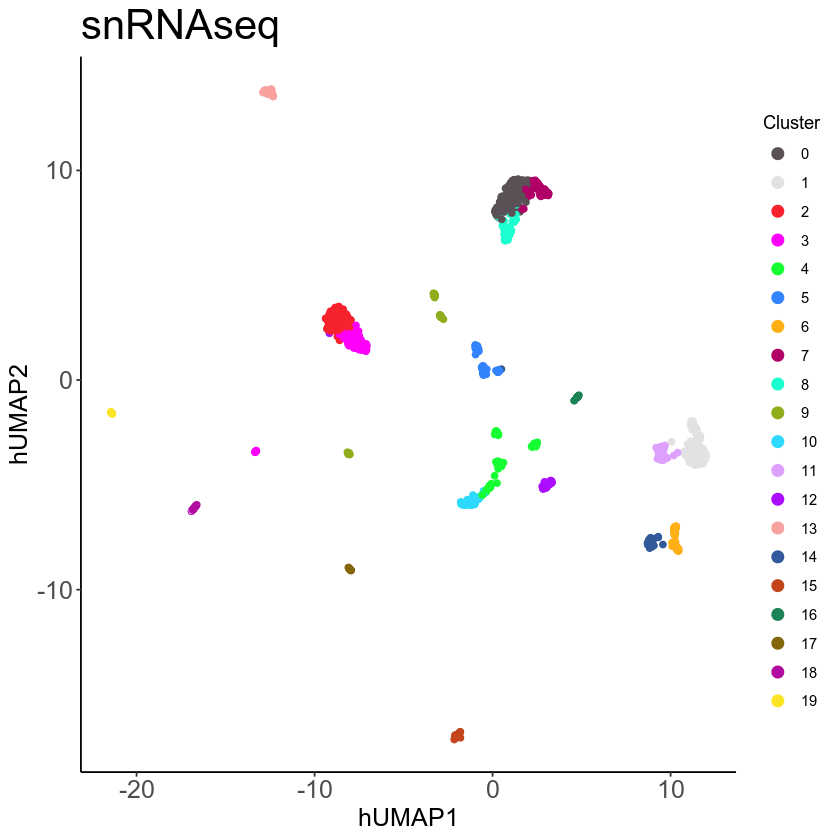

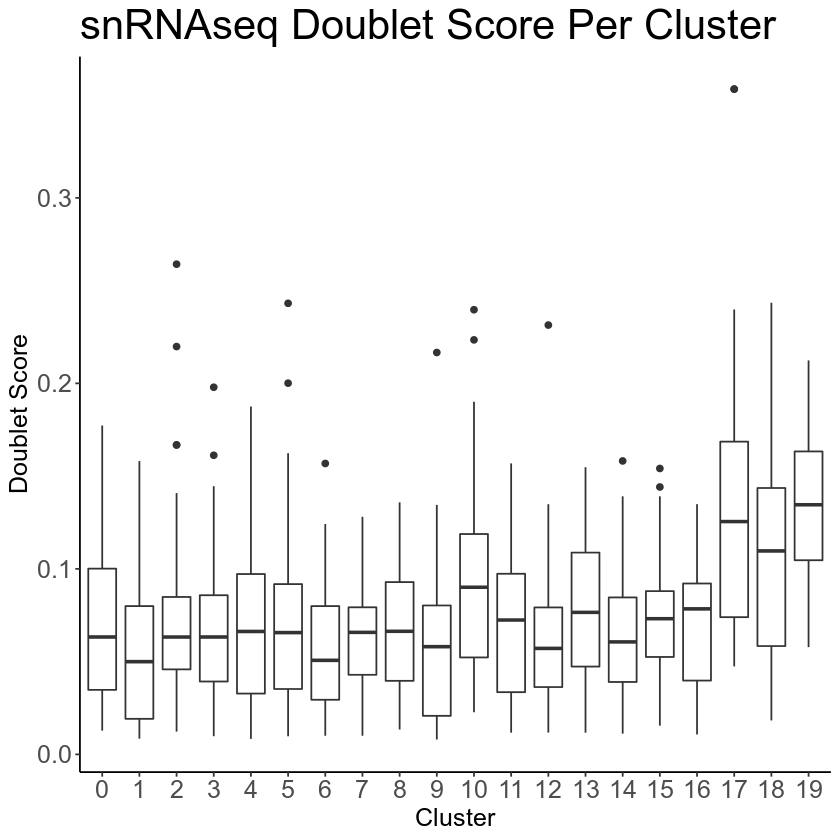

In [28]:
fig.size(7, 7)

ggplot(nuc_meta %>% mutate(hUMAP1 = myeloid_humap_res_nuc[, 1], 
                           hUMAP2 = myeloid_humap_res_nuc[, 2]), 
                           aes(x = hUMAP1, y = hUMAP2, color = as.factor(qc_cluster))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(29)), drop = FALSE) +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(title = 'snRNAseq') +
    guides(colour = guide_legend(override.aes = list(size=3), title="Cluster"))



fig.size(7, 7)
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = doublet_score)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 19))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Doublet Score', title = 'snRNAseq Doublet Score Per Cluster')

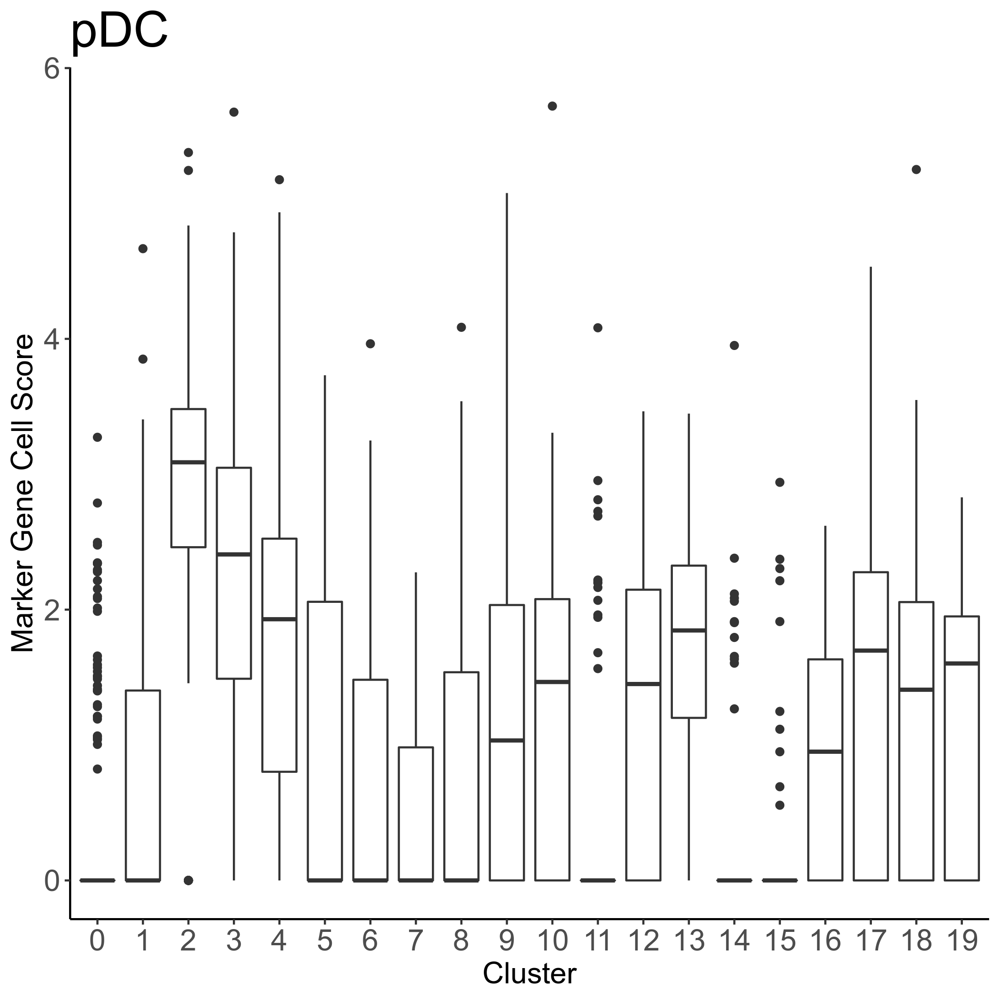

In [248]:
fig.size(7, 7)
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = pDC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 19))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Cell Score', title = 'pDC')

Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”


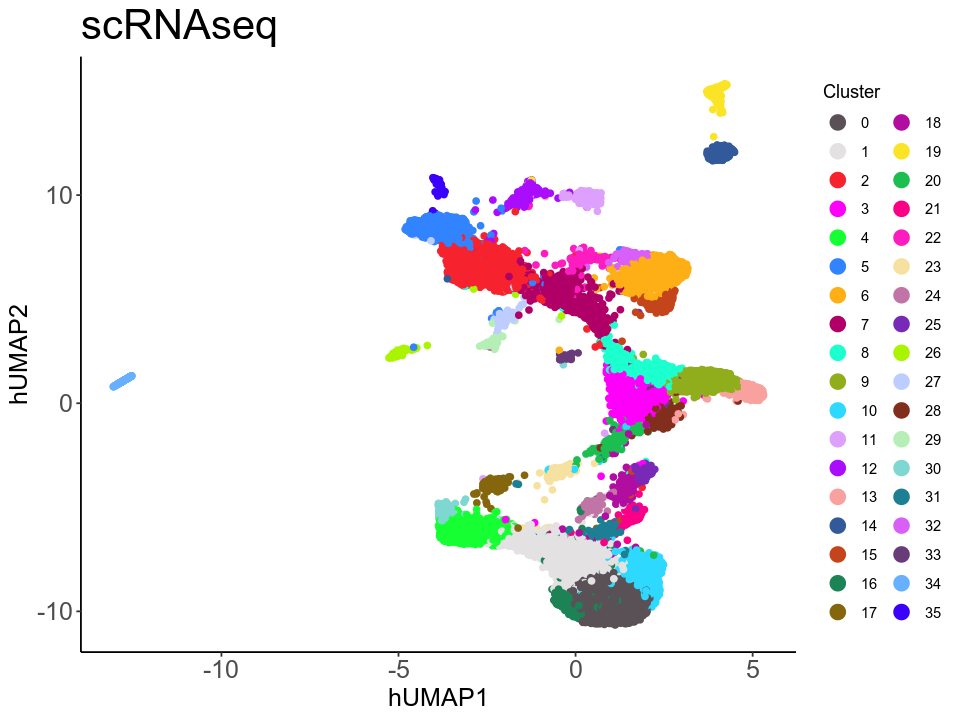

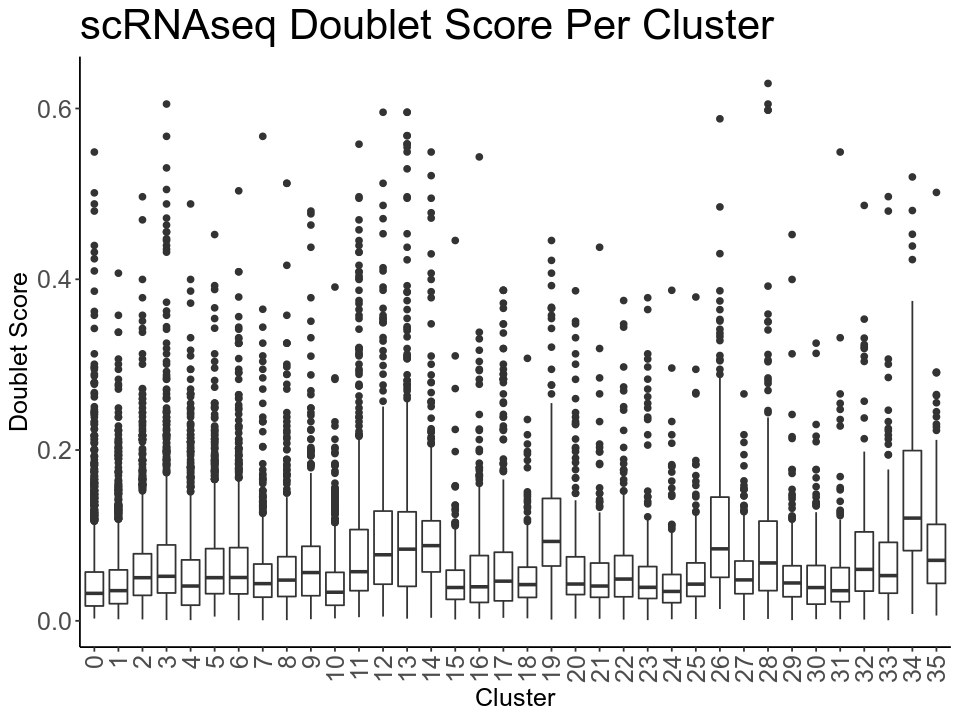

In [55]:
ggplot(sc_meta %>% mutate(hUMAP1 = myeloid_humap_res_sc[, 1], 
                           hUMAP2 = myeloid_humap_res_sc[, 2]), 
                           aes(x = hUMAP1, y = hUMAP2, color = as.factor(qc_cluster))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(36)), drop = FALSE) +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(title = 'scRNAseq') +
    guides(colour = guide_legend(override.aes = list(size=4), title="Cluster"))
fig.size(6, 8)
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = doublet_score)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Doublet Score', title = 'scRNAseq Doublet Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

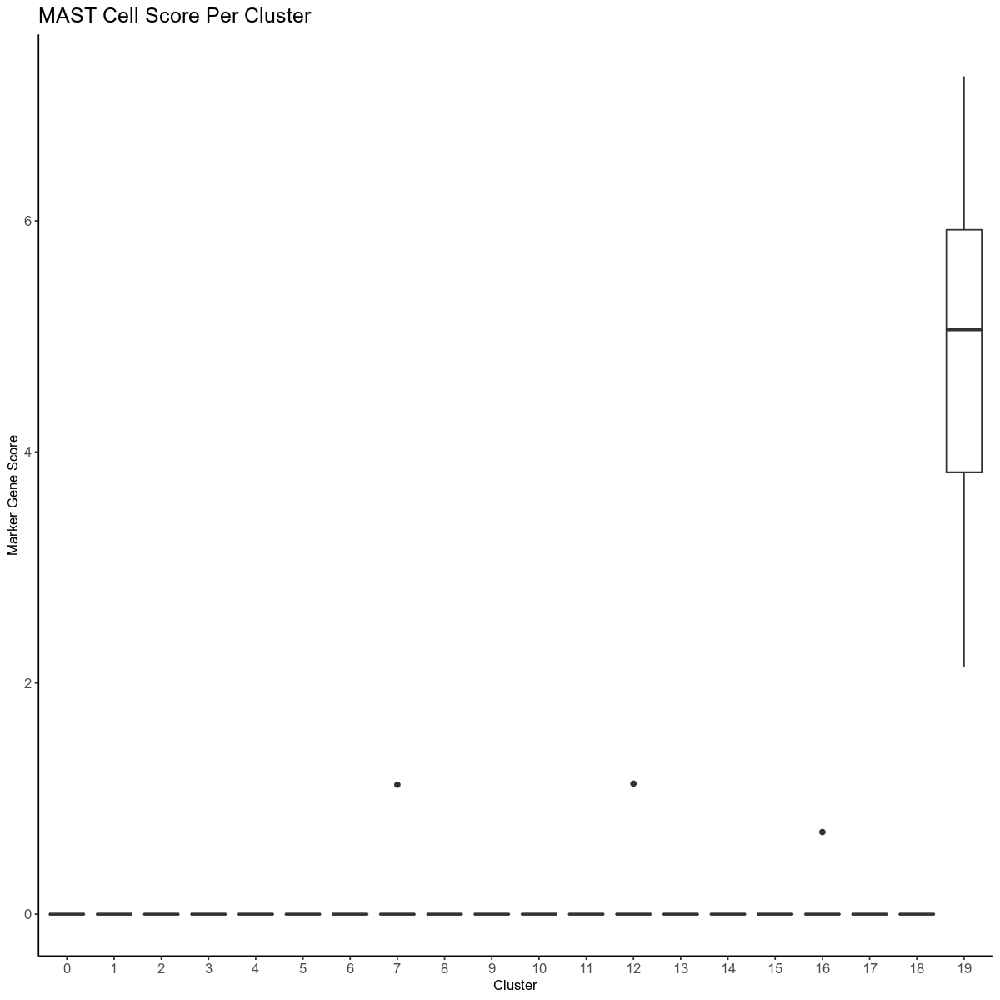

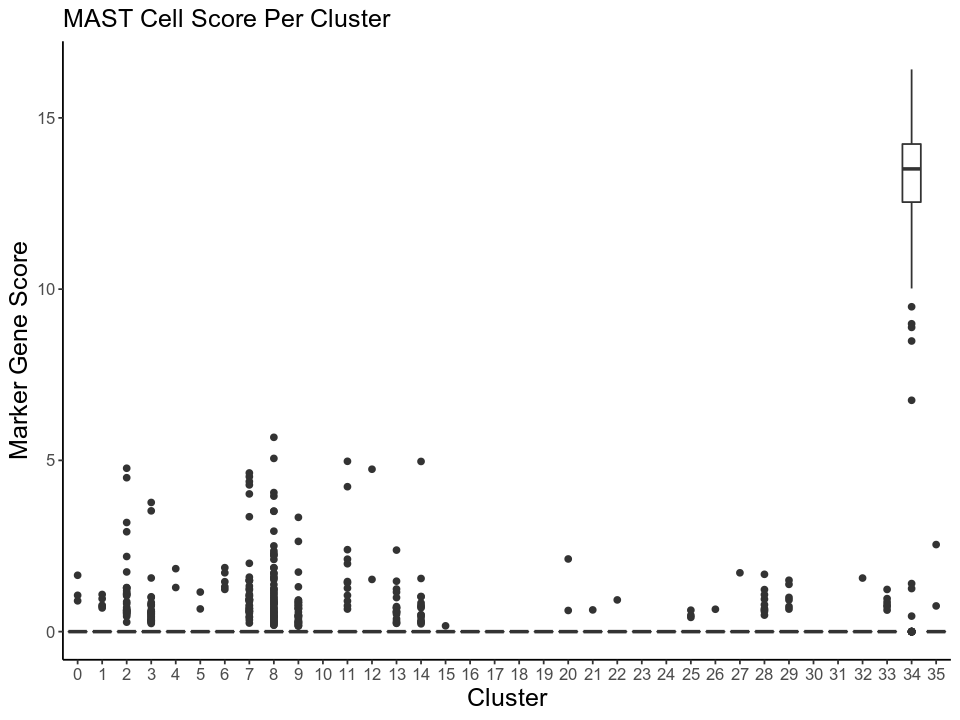

In [66]:
fig.size(10, 10)
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = MAST)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 19))) + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'MAST Cell Score Per Cluster')

fig.size(6, 8)
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = MAST)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 15), plot.title = element_text(size = 15)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'MAST Cell Score Per Cluster')

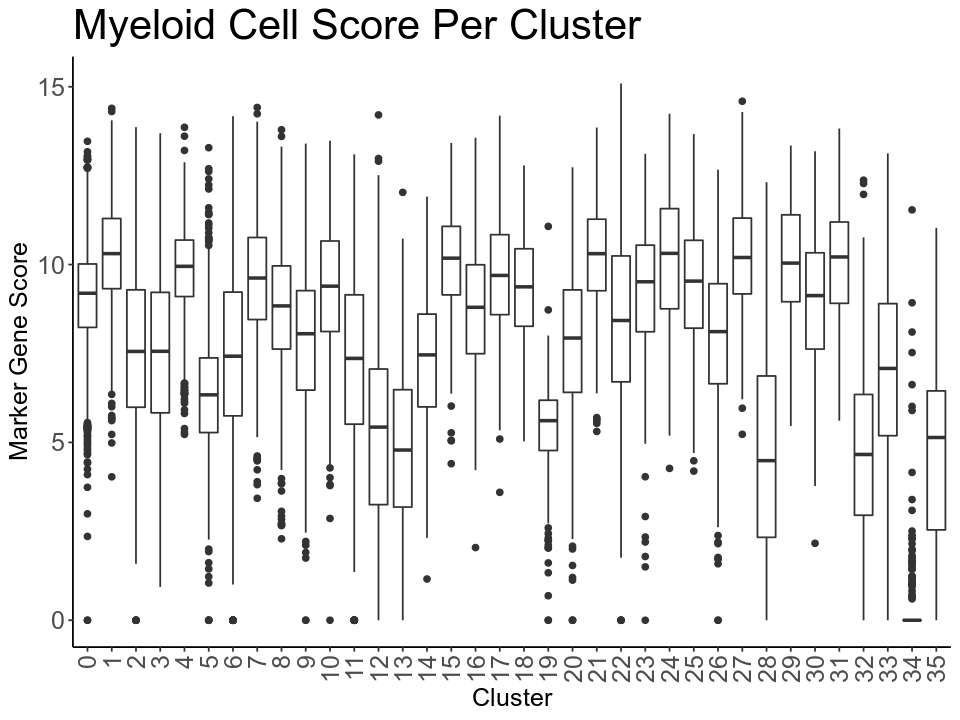

In [67]:
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = Myeloid)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'Myeloid Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

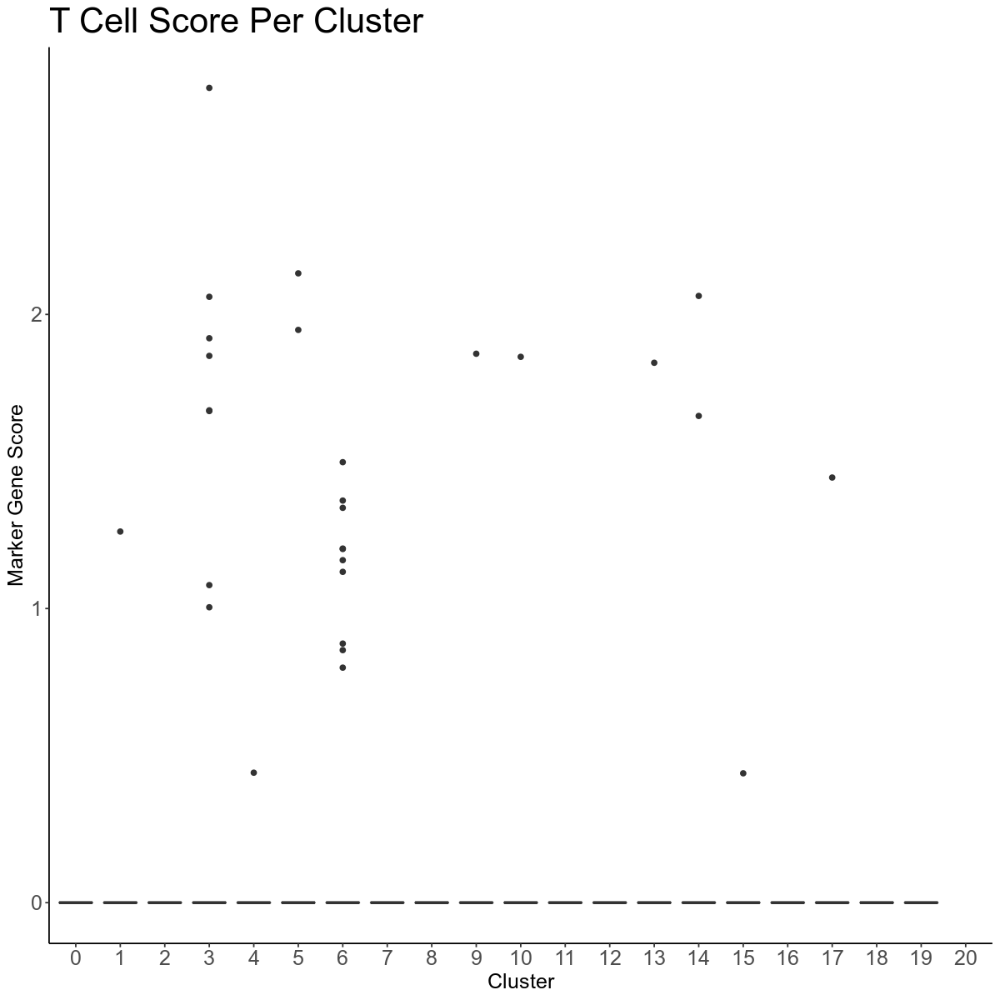

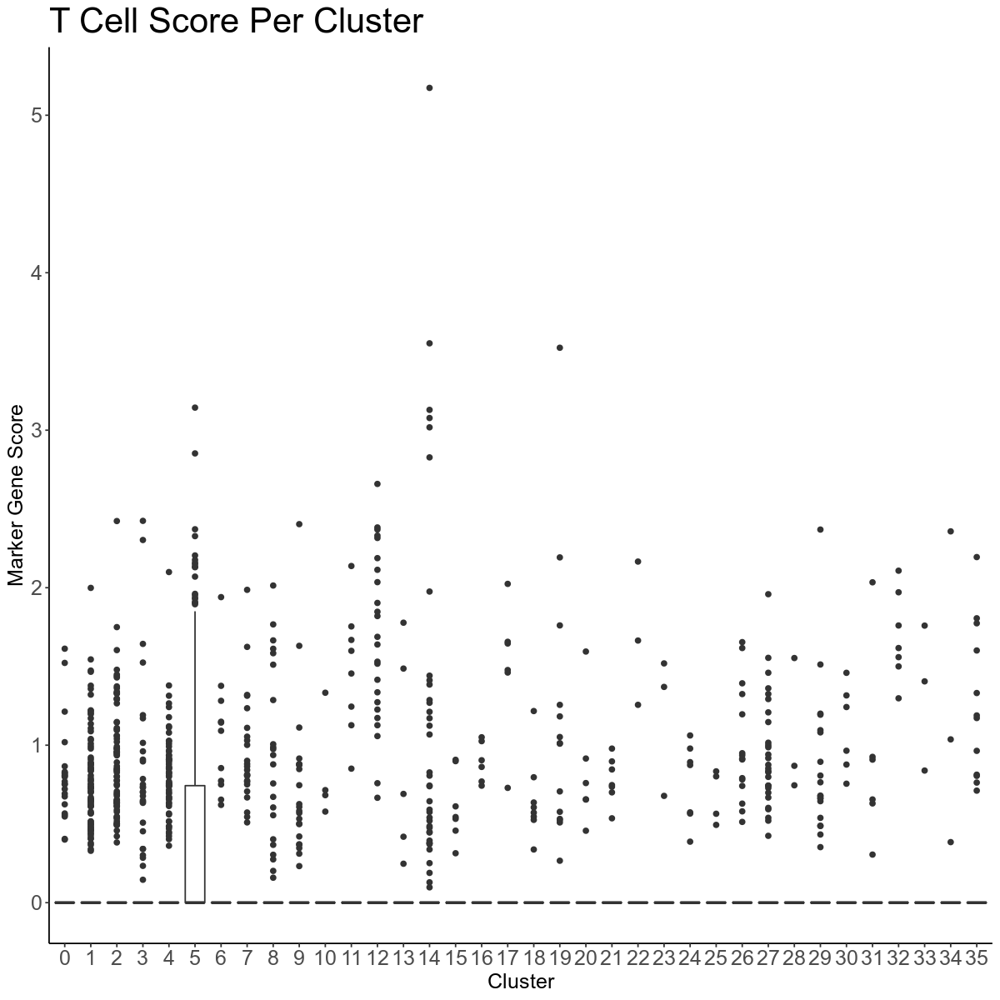

In [34]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = T)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 20))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'T Cell Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = T)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'T Cell Score Per Cluster')

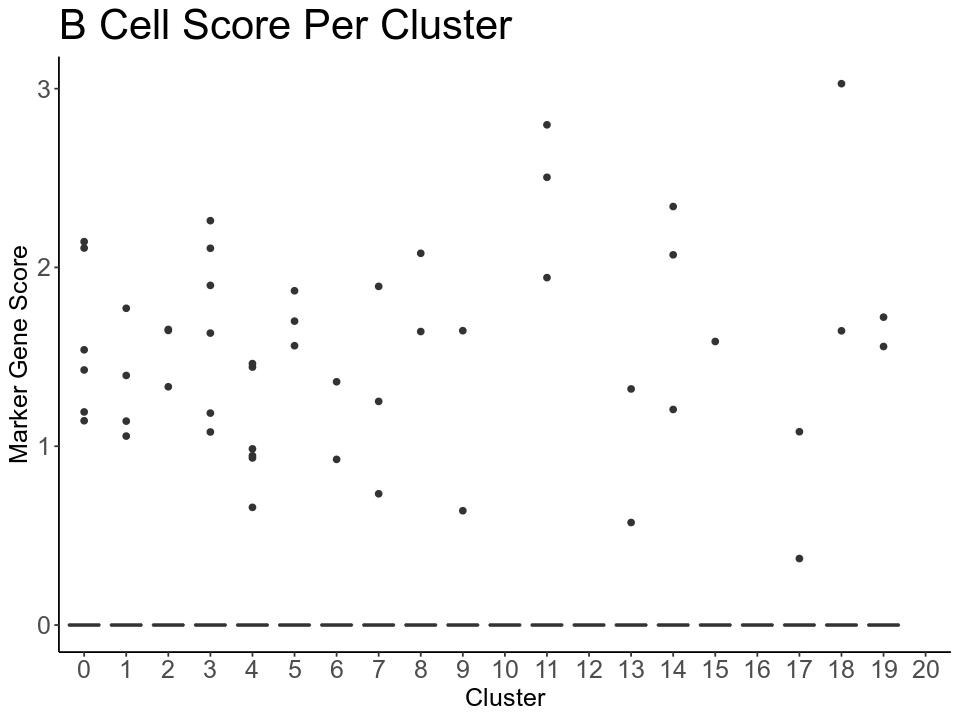

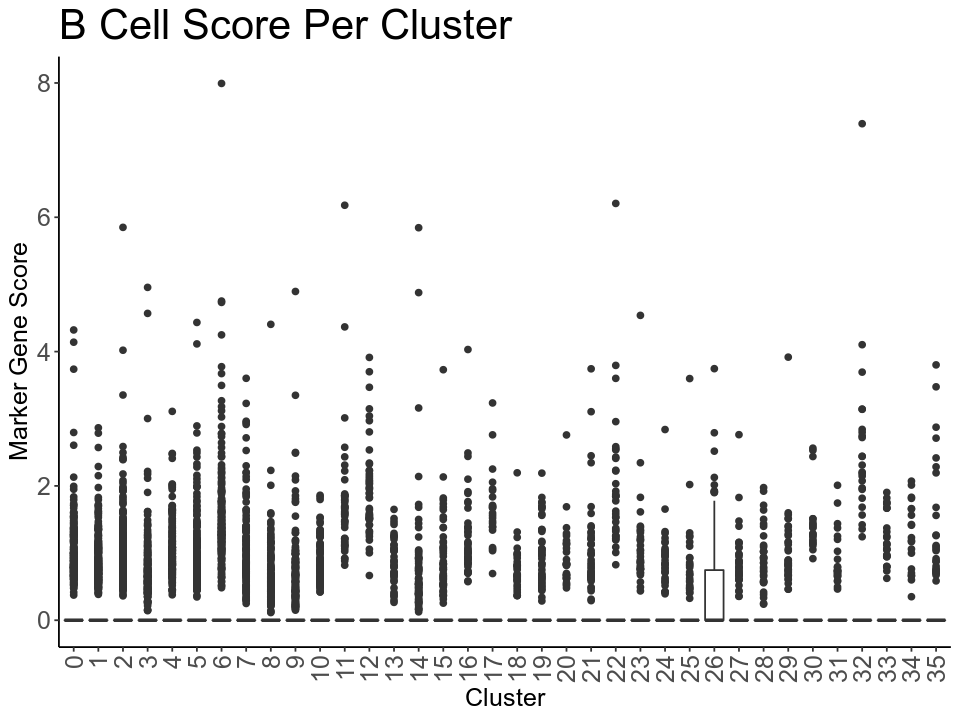

In [69]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = B)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 20))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'B Cell Score Per Cluster')

fig.size(6, 8)
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = B)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'B Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))


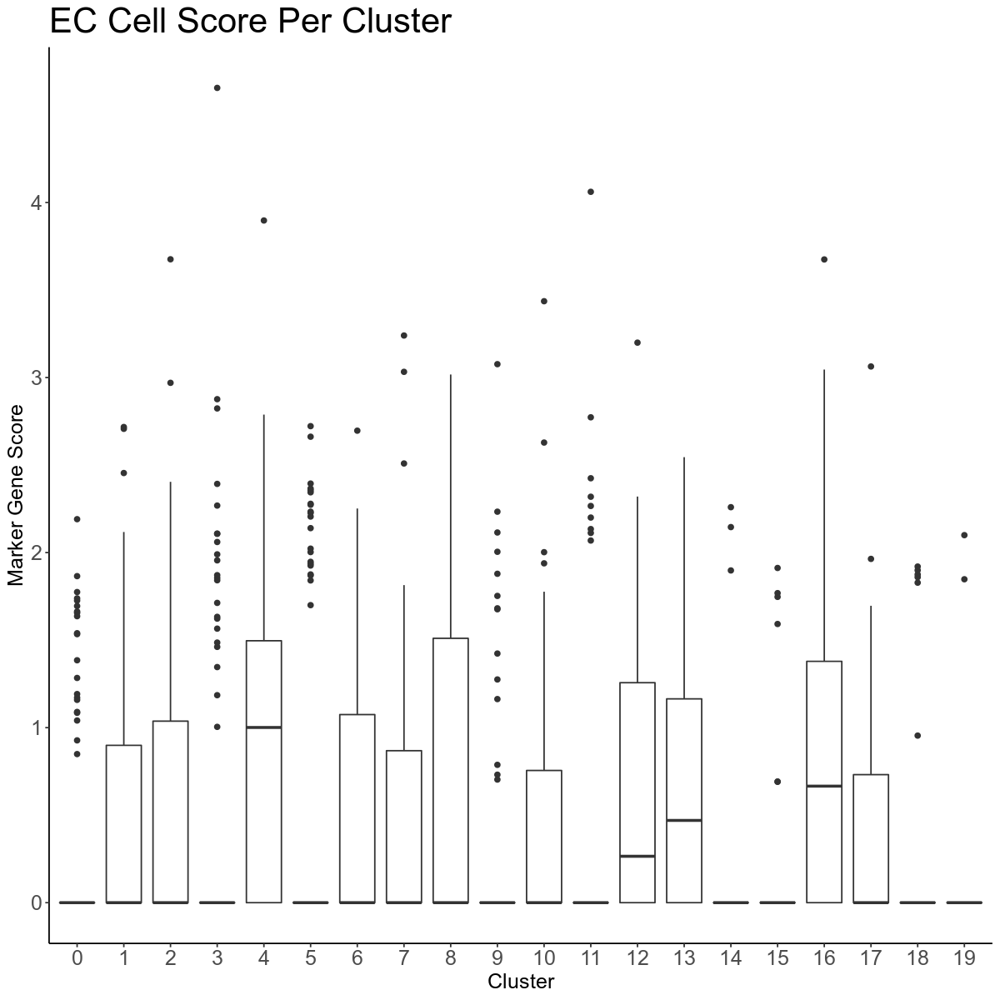

In [37]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = EC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 19))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'EC Cell Score Per Cluster')

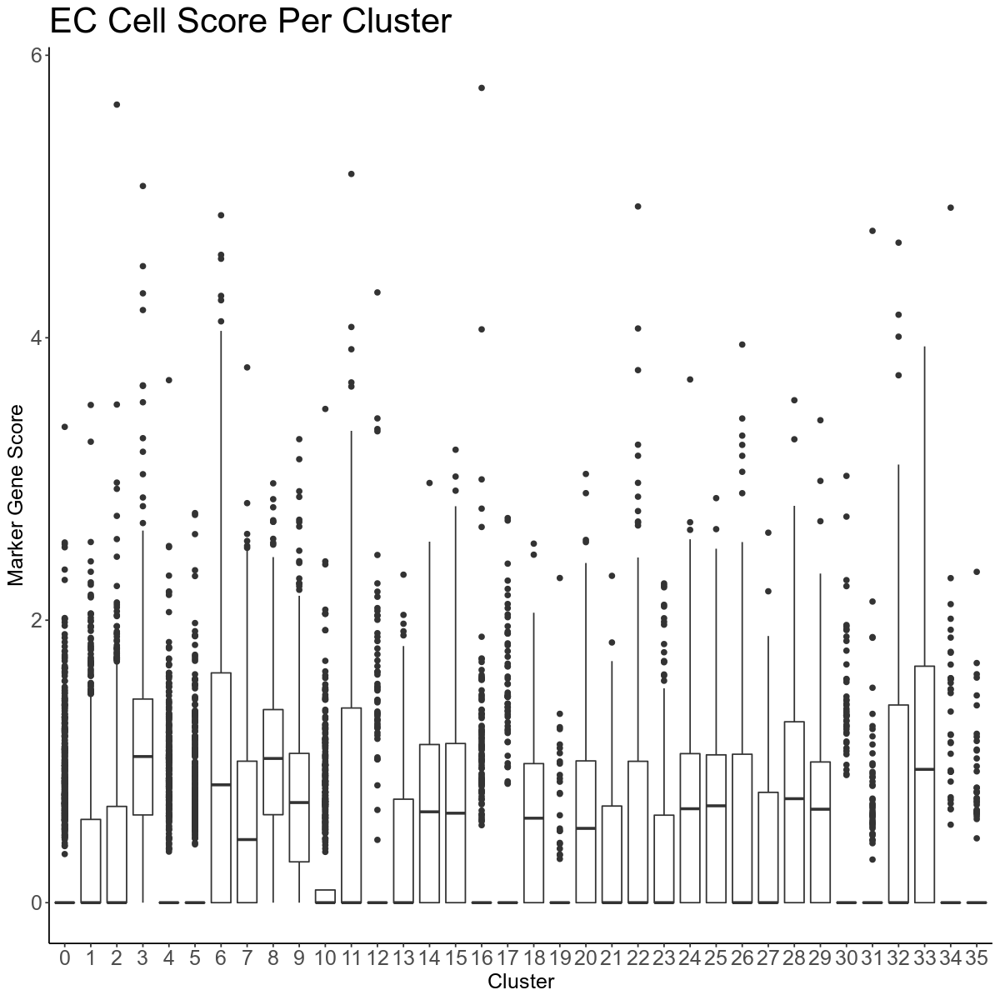

In [38]:
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = EC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'EC Cell Score Per Cluster')

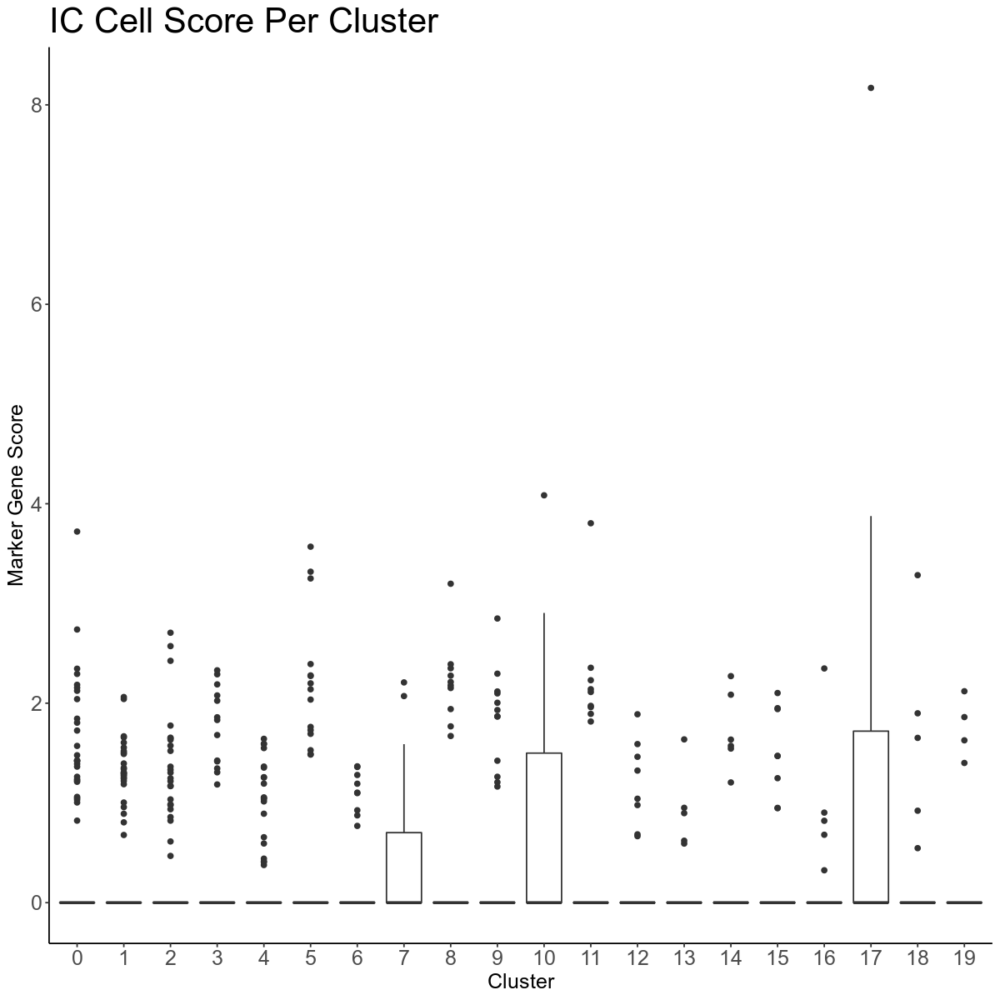

In [40]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = IC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 19))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'IC Cell Score Per Cluster')

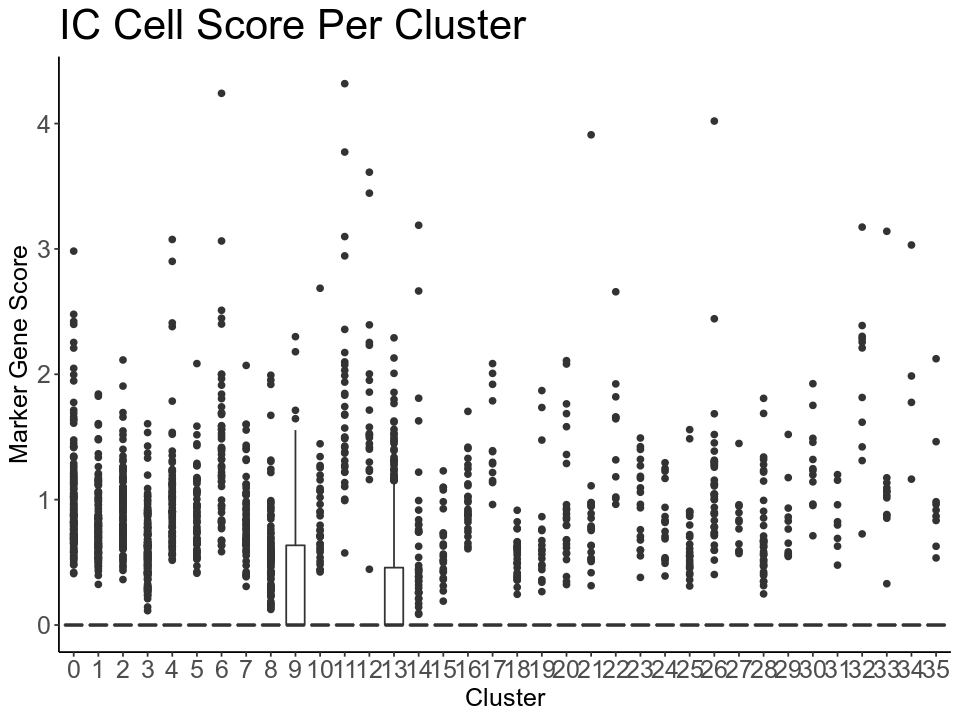

In [70]:
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = IC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'IC Cell Score Per Cluster')

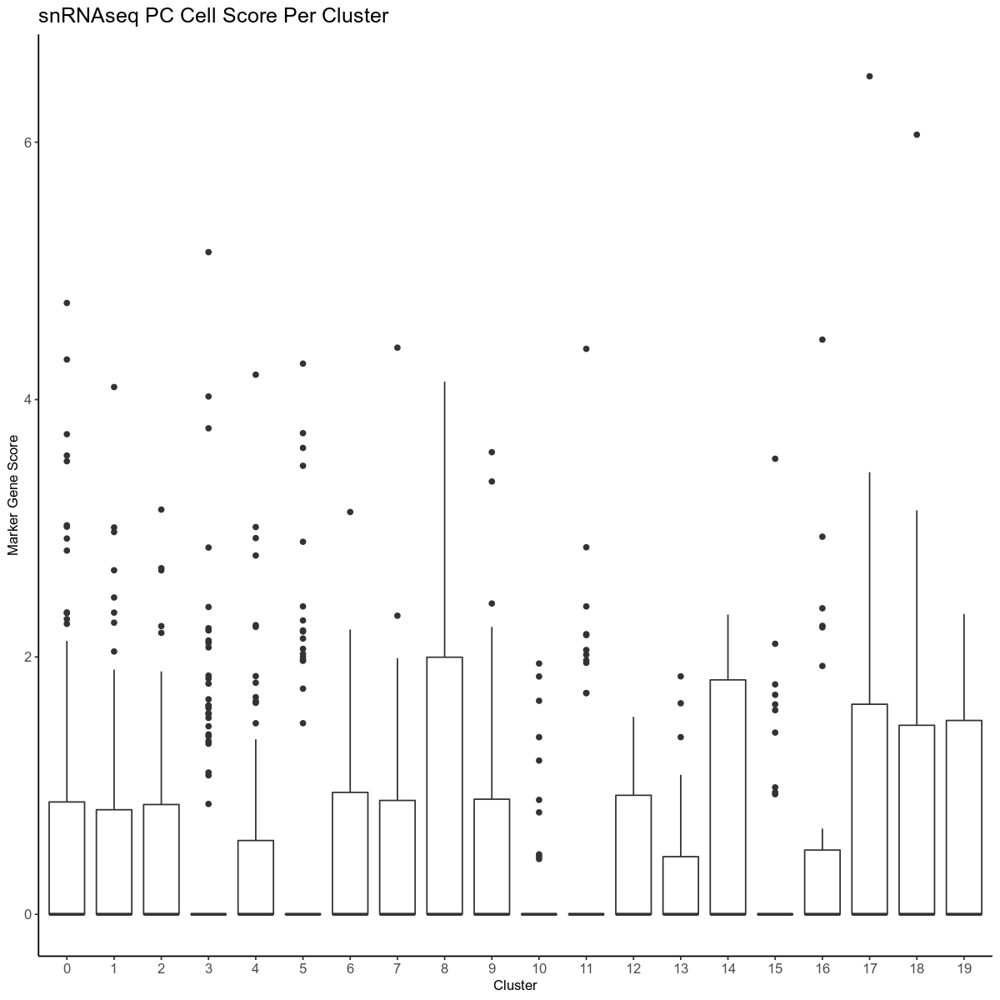

In [43]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = PC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 19))) + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq PC Cell Score Per Cluster')

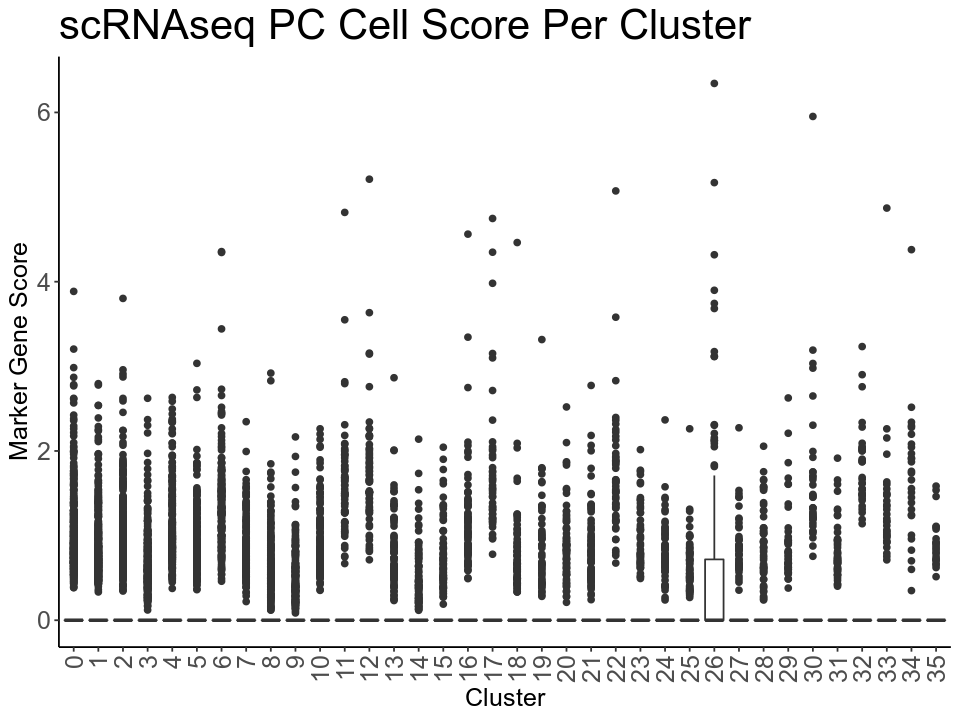

In [71]:
fig.size(6, 8)
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = PC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'scRNAseq PC Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

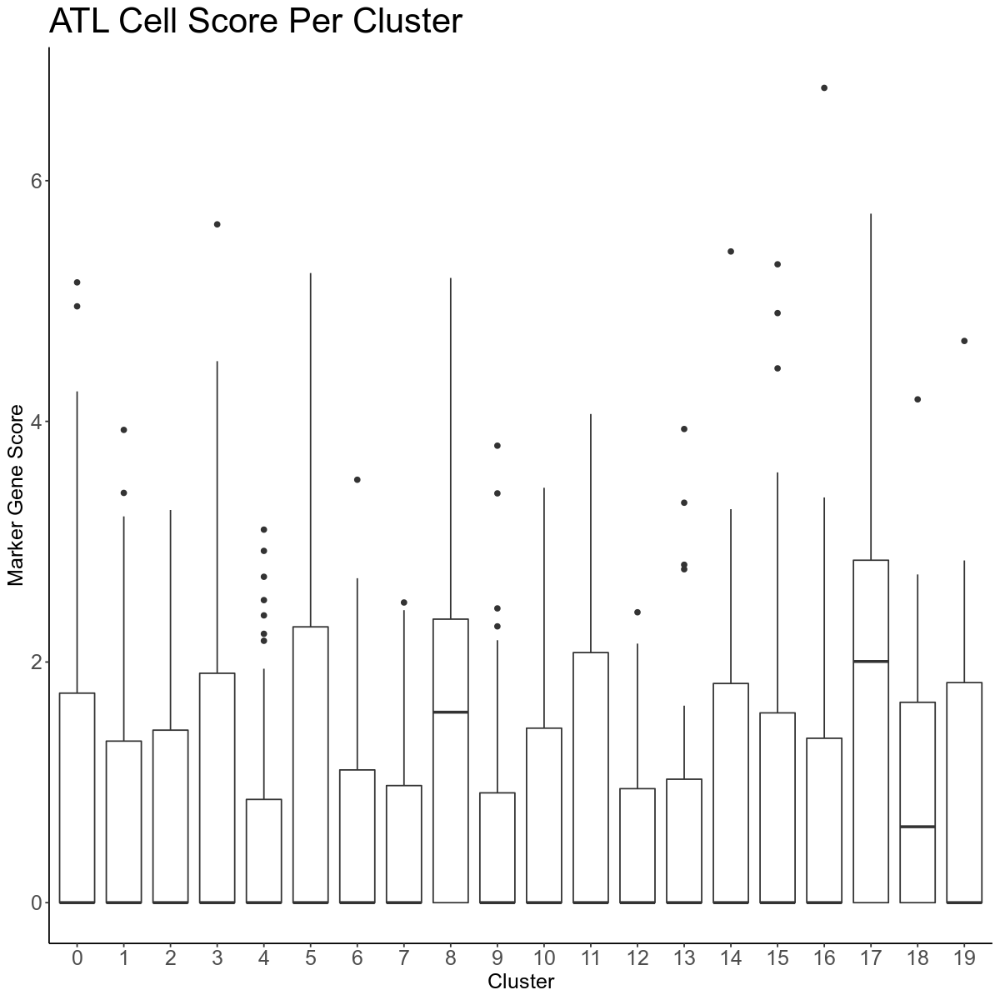

In [47]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = ATL)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 19))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'ATL Cell Score Per Cluster')

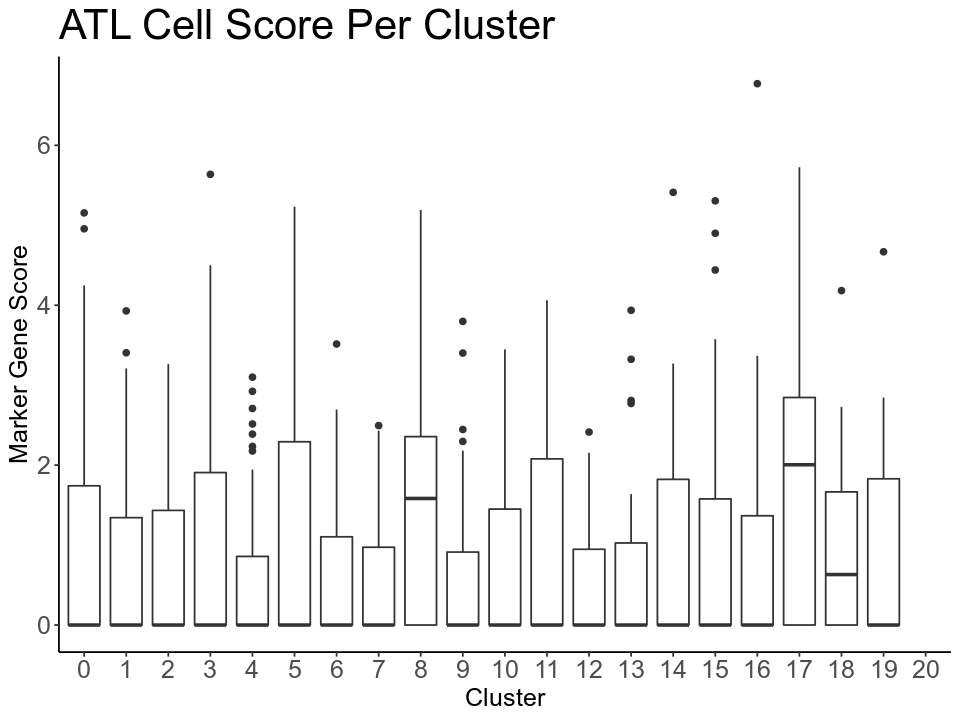

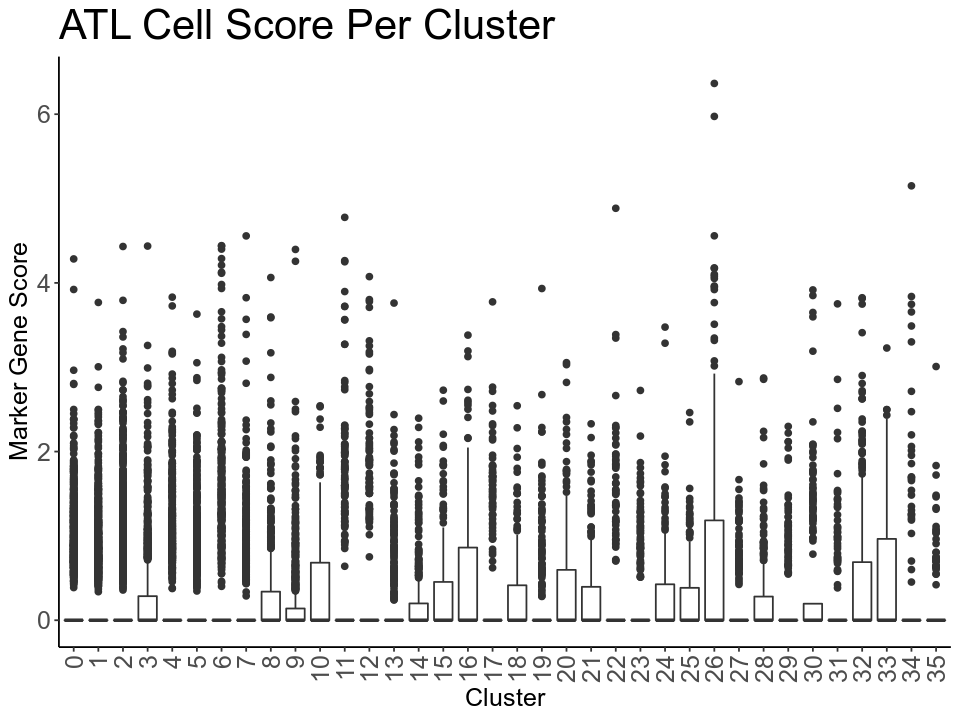

In [72]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = ATL)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 20))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'ATL Cell Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = ATL)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'ATL Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

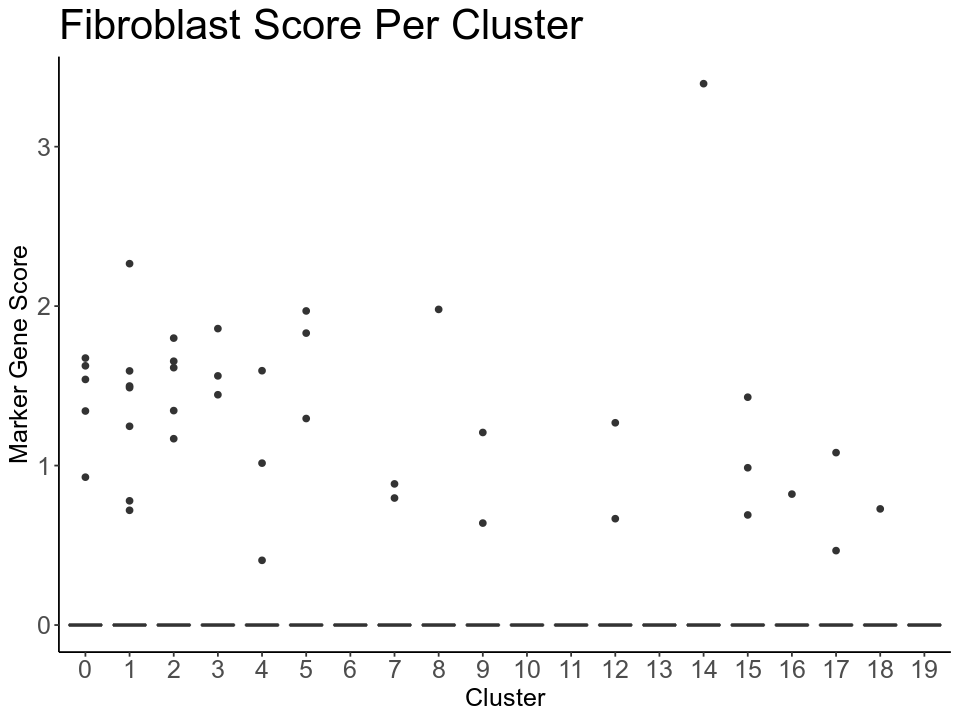

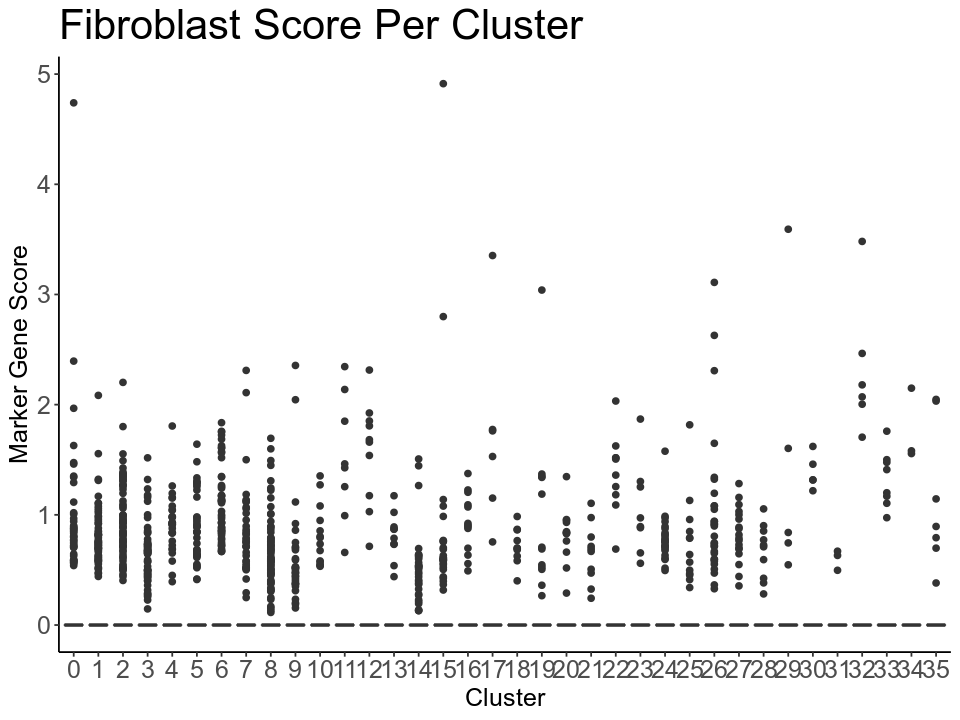

In [73]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = Fib)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 19))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'Fibroblast Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = Fib)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'Fibroblast Score Per Cluster')

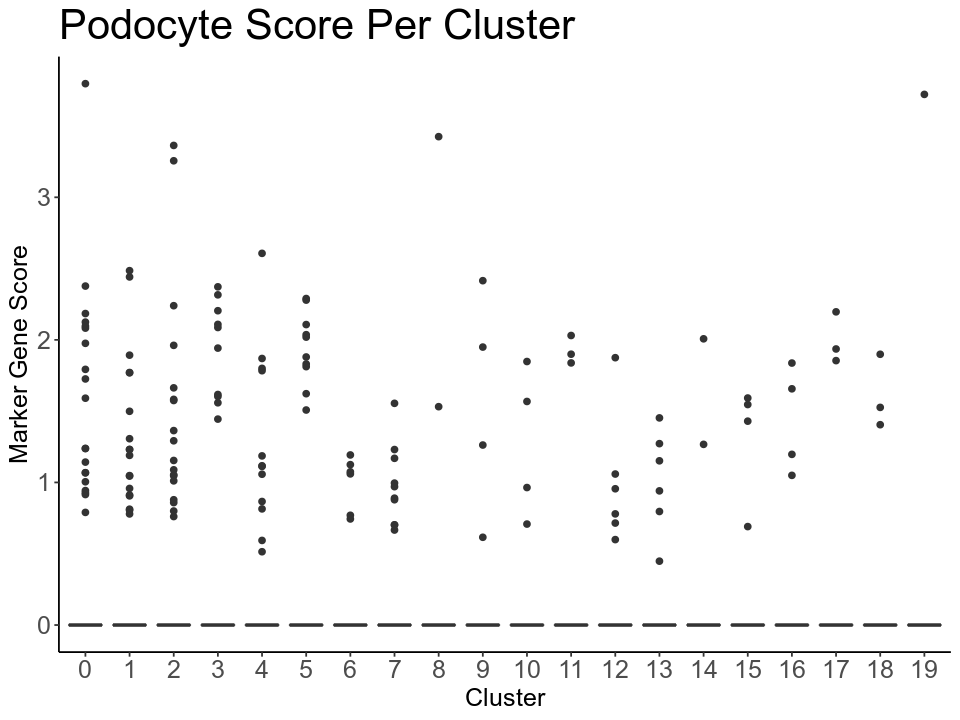

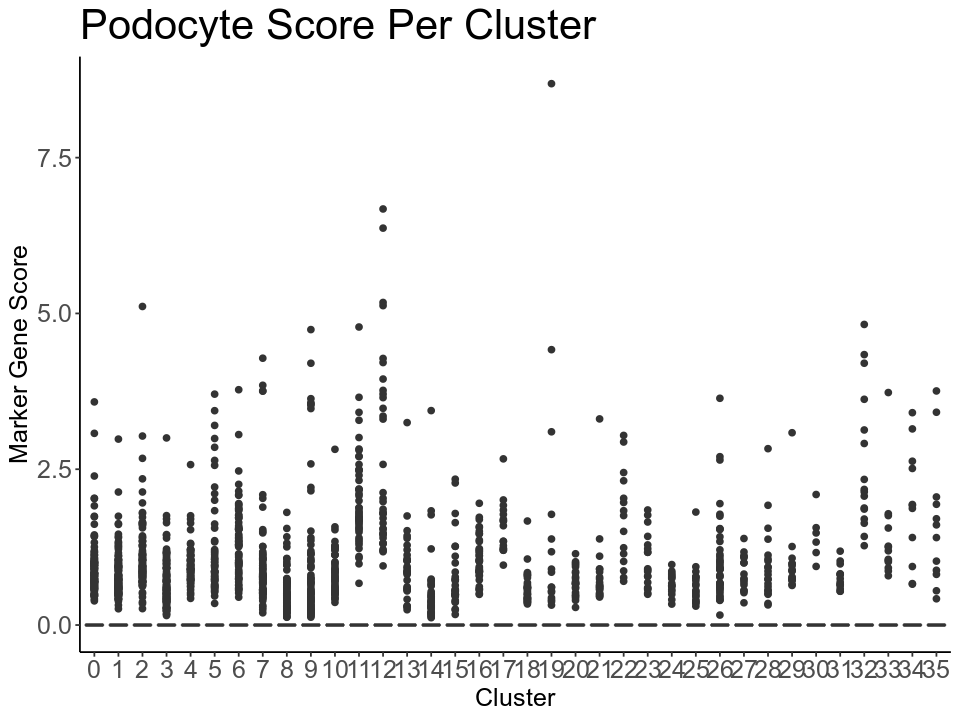

In [74]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = Pod)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 19))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'Podocyte Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = Pod)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'Podocyte Score Per Cluster')

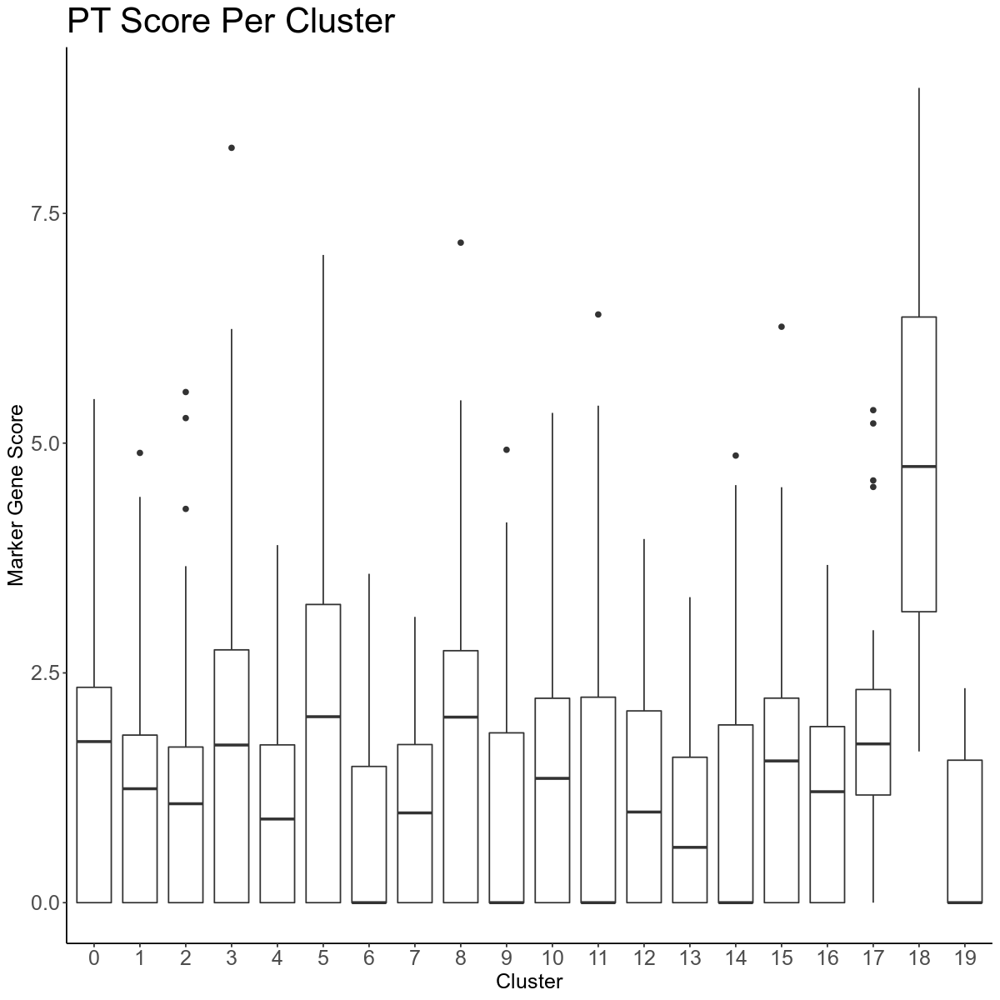

In [52]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = PT)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 19))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'PT Score Per Cluster')

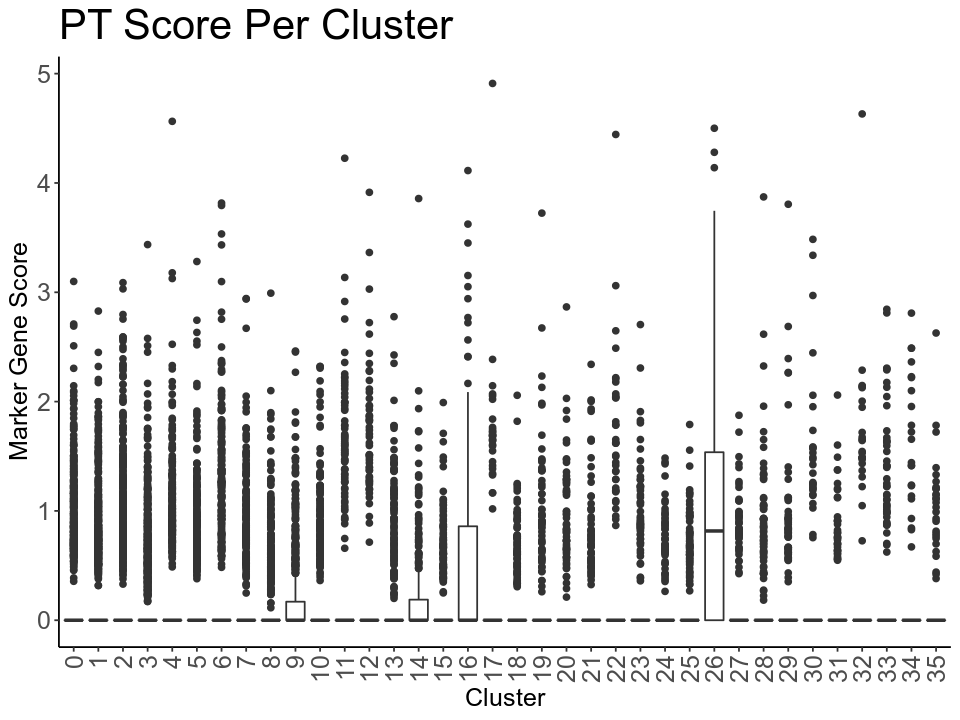

In [76]:
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = PT)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 35))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'PT Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

In [82]:
qcd_sc_meta <- sc_meta %>% filter(qc_cluster != 26)
qcd_sc_norm <- sc_norm[, qcd_sc_meta$cell]

qcd_sn_meta <- nuc_meta %>% filter(qc_cluster != 17, qc_cluster != 18)
qcd_sn_norm <- nuc_norm[, qcd_sn_meta$cell]

In [245]:
saveRDS(nuc_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_singlenuc_clustered_meta_08262022.rds')
saveRDS(sc_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_singlecell_clustered_meta_08262022.rds')

In [124]:
sc_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_singlecell_clustered_meta_08262022.rds')
sc_norm <- Myeloid_norm[, sc_meta$cell]
nuc_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_singlenuc_clustered_meta_08262022.rds')
nuc_norm <- Myeloid_norm[, nuc_meta$cell]

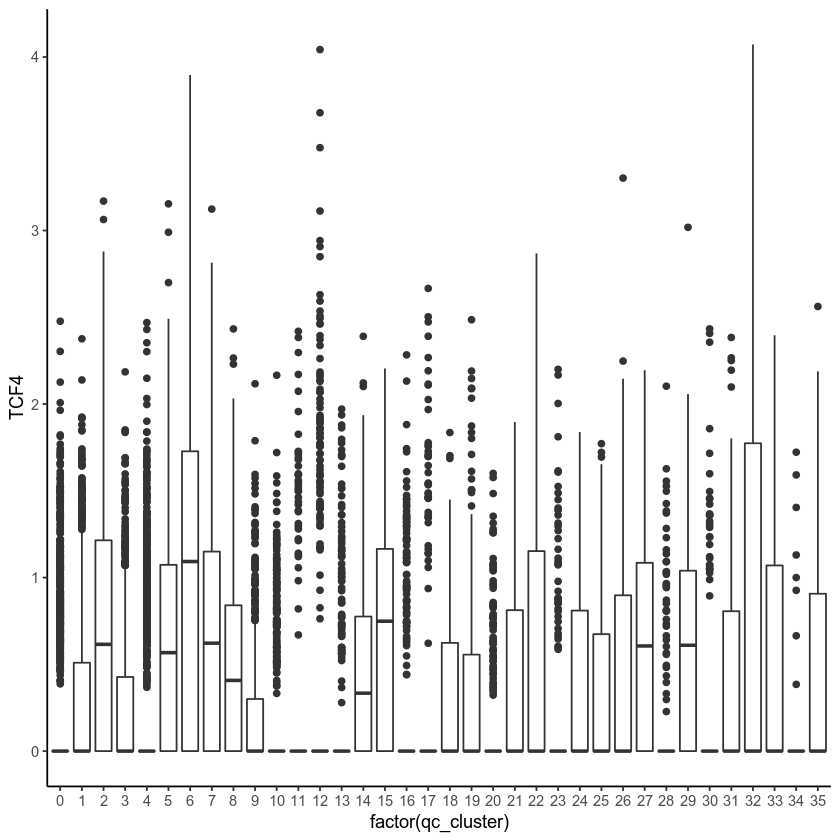

In [139]:
ggplot(sc_meta %>% mutate(TCF4 = sc_norm['TCF4', ]), aes(x = factor(qc_cluster), y = TCF4)) + 
    geom_boxplot() +
    theme_classic()

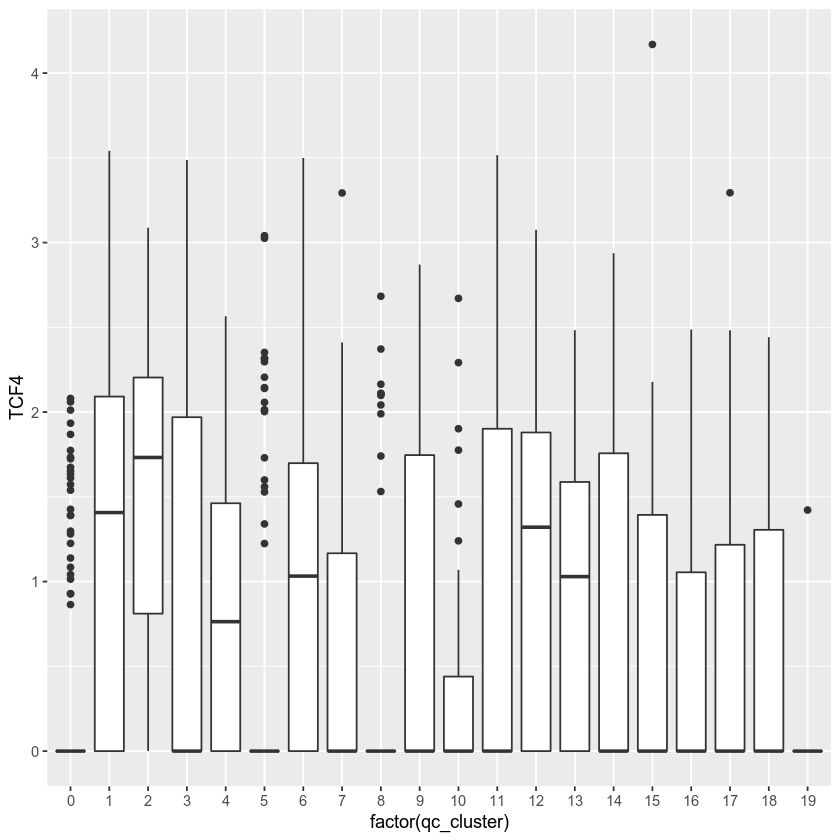

In [141]:
ggplot(nuc_meta %>% mutate(TCF4 = nuc_norm['TCF4', ]), aes(x = factor(qc_cluster), y = TCF4)) + 
    geom_boxplot()

In [83]:
qcd_sc_norm <- qcd_sc_norm[, match(qcd_sc_meta$cell, colnames(qcd_sc_norm))]
qcd_sn_norm <- qcd_sn_norm[, match(qcd_sn_meta$cell, colnames(qcd_sn_norm))]

In [84]:
qcd_norm <- cbind(qcd_sc_norm, qcd_sn_norm)
qcd_meta <- rbind(qcd_sc_meta, qcd_sn_meta)

In [87]:
saveRDS(qcd_norm, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_norm_08262022.rds')
saveRDS(qcd_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_meta_08262022.rds')

### Single Dataset Harmonized Embeddings for CNA

In [480]:
genes_exclude <- c(grep("^MT-|^RPL|^RPS|MALAT1|MIR-", row.names(norm), value = TRUE), Seurat::cc.genes$s.genes, Seurat::cc.genes$g2m.genes) 

In [468]:
sc_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_singlecell_clustered_meta_08262022.rds')
sc_norm <- Myeloid_norm[, sc_meta$cell]
nuc_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_singlenuc_clustered_meta_08262022.rds')
nuc_norm <- Myeloid_norm[, nuc_meta$cell]

In [474]:
qcd_sc_meta <- sc_meta %>% filter(cell %in% qcd_meta$cell)
qcd_sc_norm <- sc_norm[, qcd_sc_meta$cell]
qcd_nuc_meta <- nuc_meta %>% filter(cell %in% qcd_meta$cell)
qcd_nuc_norm <- nuc_norm[, qcd_nuc_meta$cell]

#### snRNAseq

In [478]:
## Filtering for expressed genes
threshold_genes <- qcd_nuc_norm[rownames(nuc_norm[rowMeans(qcd_nuc_norm) >= .01, ]), ]

samples_25 <- qcd_nuc_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, qcd_nuc_meta %>% filter(sample %in% samples_25) %>% pull(cell)]
 
## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 10 cells
var_genes_raw <- singlecellmethods::vargenes_vst(object = threshold_samples, groups = qcd_nuc_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [481]:
## Scale Data
myeloid_scaled_nuc <- qcd_nuc_norm[var_genes_raw[! var_genes_raw %in% genes_exclude], ] %>% scaleData
## PCA
myeloid_pca_res_nuc <- irlba::prcomp_irlba(t(myeloid_scaled_nuc), 20)

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



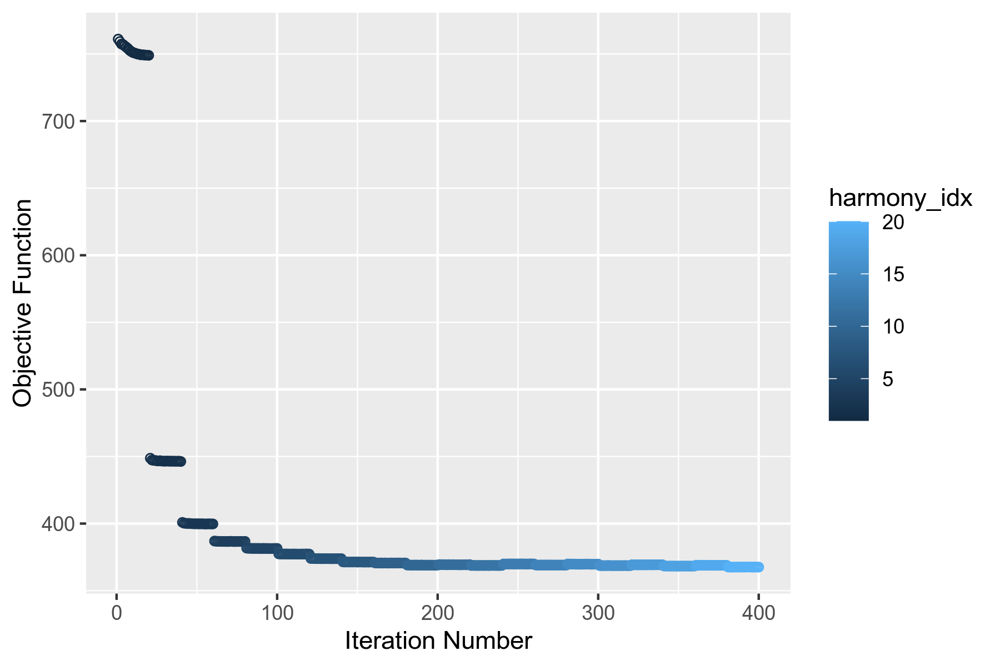

In [483]:
Myeloid_harmony_nuc <- HarmonyMatrix(myeloid_pca_res_nuc$x[, 1:20], qcd_nuc_meta, 
                                     vars_use = c("sample", "processing.batch", "Site"), theta = c(1.5, 1, 1),
                        # lambda = 1, 
                        # tau = 0, 
                        epsilon.cluster = -Inf,
                        epsilon.harmony = -Inf,
                        max.iter.cluster = 20,
                        max.iter.harmony = 20,
                        plot_convergence = TRUE,
                        npcs = 20, do_pca = FALSE)

In [484]:
myeloid_humap_res_nuc <- uwot::umap(Myeloid_harmony_nuc[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [502]:
Myeloid_harmony_nuc <- Myeloid_harmony_nuc %>% data.frame()
rownames(Myeloid_harmony_nuc) <- qcd_nuc_meta$cell
myeloid_humap_res_nuc <- myeloid_humap_res_nuc %>% data.frame()
rownames(myeloid_humap_res_nuc) <- qcd_nuc_meta$cell
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_meta.csv')

In [504]:
Myeloid_harmony_nuc <- Myeloid_harmony_nuc[meta$cell, ]
myeloid_humap_res_nuc <- myeloid_humap_res_nuc[meta$cell, ]

In [510]:
write.csv(Myeloid_harmony_nuc, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_harmony_singledataset.csv', row.names = FALSE, quote = FALSE)
write.csv(myeloid_humap_res_nuc, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_umap_singledataset.csv', row.names = FALSE, quote = FALSE)

#### scRNAseq

In [507]:
## Filtering for expressed genes
threshold_genes <- qcd_sc_norm[rownames(qcd_sc_norm[rowMeans(qcd_sc_norm) >= .01, ]), ]

samples_25 <- qcd_sc_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, qcd_sc_meta %>% filter(sample %in% samples_25) %>% pull(cell)]
 
## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 10 cells
var_genes_raw <- singlecellmethods::vargenes_vst(object = threshold_samples, groups = qcd_sc_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [508]:
## Scale Data
myeloid_scaled_sc <- qcd_sc_norm[var_genes_raw[! var_genes_raw %in% genes_exclude], ] %>% scaleData
## PCA
myeloid_pca_res_sc <- irlba::prcomp_irlba(t(myeloid_scaled_sc), 20)

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



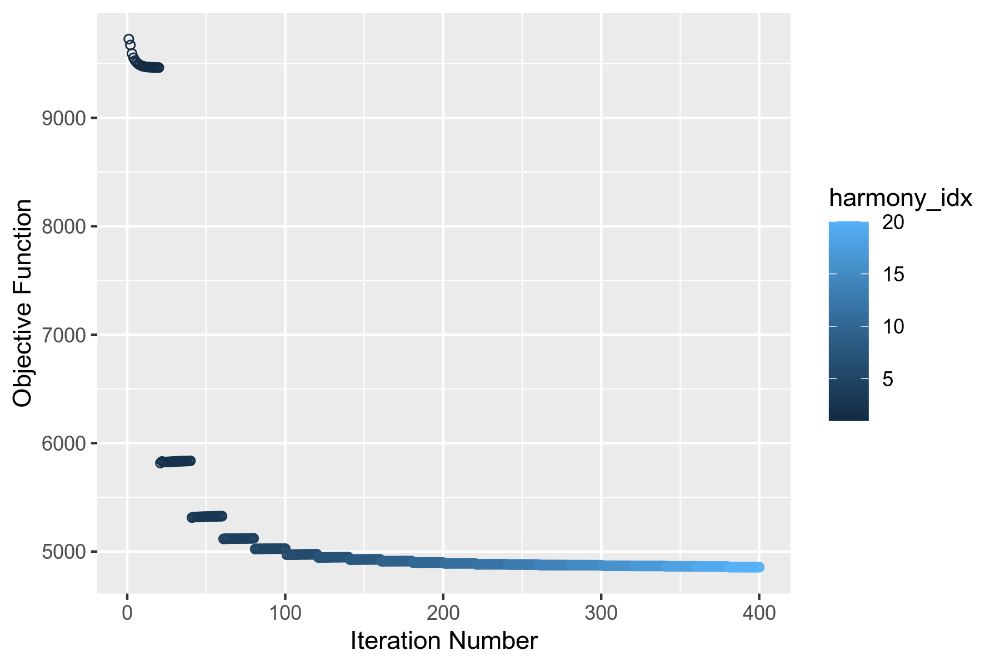

In [511]:
Myeloid_harmony_sc <- HarmonyMatrix(myeloid_pca_res_sc$x[, 1:20], qcd_sc_meta, 
                                     vars_use = c("sample", "processing.batch", "Site"), theta = c(1.5, 1, 1),
                        # lambda = 1, 
                        # tau = 0, 
                        epsilon.cluster = -Inf,
                        epsilon.harmony = -Inf,
                        max.iter.cluster = 20,
                        max.iter.harmony = 20,
                        plot_convergence = TRUE,
                        npcs = 20, do_pca = FALSE)

In [512]:
myeloid_humap_res_sc <- uwot::umap(Myeloid_harmony_sc[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [542]:
Myeloid_harmony_sc <- Myeloid_harmony_sc %>% data.frame()
rownames(Myeloid_harmony_sc) <- qcd_sc_meta$cell
myeloid_humap_res_sc <- myeloid_humap_res_sc %>% data.frame()
rownames(myeloid_humap_res_sc) <- qcd_sc_meta$cell
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_meta.csv')

In [543]:
Myeloid_harmony_sc <- Myeloid_harmony_sc[meta$cell, ]
myeloid_humap_res_sc <- myeloid_humap_res_sc[meta$cell, ]

In [546]:
write.csv(Myeloid_harmony_sc, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_harmony_singledataset.csv', row.names = FALSE, quote = FALSE)
write.csv(myeloid_humap_res_sc, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_umap_singledataset.csv', row.names = FALSE, quote = FALSE)

### Weighted PCA

In [27]:
library(harmony)
library(singlecellmethods)
library(dplyr)
library(RSpectra)
library(ggplot2)
library(presto)

In [28]:
# weighted PCA is in immunogenomics/singlecellmethods, function weighted_pca
weighted_pca <- function(X, weights, genes_use=NULL, npc=20, do_corr=TRUE, scale_thresh=10) {
    if (!identical(length(weights), ncol(X))) {
        stop('Columns in X must match length of weights')
    }
    
#     y <- factor(y)
#     weights <- as.numeric((1 / prop.table(table(y)))[y]) / nlevels(y)
    if (any(is.na(weights))) {
        idx_keep <- which(is.na(weights))
#         y <- y[idx_keep]
        weights <- weights[idx_keep]
        X <- X[, idx_keep]
    }
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    } else if (length(genes_use) < nrow(X)) {
        if (any(!genes_use %in% row.names(X))) {
            stop('genes_use not in rownames of X')
        }
        X <- X[genes_use, ]
    }
    
    ## weighted z-scores
#     mu <- X %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
#     sig <- X %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    mu <- singlecellmethods::rowMeans(X, weights = weights)
    sig <- singlecellmethods::rowSDs(X, weights = weights)
    
    # Added 12/9/19: save weighted scaling means and std devs
    vargenes_means_sds <- tibble(
        symbol = genes_use,
        mean = mu
    )
    vargenes_means_sds$stddev <- sig
    # finish added 12/9/19
    
    X <- scaleDataWithStats(X, mu, sig) 
    X <- X[which(is.na(rowSums(X)) == 0), ]
    if (do_corr) {
        X <- X %>% scale() %>% pmin(scale_thresh) %>% pmax(-scale_thresh)
    }
    
    ## weighted SVD
#     pres <- rsvd::rsvd(X %*% Matrix::Diagonal(x = sqrt(weights)), k = npc)
    pres <- RSpectra::svds(X %*% Matrix::Diagonal(x = sqrt(weights)), npc)
    V <- (Matrix::Diagonal(x = 1 / sqrt(weights)) %*% pres$v) %*% diag(pres$d)
    V <- as.matrix(V)
    colnames(V) <- paste0('PC', 1:npc)
    row.names(V) <- colnames(X)
    colnames(pres$u) <- paste0('PC', 1:npc)
    row.names(pres$u) <- row.names(X)
    return(list(loadings = pres$u, embeddings = V, vargenes = vargenes_means_sds))
}

# Cosine normalize values
cosine_normalize <- function(X, MARGIN = 1, do_safe = TRUE) {
    if (do_safe) {
        X <- sweep(X, MARGIN, apply(X, MARGIN, max), "/")
    }
    sweep(X, MARGIN, apply(X, MARGIN, function(x) sqrt(sum(x^2))), "/")
}
                           
                                                    
do_pca <- function(X, weights, genes_use=NULL, npc=10, do_corr=TRUE) {
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    }
    mu <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
    sig <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    
    X <- X[genes_use, ] %>% scaleDataWithStats(mu, sig) 
    X <- X[which(is.na(rowSums(X)) == 0), ]
    if (do_corr) {
        X <- scale(X)
    }
    pres <- rsvd::rsvd(X, k = npc)
    V <- pres$v %*% diag(pres$d)
    V <- data.table(V)
    colnames(V) <- paste0('PC', 1:npc)
    return(V)    
}
                           
get_stats <- function(X, weights, genes_use=NULL) {
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    }
    mu <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
    sig <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    return(list(mu = mu, sig = sig))
}
                           
                           
plot_shuffled_features <- function(ab, umap, exprs, pct) {
    library(viridis)
    max.cutoff = quantile(exprs[ab,], pct)
    min.cutoff = quantile(exprs[ab,], 1-pct)
    
    tmp <- sapply(X = exprs[ab,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
    umap_res_plot <- cbind(umap, tmp)
    return(ggplot(data = as.data.frame(umap_res_plot)[sample(nrow(umap_res_plot)),] , aes(x = V1, y = V2)) +
      geom_point(mapping = aes(color = tmp), size = 0.75) +
      scale_color_viridis(option = "inferno", end = pct) +
      theme_classic() +
      theme(plot.title = element_text(size = 15), legend.position = "none") +
      labs(title = ab, x = 'hUMAP1', y = 'hUMAP2', color = "Normalized Expression"))
}
                           fig.size <- function (height, width) {
    options(repr.plot.height = height, repr.plot.width = width, repr.plot.res = 300)
}
                           
                           
vargenes_vst <- function(object, groups, topn, loess.span = 0.3) {
    clip.max <- sqrt(ncol(object))

    N <- ncol(object)
    if (missing(groups)) {
        groups <- rep('A', N)
    }
    
    res <- split(seq_len(N), groups) %>% lapply(function(idx) {
        object_group <- object[, idx]
        ## row means
        hvf.info <- data.frame(
          symbol = rownames(object_group), 
          mean = Matrix::rowMeans(object_group)
        )

        ## row vars
        hvf.info$variance <- rowVars(object_group, hvf.info$mean)

        ## initialize
        hvf.info$variance.expected <- 0
        hvf.info$variance.standardized <- 0

        not.const <- hvf.info$variance > 0

        ## loess curve fit 
        suppressWarnings({
            fit <- loess(formula = log10(variance) ~ log10(mean), 
                data = hvf.info[not.const, ], span = loess.span)            
        })

        ## extract fitted variance 
        hvf.info$variance.expected[not.const] <- 10^fit$fitted

        ## get row standard deviations after clipping
        hvf.info$variance.standardized <- rowVarsStd(
            object_group, 
            hvf.info$mean, 
            sqrt(hvf.info$variance.expected), 
            clip.max
        )

        hvf.info <- hvf.info %>% 
#             tibble::rownames_to_column('symbol') %>% 
            arrange(-variance.standardized) %>% 
            tibble::rowid_to_column('rank') %>% 
            transform(group = unique(groups[idx]))

        return(hvf.info)        
    })
    
    
    if (missing(topn)) {
        ## MODE 1: return table 
        res <- Reduce(rbind, res) %>% 
            dplyr::select(group, symbol, rank, everything())

        if (length(unique(res$group)) == 1) {
            res$group <- NULL
        }
    } else {
        ## MODE 2: return genes
        res <- lapply(res, function(x) head(x, topn)$symbol)
    }
    return(res)
}

In [29]:
genes_exclude <- c(grep("^MT-|^RPL|^RPS|MALAT1|MIR-", row.names(norm), value = TRUE), 
                   Seurat::cc.genes$s.genes, Seurat::cc.genes$g2m.genes) 

In [6]:
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_norm_08262022.rds')
#qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_meta_08262022.rds')

#### Add pDCs

In [31]:
pDC_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/pDC_clusterQCd_norm_09232022.rds')
pDC_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/pDC_clusterQCd_meta_09232022.rds')

In [44]:
qcd_norm <- cbind(qcd_norm, pDC_norm)

In [35]:
qcd_meta <- rbind(qcd_meta[, colnames(qcd_meta)[colnames(qcd_meta) %in% colnames(pDC_meta)]], 
                  pDC_meta[, colnames(qcd_meta)[colnames(qcd_meta) %in% colnames(pDC_meta)]])

In [ ]:
## Filtering for expressed genes
threshold_genes <- qcd_norm[rownames(qcd_norm[rowMeans(qcd_norm) >= .01, ]), ]

samples_25 <- qcd_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, qcd_meta %>% filter(sample %in% samples_25) %>% pull(cell)]

## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 100 cells
var_genes_raw <- vargenes_vst(object = threshold_samples, groups = qcd_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [ ]:
#Separate variable genes by Dataset
var_genes_raw_nuc <- vector()
var_genes_raw_sc <- vector()

for (i in 1:length(var_genes_raw)) {
    if (grepl('nuc', names(var_genes_raw)[i])) {
        var_genes_raw_nuc <- c(var_genes_raw_nuc, var_genes_raw[[i]])
    }
    else {
        var_genes_raw_sc <- c(var_genes_raw_sc, var_genes_raw[[i]])   
    }

}

var_genes_raw_nuc <- var_genes_raw_nuc %>% unique()
var_genes_raw_sc <- var_genes_raw_sc %>% unique() 
#Find intersection
var_genes <- intersect(var_genes_raw_nuc, var_genes_raw_sc)

In [ ]:
var_genes %>% length()

In [50]:
## Scale Data
myeloid_scaled <- qcd_norm[var_genes[!var_genes %in% genes_exclude], ] %>% scaleData()

In [51]:
table(qcd_meta$dataset)
y <- factor(qcd_meta$dataset)
weights <- as.numeric((1 / prop.table(table(y)))[y]) / nlevels(y)
length(weights)
table(weights)


scRNAseq snRNAseq 
   24084     1494 

[1] 25578

weights
0.53101644245142 8.56024096385542 
           24084             1494 

In [52]:
myeloid_scaled <- as(myeloid_scaled, 'dgCMatrix')

In [53]:
weighted_pca_res <- weighted_pca(myeloid_scaled, weights, rownames(myeloid_scaled), 20, TRUE, 10)$embeddings

use_weights



[1] TRUE


use_weights

use_weights



[1] TRUE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



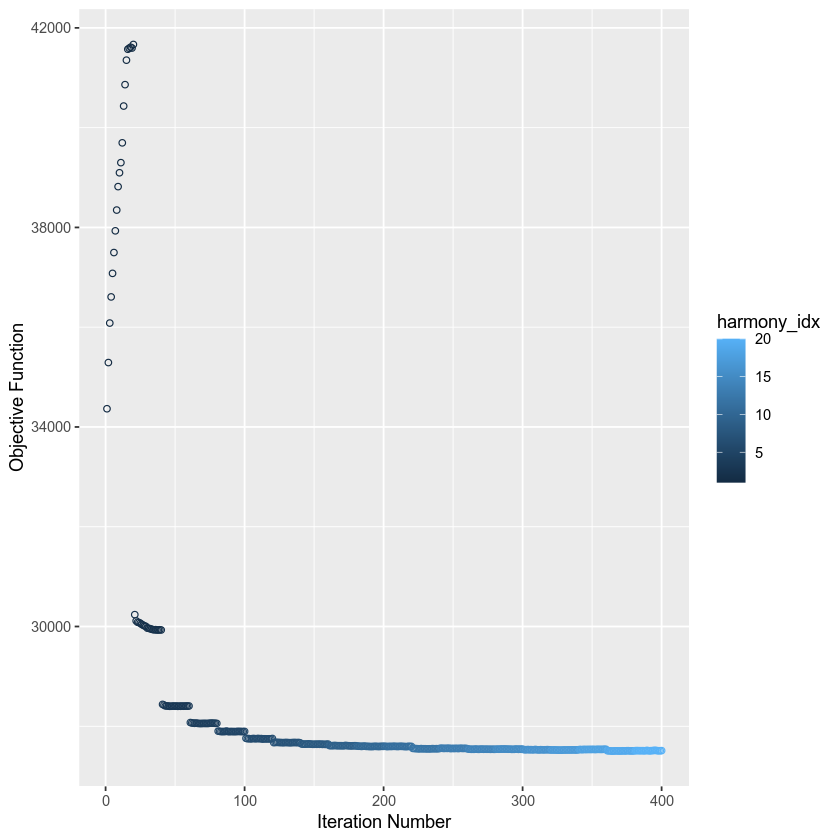

In [54]:
harmony_weighted2 <- HarmonyMatrix(weighted_pca_res, qcd_meta, 
                            c('sample', 'processing.batch', 'Site', 'dataset'), 
                            c(1.5, 1, 1, 1.5),
                            do_pca = FALSE, 
                            epsilon.harmony = -Inf, 
                            epsilon.cluster = -Inf,
                            weights = weights, 
                            max.iter.cluster = 20,
                            max.iter.harmony = 20, 
                            plot_convergence = TRUE, 
                            verbose = TRUE)

In [55]:
harmony_umap2 <- uwot::umap(harmony_weighted2, n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [56]:
weighted_umap <- uwot::umap(weighted_pca_res, n_neighbors = 30L, metric = "euclidean", min_dist = .1)

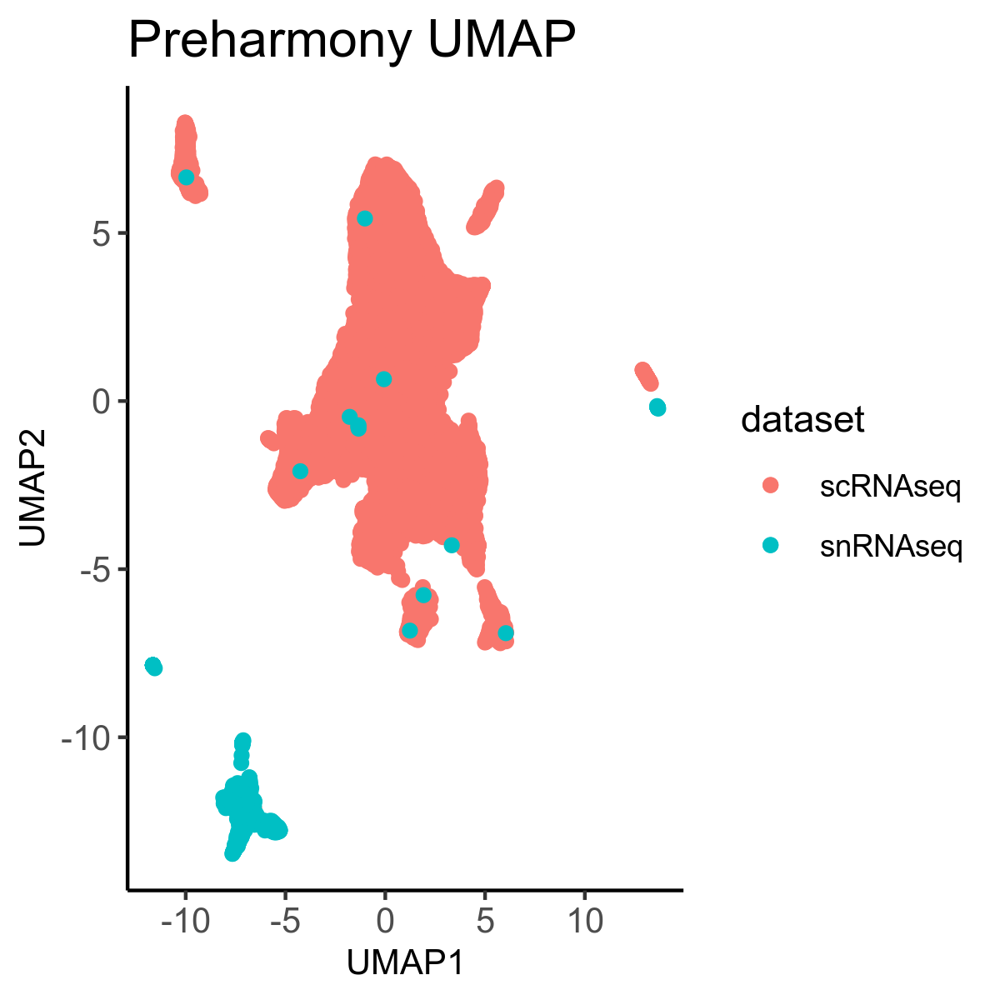

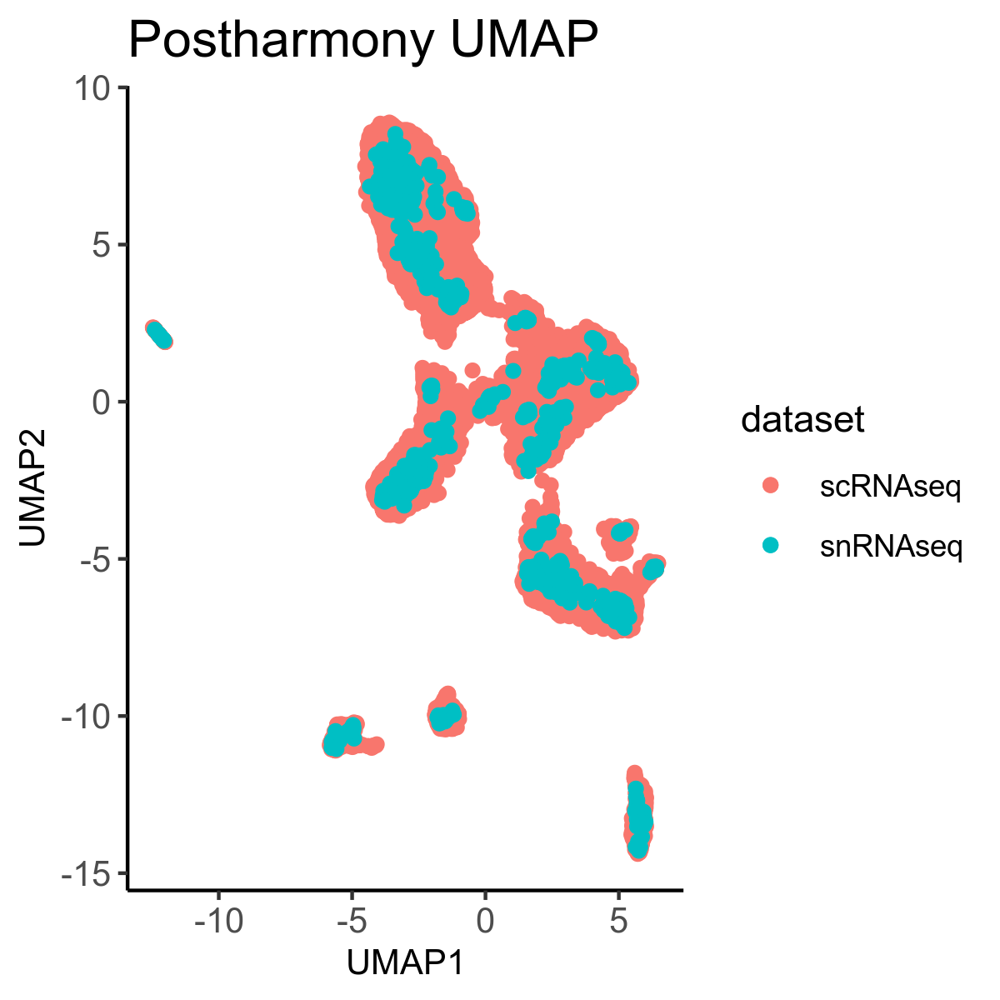

In [57]:
fig.size(4, 4)

df <- weighted_umap %>% data.frame() %>% mutate(dataset = qcd_meta$dataset)
ggplot(df, aes(x = X1, y = X2, color = dataset)) +
    geom_point(data = df %>% filter(dataset == 'scRNAseq'), alpha = 1, size = 1.5) +
    geom_point(data = df %>% filter(dataset == 'snRNAseq'), alpha = 2, size = 1.5) +
    theme_classic() + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(title = 'Preharmony UMAP', x = 'UMAP1', y = 'UMAP2')

df <- harmony_umap2 %>% data.frame() %>% mutate(dataset = qcd_meta$dataset)
fig.size(4, 4)
ggplot(df, aes(x = X1, y = X2, color = dataset)) +
    geom_point(data = df %>% filter(dataset == 'scRNAseq'), alpha = 1, size = 1.5) +
    geom_point(data = df %>% filter(dataset == 'snRNAseq'), alpha = 2, size = 1.5) +
    theme_classic() + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(title = 'Postharmony UMAP', x = 'UMAP1', y = 'UMAP2')

### Cell Type Clustering


In [2]:
pivot_wilcox_expr <- function(wilcox_obj) {
    df <- wilcox_obj %>% select(group, feature, avgExpr) %>% 
                    pivot_wider(names_from = 'feature', values_from = 'avgExpr') %>% data.frame()
    rownames(df) <- df$group
    df <- df %>% select(-group) %>% as.matrix()
    return(df)
}

pivot_wilcox_logFC <- function(wilcox_obj) {
    df <- wilcox_obj %>% select(group, feature, logFC) %>% 
                    pivot_wider(names_from = 'feature', values_from = 'logFC') %>% data.frame()
    rownames(df) <- df$group
    df <- df %>% select(-group) %>% as.matrix()
    return(df)
}

In [3]:
library(dplyr)
library(ggplot2)
library(tidyr)
library(dendsort)

In [8]:
wilcox <- wilcoxauc(qcd_meta$new_cluster_number, qcd_norm)

ERROR: Error in if (ncol(X) != length(y)) stop("number of columns of X does not\n                                match length of y"): argument is of length zero


In [62]:
library(parallel)
source("/data/srlab/ik936/Foxxy/utils/utils.R")
source("/data/srlab/anathan/scripts/scseq_utils.R")

snn_ref <- BuildSNNSeurat(harmony_weighted2[,1:20], nn.eps = 0)


resolution_list <- c(0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0)
ids_ref <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [63]:
harmony_umap2 <- cbind(harmony_weighted2[, 1:20], harmony_umap2, ids_ref)
colnames(harmony_umap2) <- c(paste0('hPC', 1:20), 'hUMAP1', 'hUMAP2', 'hres0.2', 'hres0.4', 'hres0.6', 'hres0.8', 'hres1.0', 'hres1.2', 'hres1.4', 'hres1.6', 'hres1.8', 'hres2.0')

In [65]:
qcd_meta <- cbind(qcd_meta, harmony_umap2) 

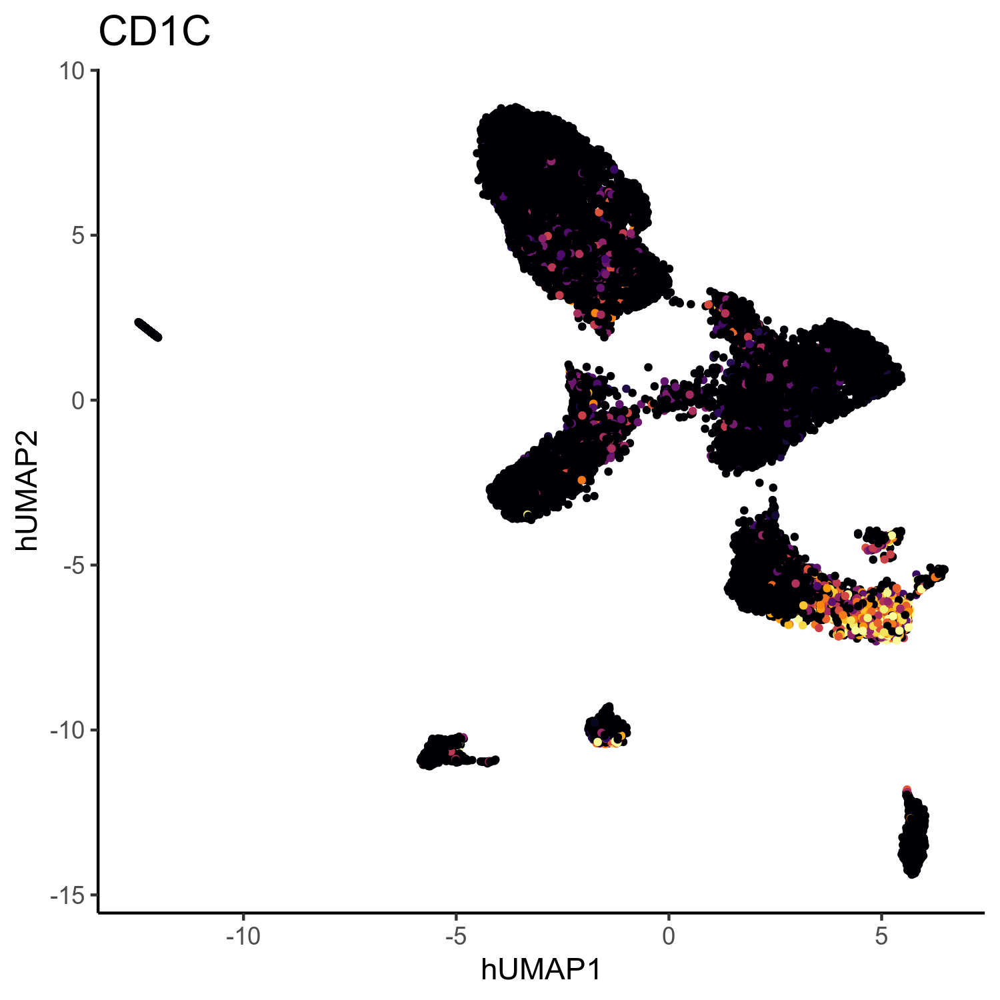

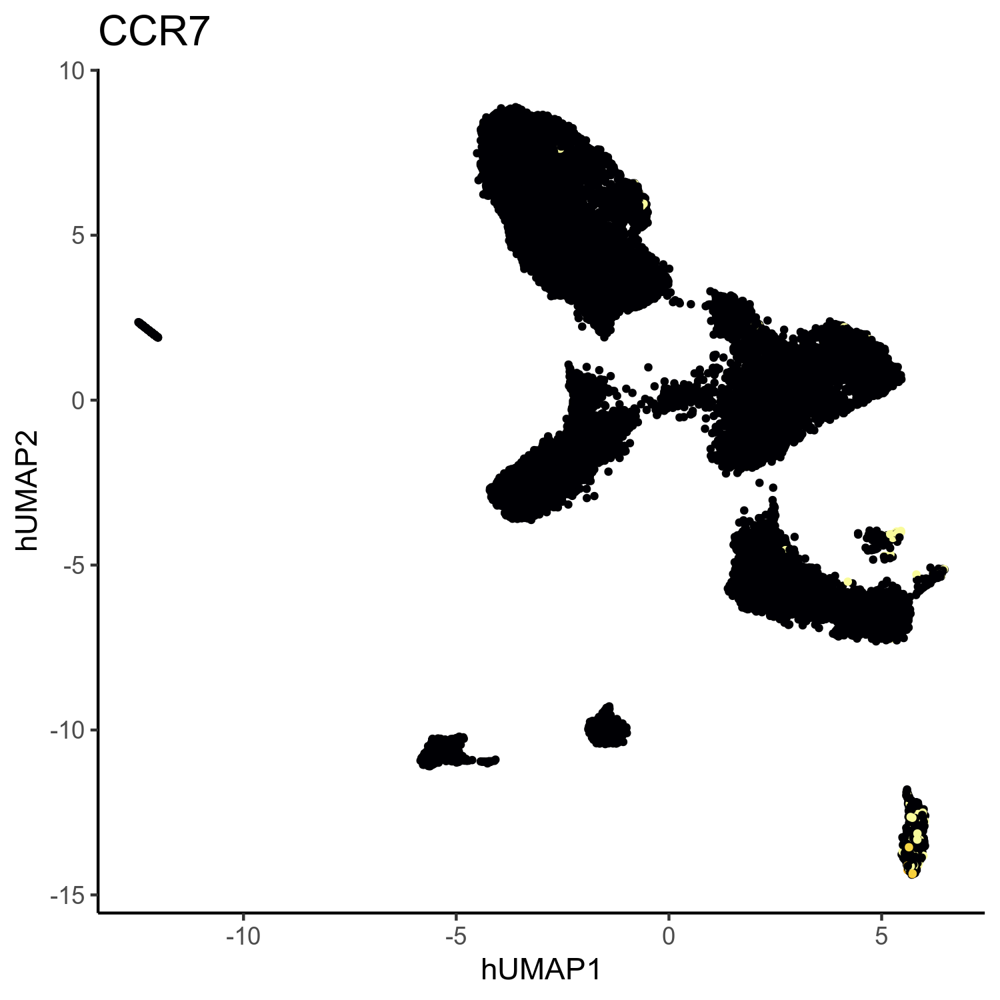

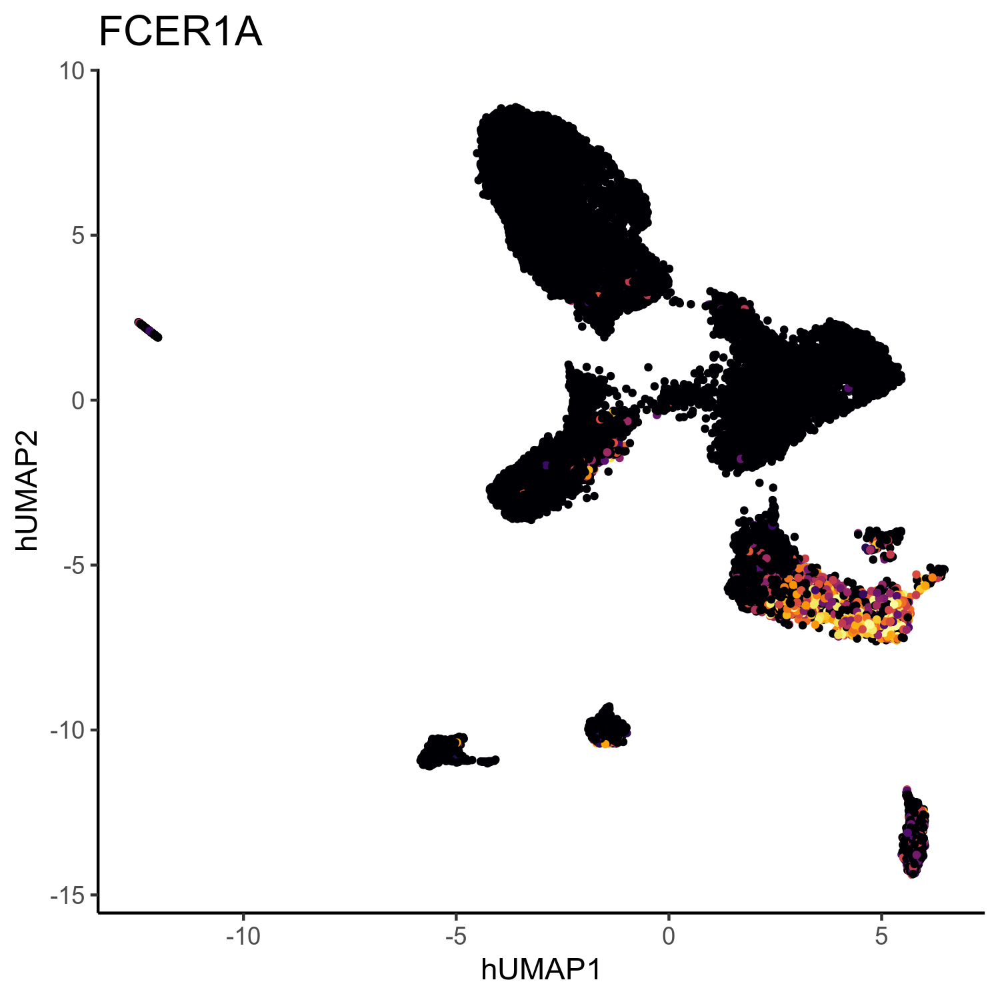

In [338]:
plot_shuffled_features('CD1C', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.99)
plot_shuffled_features('CCR7', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.99)
plot_shuffled_features('FCER1A', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.99)

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


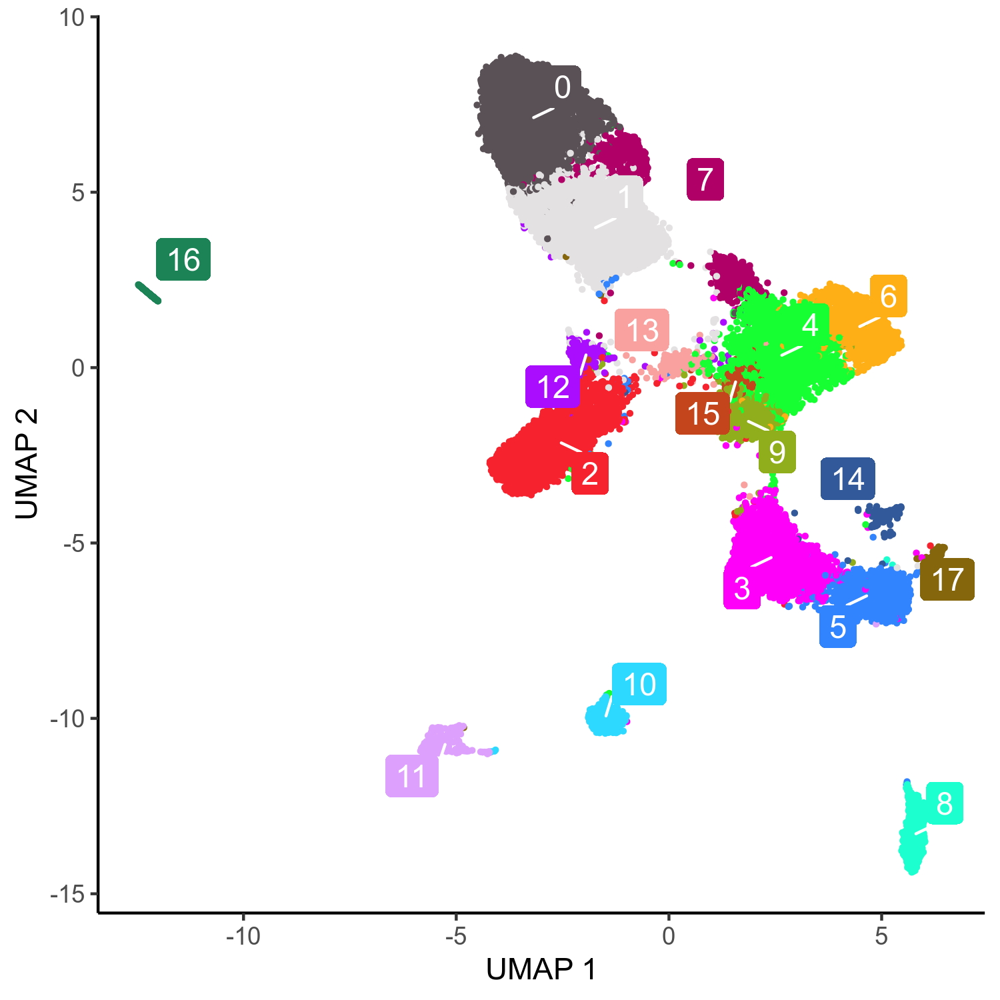

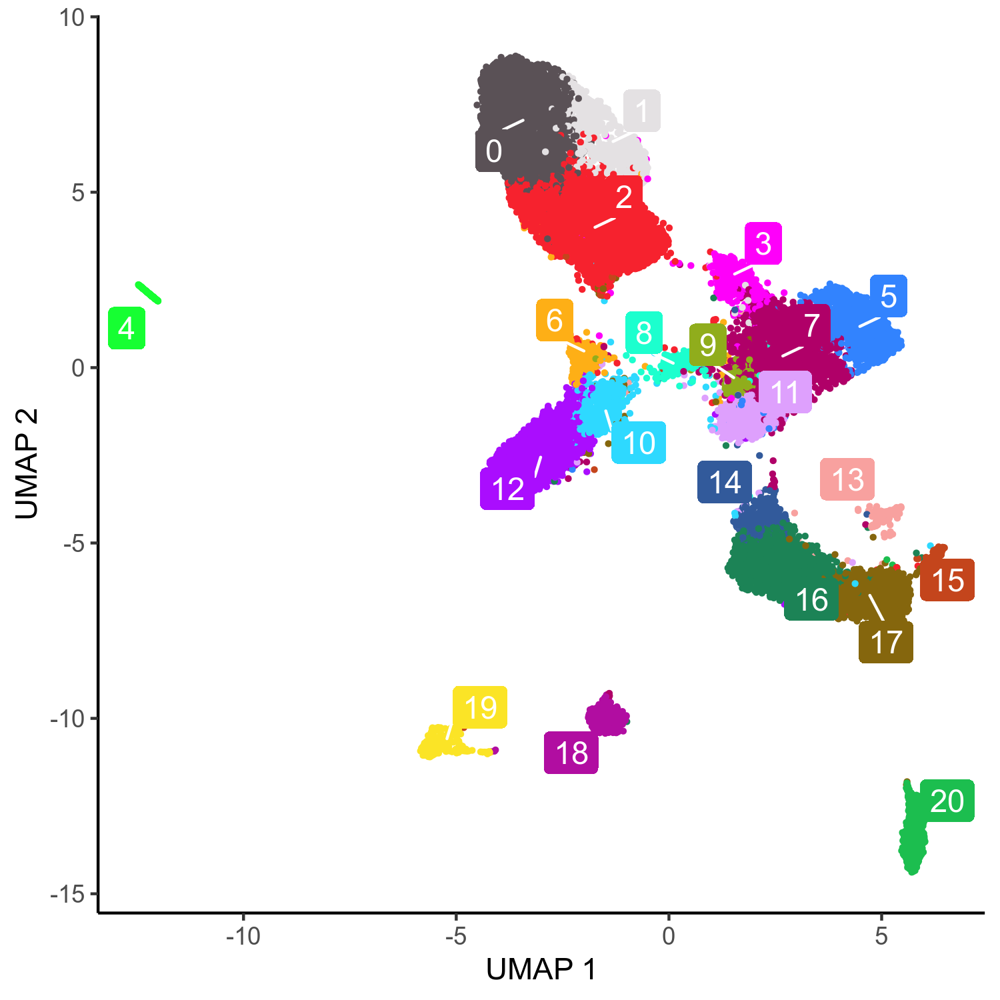

In [3]:
fig.size(5, 5)
plot_clusters3(qcd_meta$hres0.6, qcd_meta$hres0.6, 
               umap_use = qcd_meta %>% select(hUMAP1, hUMAP2),
               do_labels = TRUE, label_size = 4) + 
        scale_color_manual(values = as.vector(polychrome(28))) +
        scale_fill_manual(values = as.vector(polychrome(28)))

plot_clusters3(qcd_meta$new_cluster_number, qcd_meta$new_cluster_number, 
               umap_use = qcd_meta %>% select(hUMAP1, hUMAP2),
               do_labels = TRUE, label_size = 4) + 
        scale_color_manual(values = as.vector(polychrome(28))) +
        scale_fill_manual(values = as.vector(polychrome(28)))

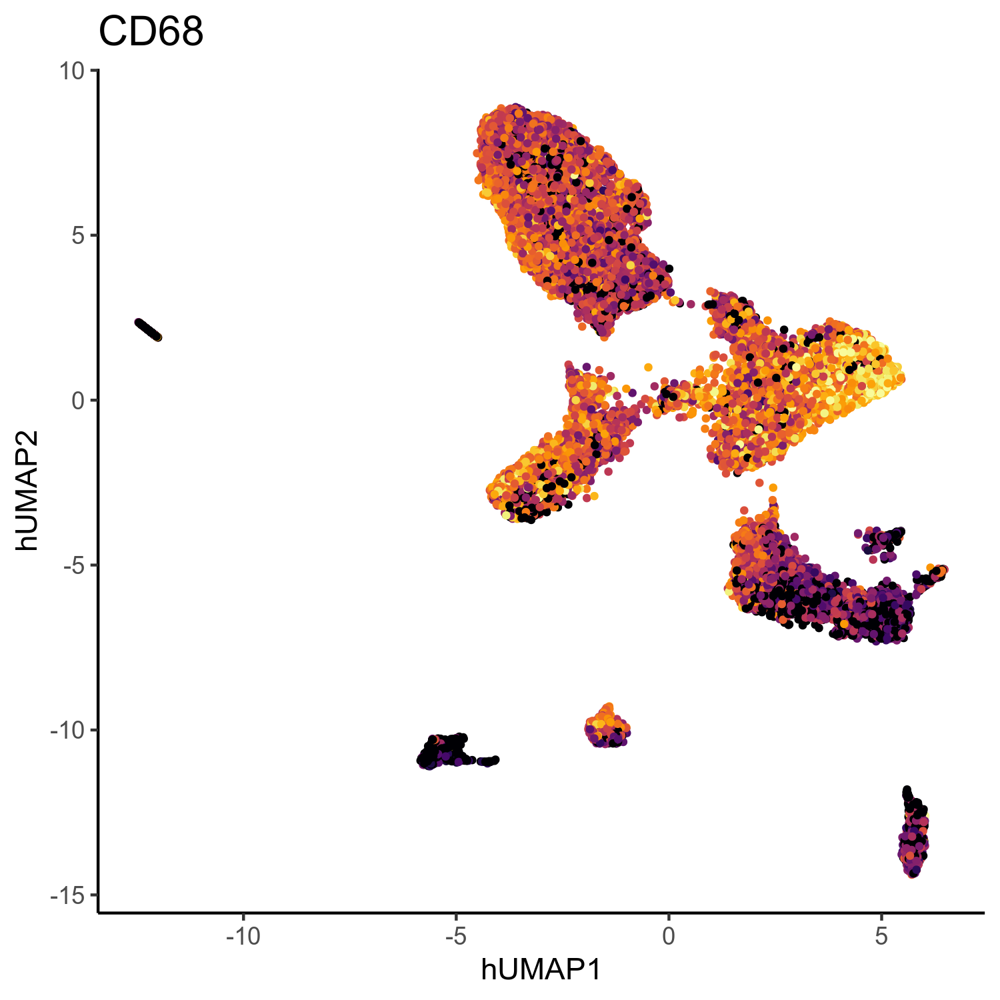

In [255]:
plot_shuffled_features('CD68', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.99)

In [253]:
ggplot(left_join(qcd_meta, arnon_clusters) %>% na.omit(), aes(x = hUMAP1, y = hUMAP2, color = arnon_cluster)) +
    geom_point(size = 1) + 
    theme_classic() + 
    scale_color_manual(values = as.vector(polychrome(35)), drop = FALSE) +
    guides(colour = guide_legend(override.aes = list(size=4), title="Cluster")) +
    theme(legend.position = 'none')

ERROR: [1m[33mError[39m in [1m[1m`auto_copy()`:[22m
[1m[22m[33m![39m `x` and `y` must share the same src.
[36mℹ[39m set `copy` = TRUE (may be slow).


In [202]:
qcd_meta <- left_join(qcd_meta %>% select(-new_cluster_number), qcd_meta %>%
            group_by(hres0.8) %>% 
            summarize(umap_mean = mean(hUMAP2)) %>% 
            arrange(desc(umap_mean)) %>% 
            mutate(new_cluster_number = 0:20) %>% select(- umap_mean))

Joining, by = "hres0.8"


In [52]:
wilcox <- wilcoxauc(qcd_norm, qcd_meta$new_cluster_number)

In [75]:
mac_v_mono <- wilcox %>% filter(feature %in% c('CD14', 'FCGR3A', 'MSR1', 'MERTK', 'JCHAIN', 'CD1C', 'CLEC9A', 'TPSAB1')) %>% pivot_wilcox_logFC()

In [488]:
dcs <- wilcox %>% filter(feature %in% c('JCHAIN', 'CLEC4C', 'TCF4')) %>% pivot_wilcox_logFC()

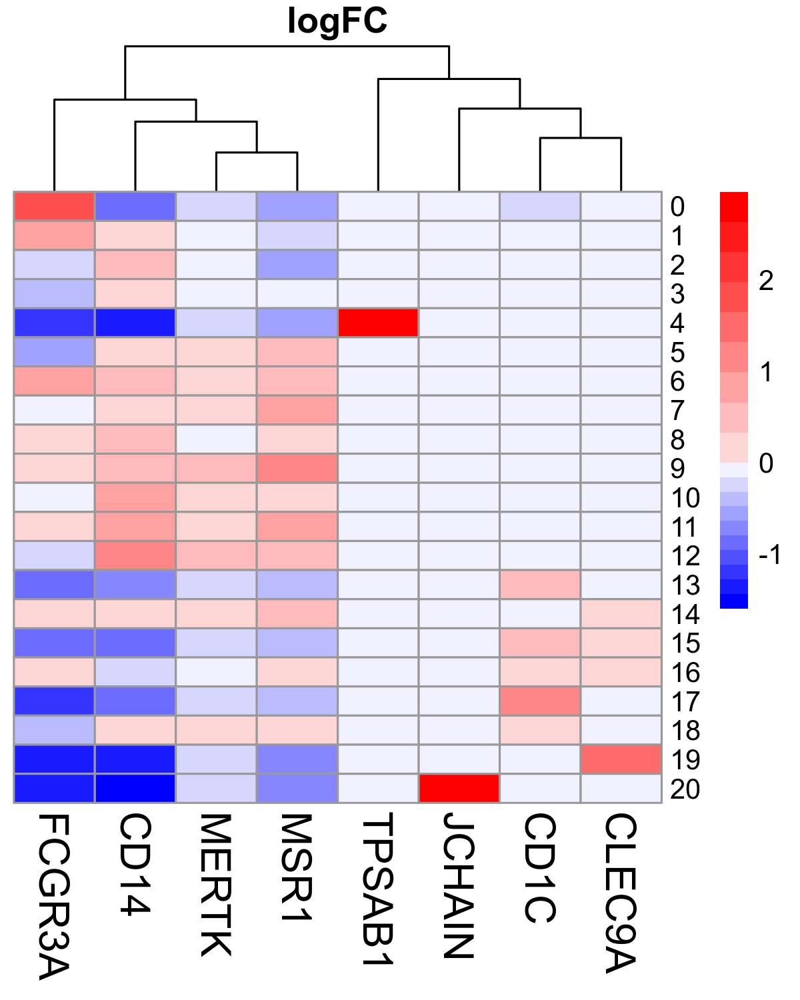

In [78]:
fig.size(5, 4)

pheatmap(mac_v_mono, scale = 'none', cluster_cols = TRUE, cluster_rows = FALSE,
         fontsize_row = 10, fontsize_col= 15, main = 'logFC',
         color=colorRampPalette(c("blue", "white", "red"))(20), 
         breaks = c(seq(-1.6, 0, 0.16), seq(0.00001, 3.3, 0.33)))

In [77]:
max(mac_v_mono)

[1] 3.337203

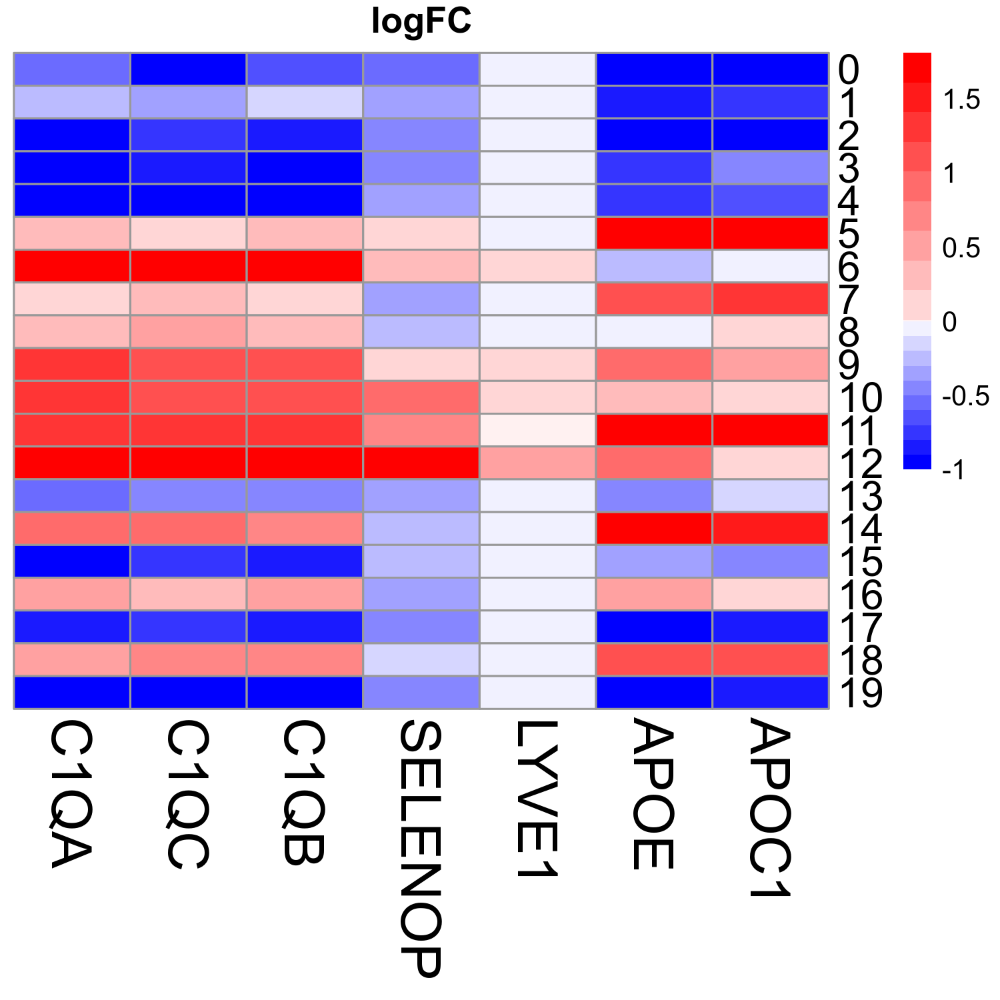

In [315]:
fig.size(5, 5)

pheatmap(mac_v_mono[annot_levels, ], scale = 'none', cluster_rows = FALSE, cluster_cols = FALSE,
         fontsize_row = 15, fontsize_col= 20, main = 'logFC',
         color=colorRampPalette(c("blue", "white", "red"))(20), ,
         breaks = c(seq(-1, 0, 0.1), seq(0.01, 2, 0.2)))

In [216]:
library(ggrepel)

In [221]:
library(ggplot2)
library(pals)

ggplot(qcd_meta, aes(x = hUMAP1, y = hUMAP2, color = as.factor(hres1.0))) + 
    geom_point(size = 0.5) + 
    theme_classic() + 
    geom_label(aes(label = hres1.0)) +
    labs(x = 'hUMAP1', y = 'hUMAP2') +
    scale_color_manual(values = as.vector(polychrome(35)), drop = FALSE) +
    theme(plot.title = element_text(size = 20, face = 'bold')) +
    guides(colour = guide_legend(override.aes = list(size=1.5), title="Cluster"))

Joining, by = "cell"
Joining, by = "arnon_cluster"


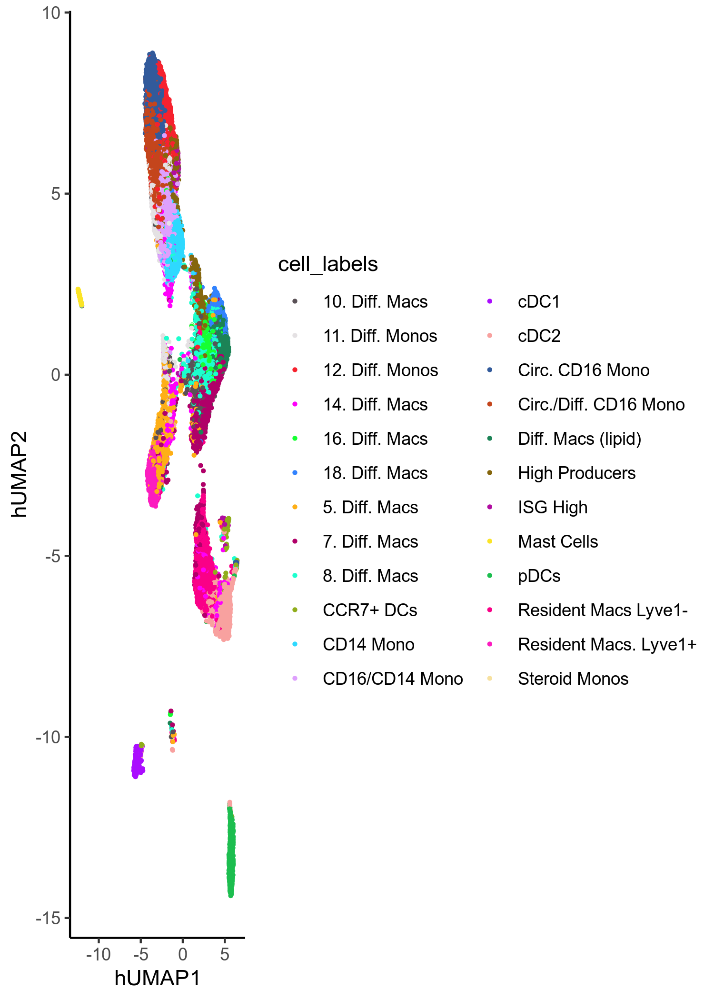

In [89]:
library(pals)
arnon_clusters <- readRDS("/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/Final-Arnon-Output/all_myeloid_cells.w_clustering.rds")@active.ident
name <- c(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23) 
cell_labels <- c('Resident Macs Lyve1-', 'Circ./Diff. CD16 Mono', 'Circ. CD16 Mono', 'CD14 Mono', 'cDC2',
                 '5. Diff. Macs', 'CD16/CD14 Mono', '7. Diff. Macs', '8. Diff. Macs', 'Resident Macs. Lyve1+', '10. Diff. Macs',
                 '11. Diff. Monos', '12. Diff. Monos', 'High Producers', '14. Diff. Macs', 'pDCs', '16. Diff. Macs', 'Diff. Macs (lipid)', 
                 '18. Diff. Macs', 'cDC1', 'ISG High', 'CCR7+ DCs', 'Mast Cells', 'Steroid Monos')
myeloid_conv <- data.frame(name = as.character(name), cell_labels)
ggplot(left_join(left_join(qcd_meta, data.frame(cell = names(arnon_clusters), arnon_cluster = arnon_clusters)), data.frame(arnon_cluster = as.character(name), cell_labels)) %>% na.omit(), aes(x = hUMAP1, y = hUMAP2, color = cell_labels)) +
    geom_point(size = 0.5) + 
    theme_classic() + 
    scale_color_manual(values = as.vector(polychrome(35)), drop = FALSE) 

In [519]:
final_annot <- data.frame(new_cluster_number = seq(0,20), annotation = c('0. CD16+ CX3CR1+ Mono', 
                                                              '1. CD14+ CD16+ Mono',
                                                              '2. CD14+ CCR2+ Mono',
                                                              '3. CD14+ CCL2+ Mono',
                                                              '4. Mast Cell',
                                                              '5. C1Qlo NUPR1hi Mac',
                                                              '6. SELENOP+ TIMP1+ Mac', 
                                                              '7. C1Qlo FABP5hi SPP1hi Mac',
                                                              '8. SELENOP- TIMP1+ Mac',
                                                              '9. C1Qhi FABP5hi SPP1hi Mac',
                                                              '10. SELENOP+ LYVE1lo Mac',
                                                              '11. C1Qhi GPNMBhi Mac',
                                                              '12. SELENOP+ LYVE1hi Mac',
                                                              '13. CCR7+ LAMP3+ cDC2', 
                                                              '14. APOC1hi C3hi Mac',
                                                              '15. MHC2lo cDC2',
                                                              '16. APOC1lo C3hi Mac',
                                                              '17. MHC2hi cDC2',
                                                              '18. CENPF+ MKI67+ Proliferating',
                                                              '19. cDC1',
                                                              '20. pDC'))

In [17]:
annotation_levels = c('0. CD16+ CX3CR1+ Mono', 
                                                              '1. CD14+ CD16+ Mono',
                                                              '2. CD14+ CCR2+ Mono',
                                                              '3. CD14+ CCL2+ Mono',
                                                              '4. Mast Cell',
                                                              '5. C1Qlo NUPR1hi Mac',
                                                              '6. SELENOP+ TIMP1+ Mac', 
                                                              '7. C1Qlo FABP5hi SPP1hi Mac',
                                                              '8. SELENOP- TIMP1+ Mac',
                                                              '9. C1Qhi FABP5hi SPP1hi Mac',
                                                              '10. SELENOP+ LYVE1lo Mac',
                                                              '11. C1Qhi GPNMBhi Mac',
                                                              '12. SELENOP+ LYVE1hi Mac',
                                                              '13. CCR7+ LAMP3+ cDC2', 
                                                              '14. APOC1hi C3hi Mac',
                                                              '15. MHC2lo cDC2',
                                                              '16. APOC1lo C3hi Mac',
                                                              '17. MHC2hi cDC2',
                                                              '18. CENPF+ MKI67+ Proliferating',
                                                              '19. cDC1',
                                                              '20. pDC')

In [520]:
qcd_meta <- left_join(qcd_meta, final_annot)

Joining, by = "new_cluster_number"


In [531]:
qcd_meta$annotation <- factor(qcd_meta$annotation, levels = annotation_levels)

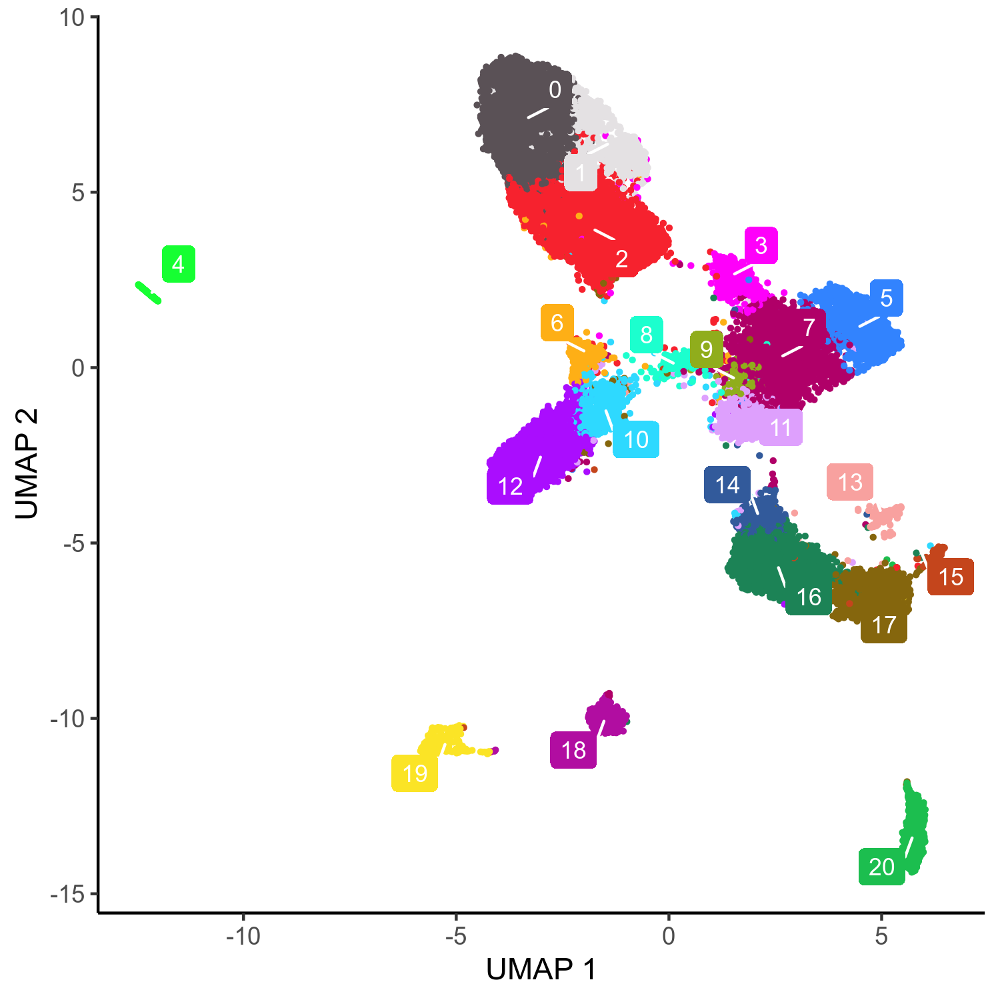

In [25]:
fig.size(5, 5)
plot_clusters3(cluster_ids = qcd_meta$new_cluster_number, labels = qcd_meta$new_cluster_number, 
               umap_use = qcd_meta %>% select(hUMAP1, hUMAP2), do_labels = TRUE, label_size = 3) +
        scale_color_manual(values = as.vector(polychrome(28))) +
        scale_fill_manual(values = as.vector(polychrome(28))) + 
        theme(legend.position = "none")

In [536]:
arnon_clusters <- readRDS("/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/Final-Arnon-Output/all_myeloid_cells.w_clustering.rds")@active.ident
name <- c(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23) 
cell_labels <- c('Resident Macs Lyve1-', 'Circ./Diff. CD16 Mono', 'Circ. CD16 Mono', 'CD14 Mono', 'cDC2',
                 '5. Diff. Macs', 'CD16/CD14 Mono', '7. Diff. Macs', '8. Diff. Macs', 'Resident Macs. Lyve1+', '10. Diff. Macs',
                 '11. Diff. Monos', '12. Diff. Monos', 'High Producers', '14. Diff. Macs', 'pDCs', '16. Diff. Macs', 'Diff. Macs (lipid)', 
                 '18. Diff. Macs', 'cDC1', 'ISG High', 'CCR7+ DCs', 'Mast Cells', 'Steroid Monos')
myeloid_conv <- data.frame('name' = as.character(name), 'arnon_annot' = cell_labels)

In [10]:
cell_labels[ - which(cell_labels %in% c('Circ. CD16 Mono', 'Circ./Diff. CD16 Mono', '12. Diff. Monos', 'CD14 Mono', 'CD16/CD14 Mono', '11. Diff. Monos',
                              'Resident Macs Lyve1-', 'Resident Macs. Lyve1+', 
                              'cDC2', 'Diff. Macs (lipid)', '5. Diff. Macs', 'High Producers', 'cDC1',
                              '10. Diff. Macs', '14. Diff. Macs', '18. Diff. Macs', 'CCR7+ DCs', '8. Diff. Macs'))]

[1] "7. Diff. Macs"  "pDCs"           "16. Diff. Macs" "ISG High"      
[5] "Mast Cells"     "Steroid Monos"

In [538]:
arnon_vs_sid <- left_join(qcd_meta, left_join(data.frame(cell = names(arnon_clusters), name = arnon_clusters), myeloid_conv)) %>% 
                    na.omit() %>% select(annotation, arnon_annot) %>% 
                    group_by(annotation, arnon_annot) %>% tally()

Joining, by = "name"
Joining, by = "cell"


In [539]:
arnon_vs_sid

annotation,arnon_annot,n
<fct>,<chr>,<int>
0. CD16+ CX3CR1+ Mono,11. Diff. Monos,17
0. CD16+ CX3CR1+ Mono,12. Diff. Monos,313
0. CD16+ CX3CR1+ Mono,16. Diff. Macs,2
0. CD16+ CX3CR1+ Mono,CD14 Mono,4
0. CD16+ CX3CR1+ Mono,CD16/CD14 Mono,91
0. CD16+ CX3CR1+ Mono,cDC1,1
0. CD16+ CX3CR1+ Mono,Circ. CD16 Mono,1783
0. CD16+ CX3CR1+ Mono,Circ./Diff. CD16 Mono,1574
0. CD16+ CX3CR1+ Mono,High Producers,1


In [541]:
df <- ungroup(arnon_vs_sid)
statistic <- vector()
for (i in 1:nrow(arnon_vs_sid)) {
        inAandB <- df %>% filter(annotation == arnon_vs_sid$annotation[i], 
                                           arnon_annot == arnon_vs_sid$arnon_annot[i]) %>% pull(n) %>% sum()
        inAnotB <- df %>% filter(annotation == arnon_vs_sid$annotation[i], 
                                           arnon_annot != arnon_vs_sid$arnon_annot[i]) %>% pull(n) %>% sum()
        inBnotA <- df %>% filter(annotation != arnon_vs_sid$annotation[i], 
                                           arnon_annot == arnon_vs_sid$arnon_annot[i]) %>% pull(n) %>% sum()
        notBnotA <- df %>% filter(annotation != arnon_vs_sid$annotation[i], 
                                            arnon_annot != arnon_vs_sid$arnon_annot[i]) %>% pull(n) %>% sum()
        contin <- data.frame(c(inAandB, inAnotB), c(inBnotA, notBnotA))
        or <- (contin[1, 1] * contin[2, 2]) / (contin[1, 2] * contin[2, 1])
        statistic <- c(statistic, sign(log(or)) * sqrt(chisq.test(contin, simulate.p.value = TRUE)$statistic))    
}

In [542]:
df$stat <- statistic

In [543]:
or_plot <- df %>% select(-n) %>% pivot_wider(names_from = 'annotation', values_from = 'stat') 
cols <- colnames(or_plot)
or_plot[is.na(or_plot)] <- 0 
or_plot <- or_plot %>% data.frame()
rownames(or_plot) <- or_plot$arnon_annot
colnames(or_plot) <- cols
or_plot <- or_plot[, -1]

In [546]:
library(dendsort)
sort_hclust <- function(...) as.hclust(dendsort(as.dendrogram(...)))

mat_cluster_rows <- hclust(dist(or_plot))

mat_cluster_rows <- sort_hclust(mat_cluster_rows)

In [566]:
col.order <- c( '18. CENPF+ MKI67+ Proliferating', '20. pDC',  '19. cDC1', '4. Mast Cell', '16. APOC1lo C3hi Mac', 
               '15. MHC2lo cDC2', '17. MHC2hi cDC2', '12. SELENOP+ LYVE1hi Mac', '3. CD14+ CCL2+ Mono', 
               '1. CD14+ CD16+ Mono', '13. CCR7+ LAMP3+ cDC2', '14. APOC1hi C3hi Mac',
               '11. C1Qhi GPNMBhi Mac', '9. C1Qhi FABP5hi SPP1hi Mac', '8. SELENOP- TIMP1+ Mac',  '7. C1Qlo FABP5hi SPP1hi Mac', 
               '6. SELENOP+ TIMP1+ Mac', 
               '10. SELENOP+ LYVE1lo Mac', '2. CD14+ CCR2+ Mono', '0. CD16+ CX3CR1+ Mono',  '5. C1Qlo NUPR1hi Mac')

In [550]:
annotation_levels %in% col.order

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE TRUE TRUE

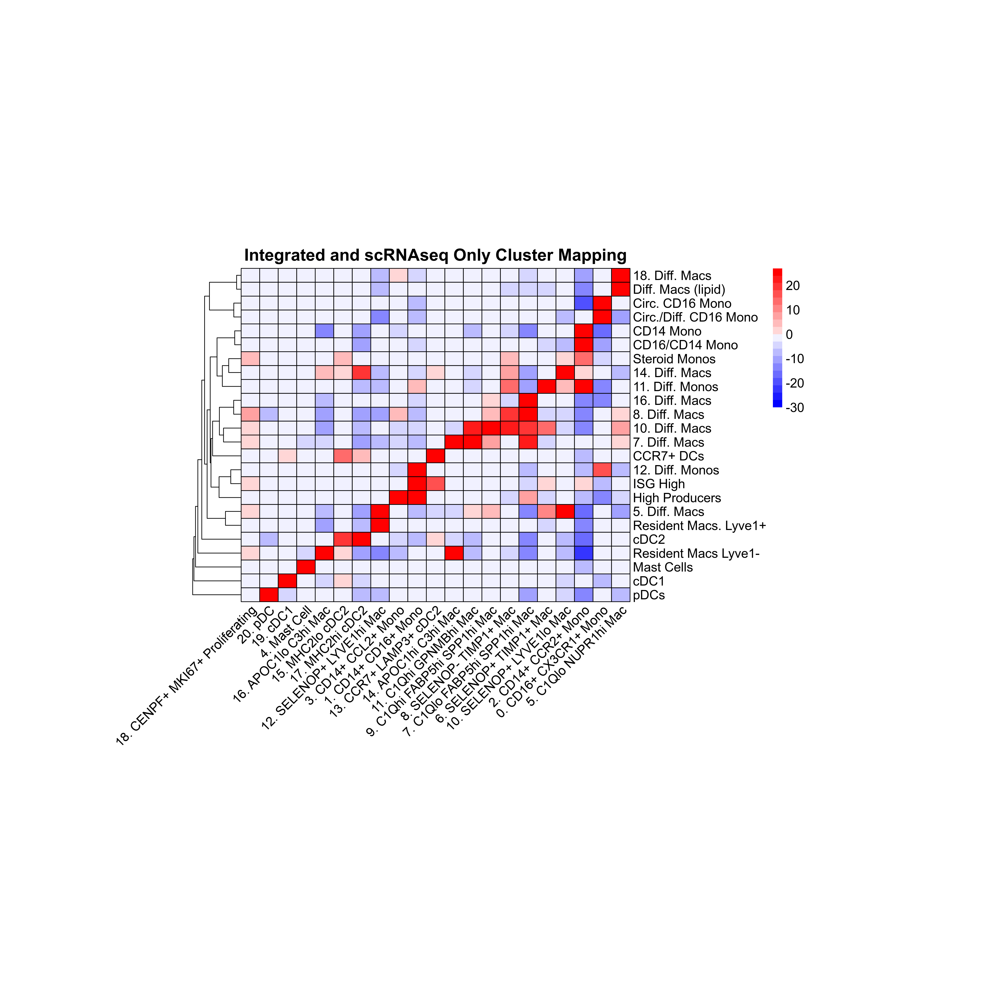

In [567]:
fig.size(15, 15)
pheatmap::pheatmap(or_plot[, col.order], cellwidth = 20, cellheight = 15, 
                   color=colorRampPalette(c("blue", "white", "red"))(20), 
                   breaks = c(seq(-30, 0, 3), seq(0.001, 30, 3)), 
                   border_color = 'black', scale = 'none',
                   cluster_rows = mat_cluster_rows, cluster_cols = FALSE, main = 'Integrated and scRNAseq Only Cluster Mapping', fontsize = 14, angle_col = 45)

In [305]:
row.order <- c( 'cDC1', 'cDC2', 'Resident Macs Lyve1-', 'CD14 Mono', 'Mast Cells', 'Circ. CD16 Mono',
                'Circ./Diff. CD16 Mono', '12. Diff. Monos', 'Resident Macs. Lyve1+', '5. Diff. Macs', 
               '16. Diff. Macs', 
               '10. Diff. Macs', '8. Diff. Macs', 'Diff. Macs (lipid)',
                 'CCR7+ DCs', '11. Diff. Monos',  'CD16/CD14 Mono',  
               'Steroid Monos', 'High Producers', 'ISG High','18. Diff. Macs', '7. Diff. Macs',
                 '14. Diff. Macs',   'pDC')

In [568]:
saveRDS(qcd_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_meta_harmonizedPCUMAPCellStateClusters_10042022.rds')

In [569]:
saveRDS(qcd_norm, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_norm_10042022.rds')

In [1]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_meta_harmonizedPCUMAPCellStateClusters_10042022.rds')

In [4]:
unique(qcd_meta$annotation)

[1] 12. SELENOP+ LYVE1hi Mac        0. CD16+ CX3CR1+ Mono          
 [3] 17. MHC2hi cDC2                 2. CD14+ CCR2+ Mono            
 [5] 19. cDC1                        16. APOC1lo C3hi Mac           
 [7] 4. Mast Cell                    3. CD14+ CCL2+ Mono            
 [9] 5. C1Qlo NUPR1hi Mac            10. SELENOP+ LYVE1lo Mac       
[11] 20. pDC                         13. CCR7+ LAMP3+ cDC2          
[13] 11. C1Qhi GPNMBhi Mac           18. CENPF+ MKI67+ Proliferating
[15] 7. C1Qlo FABP5hi SPP1hi Mac     1. CD14+ CD16+ Mono            
[17] 15. MHC2lo cDC2                 14. APOC1hi C3hi Mac           
[19] 9. C1Qhi FABP5hi SPP1hi Mac     6. SELENOP+ TIMP1+ Mac         
[21] 8. SELENOP- TIMP1+ Mac         
21 Levels: 0. CD16+ CX3CR1+ Mono 1. CD14+ CD16+ Mono ... 20. pDC

In [11]:
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_norm_10042022.rds')

In [12]:
wilcox <- wilcoxauc(qcd_norm, qcd_meta$new_cluster_number)

In [8]:
saveRDS(wilcox %>% filter(padj < 0.05), '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/myeloid_cluster_de_wilcoxauc_pad0.05.rds')

In [13]:
saveRDS(wilcox %>% filter(padj < 0.05) %>% group_by(group) %>% arrange(desc(logFC)) %>% slice(1:50), '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/myeloid_cluster_de_wilcoxauc_pad0.05_top50.rds')

In [14]:
saveRDS(wilcox %>% filter(padj < 0.05) %>% group_by(group) %>% arrange(logFC) %>% slice(1:50), '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/myeloid_cluster_de_wilcoxauc_pad0.05_bottom50.rds')

In [18]:
top_bottom_50 <- rbind(wilcox %>% filter(padj < 0.05) %>% group_by(group) %>% arrange(desc(logFC)) %>% slice(1:100),
                       wilcox %>% filter(padj < 0.05) %>% group_by(group) %>% arrange(logFC) %>% slice(1:100))

In [22]:
saveRDS(top_bottom_50, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/myeloid_cluster_de_wilcoxauc_pad0.05_topbottom100.rds')

### Cell State Proportions

In [19]:
overlapping_meta <- qcd_meta %>%  mutate(individual = str_split(sample, '_')) %>% 
                                    rowwise() %>% 
                                    mutate(individual = unlist(individual)[3]) %>% 
                                    group_by(individual, dataset, annotation) %>% 
                                    tally() %>% pivot_wider(names_from = 'annotation', values_from = 'n') 
overlapping_meta[is.na(overlapping_meta)] <- 0
overlapping_meta <- overlapping_meta %>% pivot_longer(cols = unique(qcd_meta$annotation),
                                                           names_to = 'annotation') %>%
                                        pivot_wider(names_from = 'dataset', values_from = 'value') %>%
                                ungroup() %>% group_by(individual) %>% filter(sum(scRNAseq) > 40, sum(snRNAseq) > 40) %>%
                                    mutate(snRNAseq = (snRNAseq / sum(snRNAseq)), 
                                           scRNAseq = (scRNAseq / sum(scRNAseq))) 


In [20]:
correlations <- vector()
clusters <- vector()
for (i in overlapping_meta %>% pull(annotation) %>% unique()) {
correlations <- c(correlations, cor(overlapping_meta %>% 
        filter(annotation == i) %>% pull(snRNAseq),
        overlapping_meta %>% 
        filter(annotation == i) %>% pull(scRNAseq))) 
clusters <- c(clusters, i )}
correlations <- data.frame(correlations, clusters)
cell_number <- vector() 
for (i in correlations$cluster) {
    cell_number <- c(cell_number, qcd_meta %>% group_by(annotation) %>% tally() %>% mutate(prop = n / sum(n)) %>% filter(annotation == i) %>% pull(prop))
}
correlations <- cbind(correlations, prop = cell_number)

`geom_smooth()` using formula 'y ~ x'



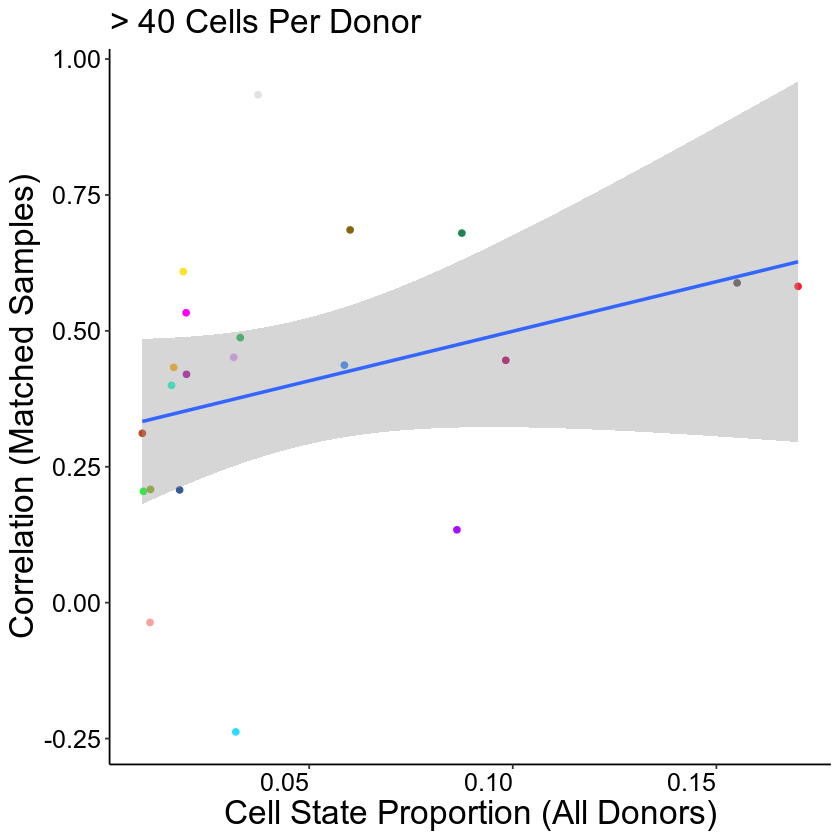

In [21]:
ggplot(correlations, aes(x = prop, y = correlations)) +
    geom_point(aes(color = factor(clusters, levels = annotation_levels))) + 
    theme_classic() + 
    geom_smooth(method = 'lm') +
    scale_color_manual(values = as.vector(polychrome(28))) +
    labs(x = 'Cell State Proportion (All Donors)', y = 'Correlation (Matched Samples)',
         title = '> 40 Cells Per Donor') +
        theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20),
        axis.text = element_text(color = "black", size = 15,vjust = 0.5, hjust=1),
        axis.title=element_text(size=20)) 

`geom_smooth()` using formula 'y ~ x'

Warning message:
“position_dodge requires non-overlapping x intervals”


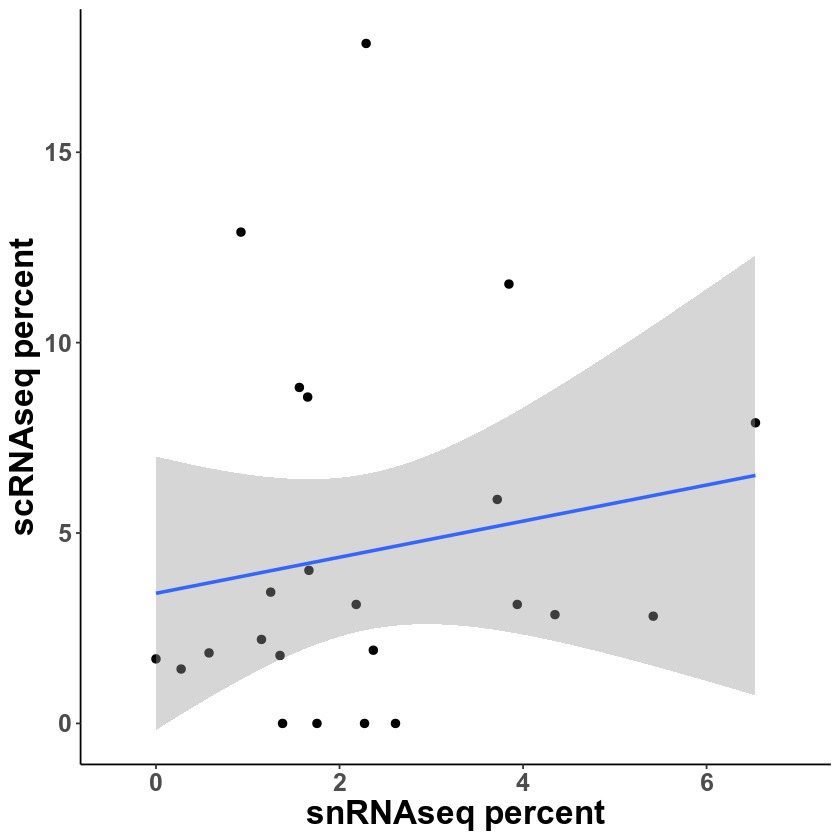

In [157]:
ggplot(overlapping_meta %>% filter(annotation == '11. APOhi SPP1+ STMN1+ Mac'), aes (x = scRNAseq, y = snRNAseq)) + 
        geom_point(size = 2, position = position_dodge(width = 0.90)) + 
        theme_classic() + 
        labs(x = 'snRNAseq percent', y = 'scRNAseq percent') + 
        theme(axis.title = element_text(size = 20, face = 'bold'), 
              axis.text = element_text(size = 15, face = 'bold'),
              legend.position = 'none') +
        geom_smooth(method = 'lm') 

In [47]:
cor_df <- data.frame(cluster = overlapping_meta %>% pull(annotation) %>% unique(), correlation = correlations)

In [50]:
cor_df %>% left_join(data.frame(qcd_meta %>% select(annotation, dataset) %>% 
                                                group_by(annotation) %>% tally() %>% rename(cluster = annotation)))

Joining, by = "cluster"


cluster,correlation,n
<chr>,<dbl>,<int>
0. CD16++ CXCR31+ Mono,0.443901963,4533
1. APOhi SPP1+ FABP5hi Mac,0.295389615,2895
10. cDC1,0.493649914,529
11. APOhi SPP1+ STMN1+ Mac,0.165871664,508
13. CCLhi CXCL10hi Mac,-0.138076978,489
14. C1Qhi APOhi SELENOP+ LYVE1- Mac,-0.171391993,427
15. C1Qhi STAT1+ RNASE+ LYVE1- Mac,0.399510612,381
16. APOlo C1Qlo FOS+ LYZ+ Mac,-0.241262685,341
18. cDC2 LAMP3+ CCR7+,0.305491221,244


### Symphony

In [22]:
library(symphony)


Attaching package: ‘symphony’


The following object is masked _by_ ‘.GlobalEnv’:

    vargenes_vst


The following objects are masked from ‘package:singlecellmethods’:

    findVariableGenes, rowSDs, scaleDataWithStats, vargenes_vst




In [23]:
ref <- readRDS("/data/srlab1/public/srcollab/AMP_Phase_2/singlecell_result/myeloid_reference_2021-04-29.rds")
ref$save_uwot_path <- '/data/srlab1/public/srcollab/AMP_Phase_2/singlecell_result/myeloid_uwot_model_2021-04-29'

In [24]:
query = mapQuery(qcd_norm[, qcd_meta %>% filter(dataset == 'scRNAseq') %>% pull(cell)], # query gene expression (genes x cells)
                    qcd_meta %>% filter(dataset == 'scRNAseq'),        # query metadata (cells x attributes)
                    ref, # Symphony reference object
                    do_normalize = FALSE,  # perform log(CP10k) normalization on query
                    vars = c('sample', 'processing.batch', 'Site'),
                    do_umap = TRUE)        # project query cells into reference UMAP

Scaling and synchronizing query gene expression

Found 3483 out of 3547 reference variable genes in query dataset

Project query cells using reference gene loadings

Clustering query cells to reference centroids

Correcting query batch effects

UMAP

All done!



In [217]:
saveRDS(query$meta_data, '/data/srlab/ssg34/SLE_kidney_v2/data/new_symphony_res.rds')

In [25]:
query = knnPredict(query, ref, ref$meta_data[ ,"cluster_name"], k = 5, confidence=TRUE)

In [26]:
plot_df <- query$meta_data

In [27]:
plot_df <- cbind(plot_df, data.frame(query$umap))

In [28]:
plot_df <- plot_df %>% filter(cell_type_pred_knn_prob > 0.6)

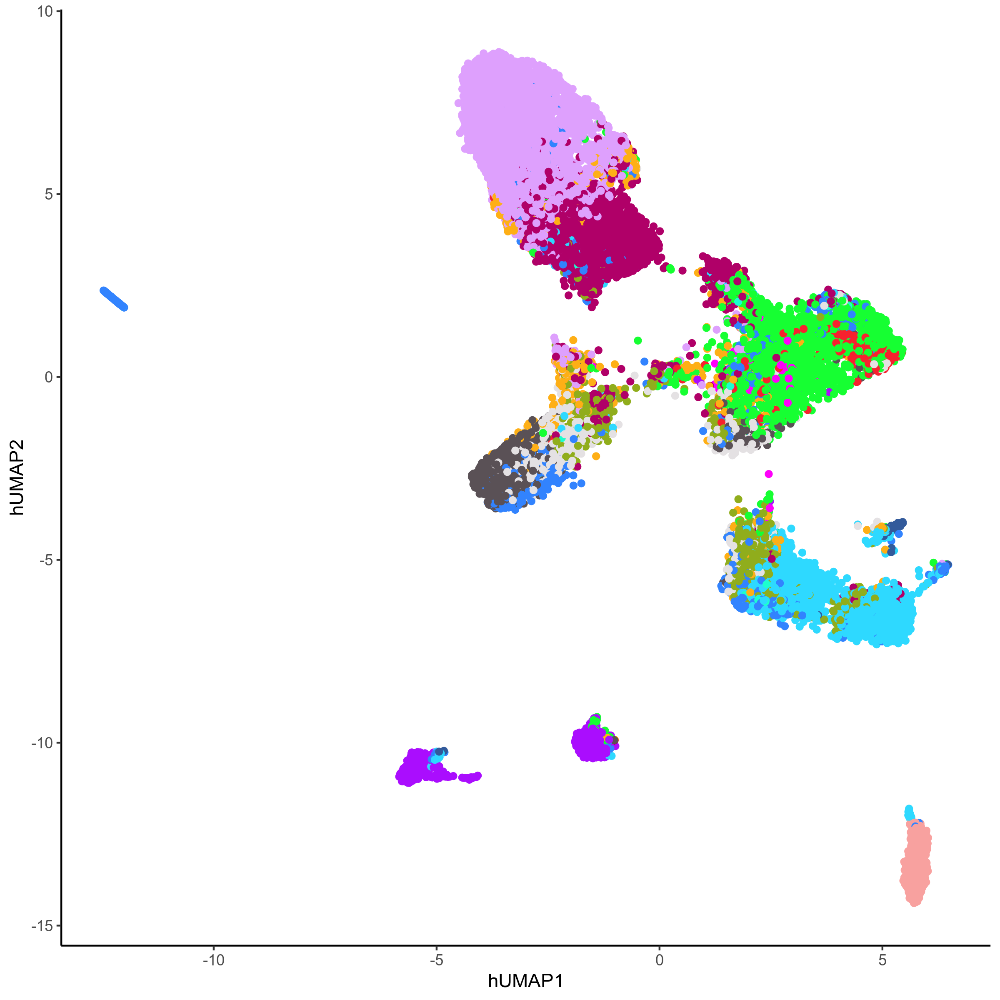

In [29]:
fig.size(8, 8)
ggplot(plot_df, aes(x = hUMAP1, y = hUMAP2, color = as.factor(cell_type_pred_knn))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(26)), drop = FALSE) +
    theme(legend.position = 'none')

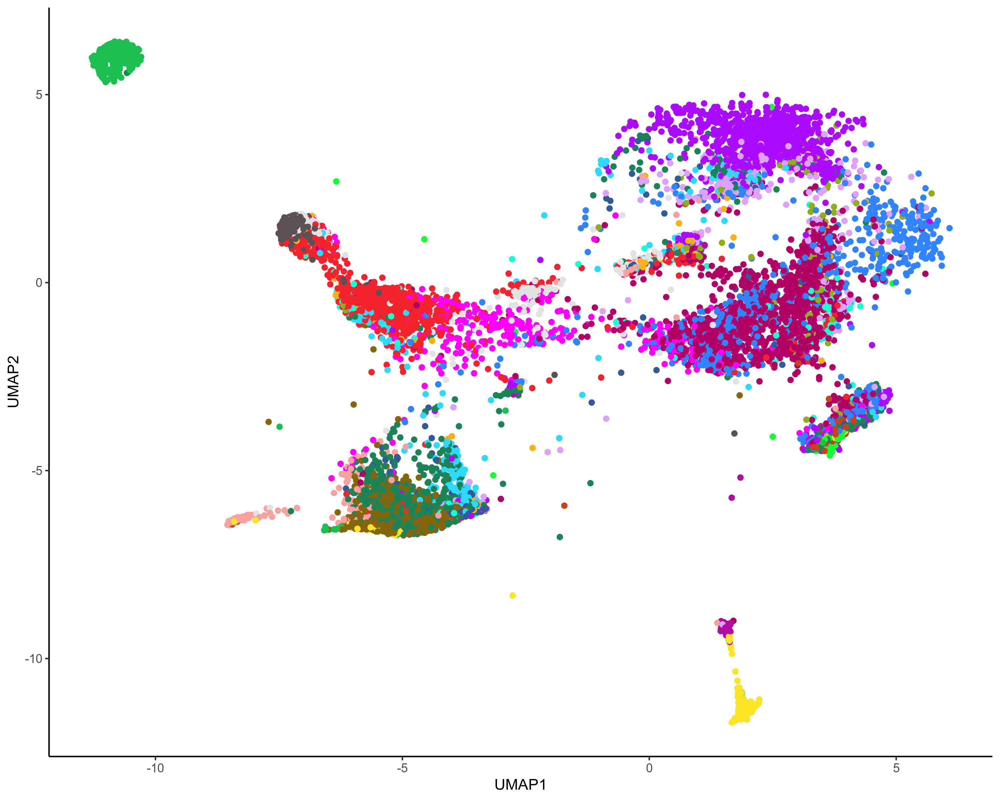

In [30]:
fig.size(8, 10)
ggplot(plot_df, aes(x = UMAP1, y = UMAP2, color = factor(annotation, levels = annotation_levels))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(26)), drop = FALSE) +
    guides(colour = guide_legend(override.aes = list(size=3), text = element_text(size = 5), title="Cluster")) +
    theme(legend.position = 'none')

In [31]:
cell_type <- plot_df %>%  select(annotation, cell_type_pred_knn) %>% 
                                group_by(annotation, cell_type_pred_knn) %>% tally()

In [32]:
df <- ungroup(cell_type)
or <- vector()
statistic <- vector() 
for (i in 1:nrow(df)) {
        inAandB <- df %>% filter(annotation == df$annotation[i], 
                                           cell_type_pred_knn == df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        inAnotB <- df %>% filter(annotation == df$annotation[i], 
                                           cell_type_pred_knn != df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        inBnotA <- df %>% filter(annotation != df$annotation[i], 
                                           cell_type_pred_knn == df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        notBnotA <- df %>% filter(annotation != df$annotation[i], 
                                           cell_type_pred_knn != df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        contin <- data.frame(c(inAandB, inAnotB), c(inBnotA, notBnotA))
        or <- (contin[1, 1] * contin[2, 2]) / (contin[1, 2] * contin[2, 1])
        statistic <- c(statistic, sign(log(or)) * sqrt(chisq.test(contin, simulate.p.value = TRUE)$statistic))    
}

df$stat <- statistic

or_plot <- df %>% select(-n) %>% pivot_wider(names_from = 'annotation', values_from = 'stat') 
cols <- colnames(or_plot)
or_plot[is.na(or_plot)] <- 0 
or_plot <- or_plot %>% data.frame()
rownames(or_plot) <- or_plot$cell_type_pred_knn
colnames(or_plot) <- cols
or_plot <- or_plot[, -1]

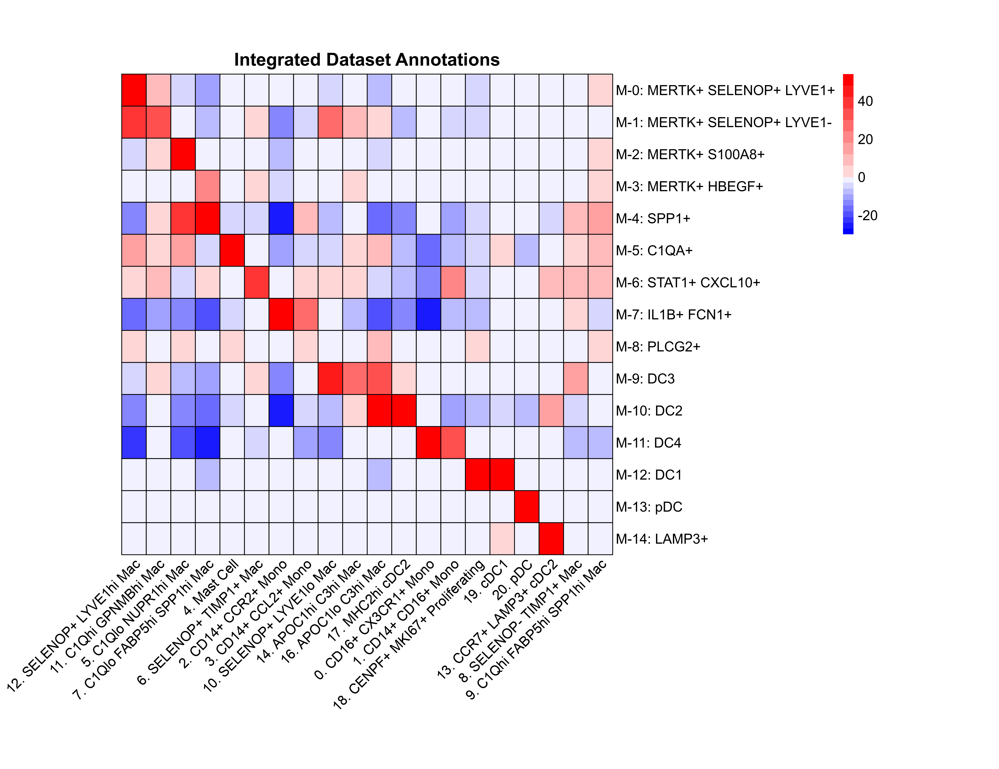

In [84]:
fig.size(10, 13)
pheatmap::pheatmap(or_plot[row.order, col.order], cellwidth = 23, cellheight = 30, 
                   color=colorRampPalette(c("blue", "white", "red"))(20), breaks = c(seq(-30, 0, 3), seq(0.01, 60, 6)), border_color = 'black', scale = 'none',
                   cluster_rows = FALSE, cluster_cols = FALSE, main = 'Integrated Dataset Annotations', fontsize = 13, angle_col = 45)

In [51]:
colnames(or_plot)[ -which(colnames(or_plot) %in% col.order)]

[1] "4. Mast Cell"                "8. SELENOP- TIMP1+ Mac"     
[3] "9. C1Qhi FABP5hi SPP1hi Mac" "15. MHC2lo cDC2"            
[5] "20. pDC"

In [83]:
col.order <- c('12. SELENOP+ LYVE1hi Mac', '11. C1Qhi GPNMBhi Mac', '5. C1Qlo NUPR1hi Mac',
               '7. C1Qlo FABP5hi SPP1hi Mac', '4. Mast Cell', '6. SELENOP+ TIMP1+ Mac', '2. CD14+ CCR2+ Mono', 
               '3. CD14+ CCL2+ Mono', '10. SELENOP+ LYVE1lo Mac', '14. APOC1hi C3hi Mac', 
               '16. APOC1lo C3hi Mac', '17. MHC2hi cDC2', '0. CD16+ CX3CR1+ Mono', '1. CD14+ CD16+ Mono',
               '18. CENPF+ MKI67+ Proliferating', '19. cDC1', '20. pDC', '13. CCR7+ LAMP3+ cDC2', '8. SELENOP- TIMP1+ Mac', '9. C1Qhi FABP5hi SPP1hi Mac')

In [589]:
min(or_plot)

[1] -27.59853

In [420]:
colnames(or_plot)[- which(colnames(or_plot) %in% col.order)]

[1] "1. CD16+ CD14+ Mono"                 "10.  cDC2 LAMP3+ CCR7+"             
 [3] "11.  C1Qhi STAT1+ RNASE+ LYVE1- Mac" "15. C1Qhi STAT1+ RNASE- Mac"        
 [5] "17. APOhi C3hi Mac"                  "19.  APOhi SPP1+ STMN1+ Mac"        
 [7] "20. ALOX5AP+ C3hi Mac"               "4.  APOhi SPP1+ MT1G+ Mac"          
 [9] "7. C1Q+ LIPA+ Mac"                   "9. CCLhi TIMP1+ Mac"

In [80]:
row.order <- c( 'M-0: MERTK+ SELENOP+ LYVE1+', 'M-1: MERTK+ SELENOP+ LYVE1-',
                'M-2: MERTK+ S100A8+',   'M-3: MERTK+ HBEGF+', 'M-4: SPP1+','M-5: C1QA+', 'M-6: STAT1+ CXCL10+','M-7: IL1B+ FCN1+',
                'M-8: PLCG2+',  'M-9: DC3', 'M-10: DC2', 'M-11: DC4', 'M-12: DC1',  'M-13: pDC', 'M-14: LAMP3+')

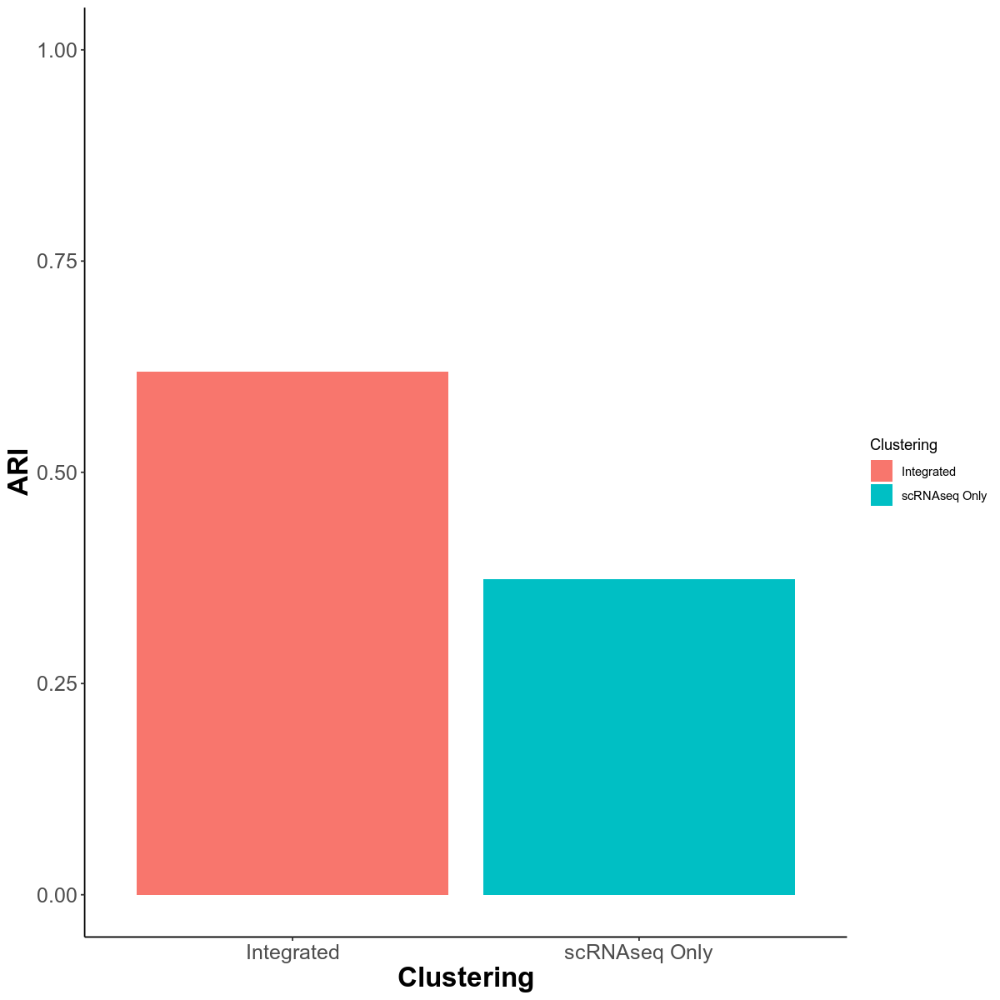

In [347]:
fig.size(10, 10)
ggplot(data.frame(ARI = c(0.619, 0.374), Clustering = c('Integrated', 'scRNAseq Only')), aes(x = Clustering, y = ARI, fill = Clustering)) +
    geom_bar(stat = 'identity') + 
    theme_classic() +  
    scale_y_continuous(limits = c(0 ,1)) +
    theme(axis.title = element_text(size = 20, face = 'bold'), axis.text = element_text(size = 15))

In [331]:
row.order <- c( 'M-12: DC1', 'M-10: DC2', 'M-7: IL1B+ FCN1+', 'M-5: C1QA+', 'M-11: DC4',  'M-0: MERTK+ SELENOP+ LYVE1+',
                 'M-4: SPP1+', 'M-3: MERTK+ HBEGF+', 'M-2: MERTK+ S100A8+', 'M-14: LAMP3+','M-6: STAT1+ CXCL10+', 
                'M-8: PLCG2+', 'M-1: MERTK+ SELENOP+ LYVE1-', 'M-9: DC3', 'M-13: pDC')

In [245]:
df <- ungroup(cell_type)
or <- vector()
statistic <- vector() 
for (i in 1:nrow(df)) {
        inAandB <- df %>% filter(new_annot == df$new_annot[i], 
                                           cell_type_pred_knn == df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        inAnotB <- df %>% filter(new_annot == df$new_annot[i], 
                                           cell_type_pred_knn != df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        inBnotA <- df %>% filter(new_annot != df$new_annot[i], 
                                           cell_type_pred_knn == df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        notBnotA <- df %>% filter(new_annot != df$new_annot[i], 
                                           cell_type_pred_knn != df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        contin <- data.frame(c(inAandB, inBnotA), c(inAnotB, notBnotA))
        or <- (contin[1, 1] * contin[2, 2]) / (contin[1, 2] * contin[2, 1])
        statistic <- c(statistic, sign(log(or)) * sqrt(chisq.test(data.frame(c(inAandB, inBnotA), c(inAnotB, notBnotA)), simulate.p.value = TRUE)$statistic))
        
}

df$stat <- statistic

or_plot <- df %>% select(-n) %>% pivot_wider(names_from = 'new_annot', values_from = 'stat') 
cols <- colnames(or_plot)
or_plot[is.na(or_plot)] <- 0 
or_plot <- or_plot %>% data.frame()
rownames(or_plot) <- or_plot$cell_type_pred_knn
colnames(or_plot) <- cols
or_plot <- or_plot[, -1]

In [157]:
annot_levels =  c('0. CD16++ CXCR31+ Mono', 
                                                              '1. APOhi C1Q+ SPP1hi Mac', 
                                                              '2. CD14+ CD16- CCR2+ Mono', 
                                                              '3. APO+ C1Q+ C3hi Mac', 
                                                              '4. C1Qhi MERTK+ SELENOP + LYVE1+ Mac', 
                                                              '5. CD16+ CD14+ Mono', 
                                                              '6. cDC2', 
                                                              '7. APOhi C1Q+ GPNMBhi Mac',
                                                              '8. C1Qhi MERTK+ SELENOP+ LYVE1- Macrophage', 
                                                              '9. CCLhi TIMP1hi Mac', 
                                                              '10. cDC1', 
                                                              '11. APO+ C1Qlo STMN1+ Mac', 
                                                              '12. APOlo C1Q+ BLVRB+ Mac', 
                                                              '13. CCLhi CXCL10hi Mac', 
                                                              '14. APOhi C1Qhi NEAT1+ Mac', 
                                                              '15. APO+ C1Qhi GPMNBhi Mac', 
                                                              '16. APOlo C1Qlo FOS+ LYZ+ Mac', 
                                                              '17. APOhi C1Qlo GPNMBhi Mac', 
                                                              '18. cDC2 LAMP3+ CCR7+', 
                                                              '19. MAST Cells',
                                                              '20. APOhi C1Qlo SPP1hi Mac',
                                                              '21. cDC2 / pDCs',
                                                              '22. APOhi C1Qhi NEAT1- Mac')

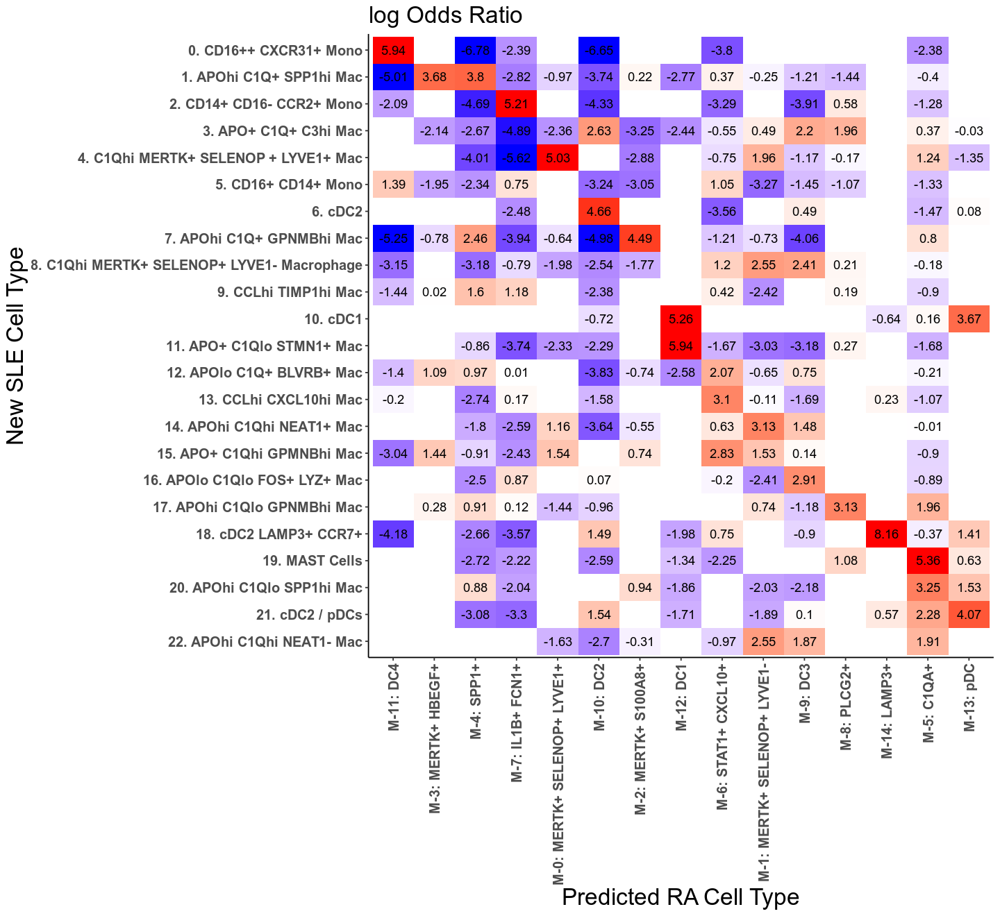

In [158]:
fig.size(11, 12)
ggplot(df, aes(x = cell_type_pred_knn, y = factor(annotation, levels = rev(annot_levels)), fill = log(or))) +
    geom_tile() + 
    geom_text(aes(label = round(log(or), 2))) + 
    theme_classic() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1),
          axis.text = element_text(size = 12, face = 'bold'), legend.position = 'none',
          axis.title = element_text(size = 20), plot.title = element_text(size = 20)) +
    scale_fill_gradient2(low = 'blue', mid = 'white', high = 'red', limits = c(-5, 5), oob=scales::squish) + 
    scale_x_discrete(limits = c('M-11: DC4', 'M-3: MERTK+ HBEGF+', 'M-4: SPP1+', 'M-7: IL1B+ FCN1+', 
                                'M-0: MERTK+ SELENOP+ LYVE1+', 'M-10: DC2', 'M-2: MERTK+ S100A8+', 
                                'M-12: DC1', 'M-6: STAT1+ CXCL10+', 'M-1: MERTK+ SELENOP+ LYVE1-', 
                                 'M-9: DC3', 'M-8: PLCG2+', 'M-14: LAMP3+',
                                 'M-5: C1QA+', 'M-13: pDC')) + 
    labs(x = 'Predicted RA Cell Type', y = 'New SLE Cell Type', title = 'log Odds Ratio') 

### Clustering Performance

In [38]:
library(fpc)

In [192]:
old_harmony <- readRDS("/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/Final-Arnon-Output/all_myeloid_cells.post_tSNE.rds")@reductions$harmony@cell.embeddings
old_annot <-  readRDS("/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/Final-Arnon-Output/all_myeloid_cells.w_clustering.rds")@active.ident
old_symphony <- readRDS("/data/srlab/ssg34/SLE_kidney_v2/data/arnon_old_symphony_res.rds")

In [180]:
new_symphony <- query$meta_data

In [193]:
old_harmony <- old_harmony[rownames(old_harmony) %in% old_symphony$cells, ]

In [194]:
old_annot <- old_annot[names(old_annot) %in% old_symphony$cells]

In [199]:
old_symphony <- cbind(old_symphony, old_harmony[, 1:20], old_annot)

In [214]:
new_symphony <- new_symphony %>% filter(cell_type_pred_knn_prob > 0.8)
old_symphony <- old_symphony %>% filter(cell_type_pred_knn_prob > 0.8)

In [ ]:
new_dist <- dist(qcd_meta[, paste0('hPC', 1:20)])

In [ ]:
old_dist <- dist(old_harmony[, paste0('harmony_', 1:20)])

In [251]:
new_symphony <- new_symphony %>% mutate(symphony_cluster = as.numeric(str_match(cell_type_pred_knn, "M-\\s*(.*?)\\s*:")[, 2]))

In [252]:
old_symphony <- old_symphony %>% mutate(symphony_cluster = as.numeric(str_match(cell_type_pred_knn, "M-\\s*(.*?)\\s*:")[, 2]))

In [268]:
old_symphony <- left_join(old_symphony, myeloid_conv %>% rename(old_annot = name))

Joining, by = "old_annot"


In [255]:
new_stats <- fpc::cluster.stats(, as.numeric(new_symphony$hres0.8),
                           noisecluster=FALSE,
                              silhouette = TRUE, G2 = FALSE, G3 = FALSE,
                              wgap=TRUE, sepindex=TRUE, sepprob=0.1,
                              sepwithnoise=TRUE,
                              compareonly = FALSE,
                              aggregateonly = FALSE)

Warning message in fpc::cluster.stats(new_dist, as.numeric(new_symphony$hres0.8), :
“clustering renumbered because maximum != number of clusters”


In [256]:
old_stats <- fpc::cluster.stats(old_dist, as.numeric(old_symphony$old_annot),
                           noisecluster=FALSE,
                              silhouette = TRUE, G2 = FALSE, G3 = FALSE,
                              wgap=TRUE, sepindex=TRUE, sepprob=0.1,
                              sepwithnoise=TRUE,
                              compareonly = FALSE,
                              aggregateonly = FALSE)

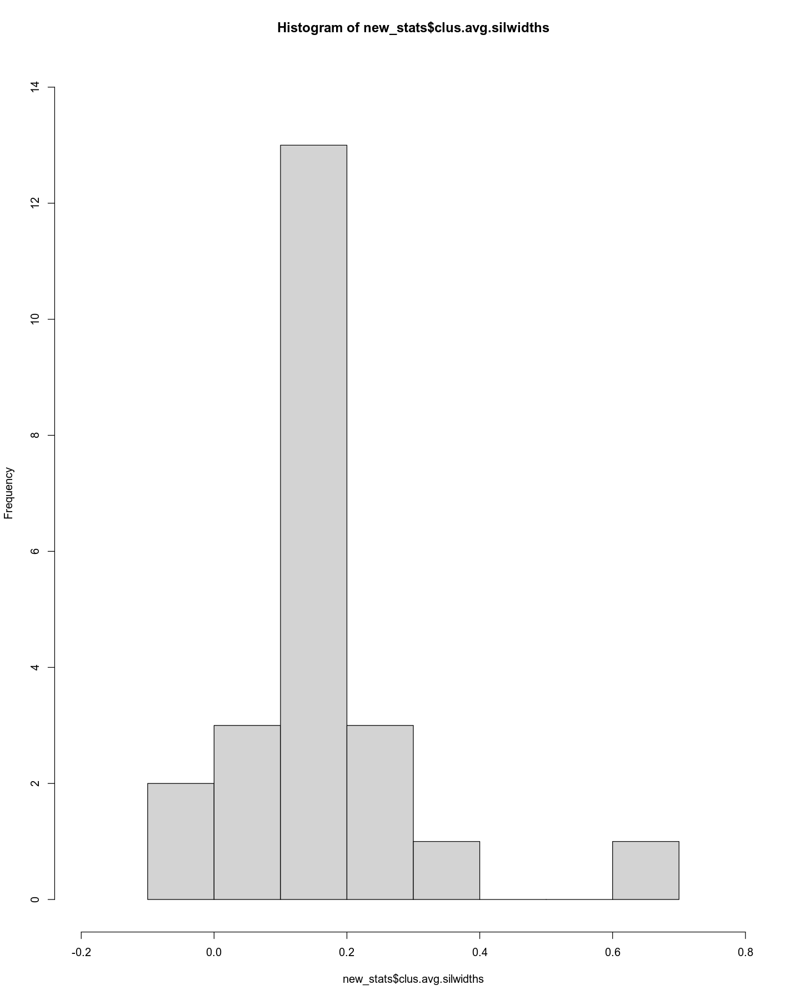

In [96]:
hist(new_stats$clus.avg.silwidths, xlim = c(-0.2, 0.8), ylim = c(0, 14))

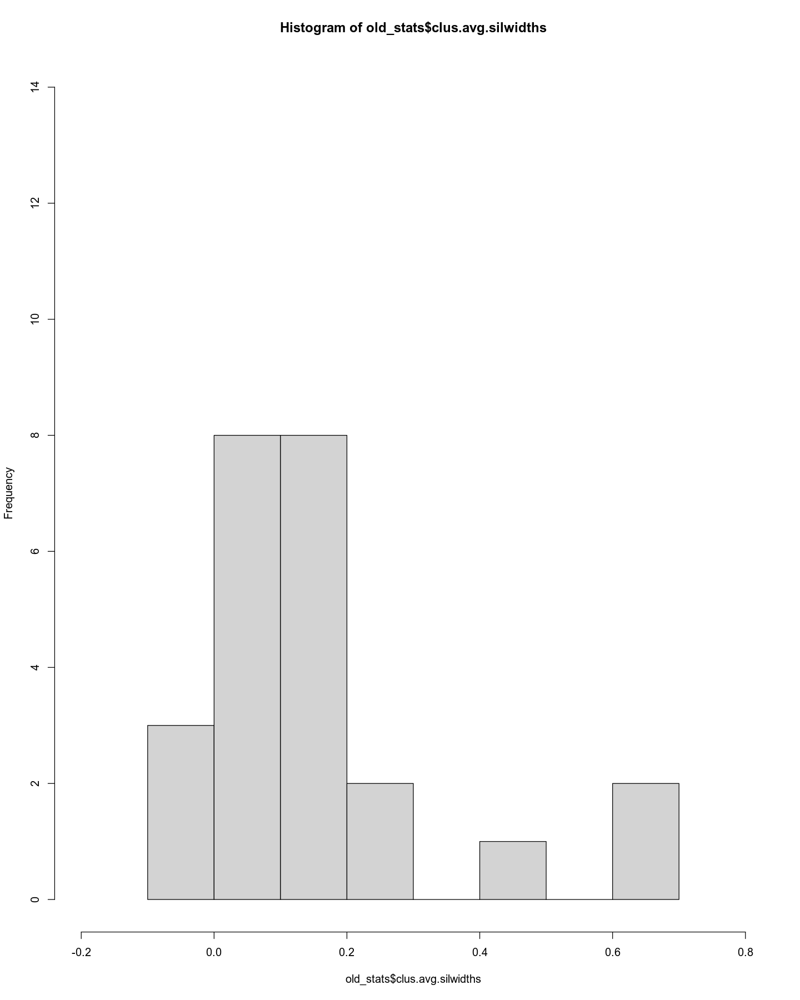

In [97]:
hist(old_stats$clus.avg.silwidths, xlim = c(-0.2, 0.8), ylim = c(0, 14))

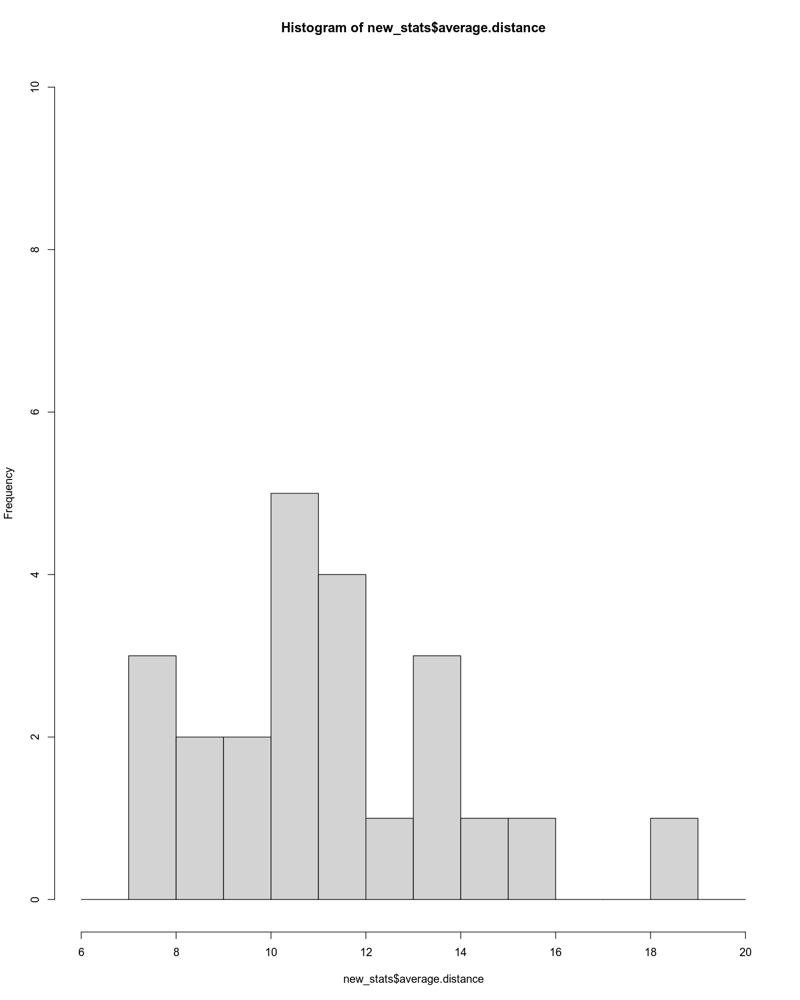

In [84]:
hist(new_stats$average.distance, xlim = c(6, 20), ylim = c(0, 10), breaks = seq(6, 20))

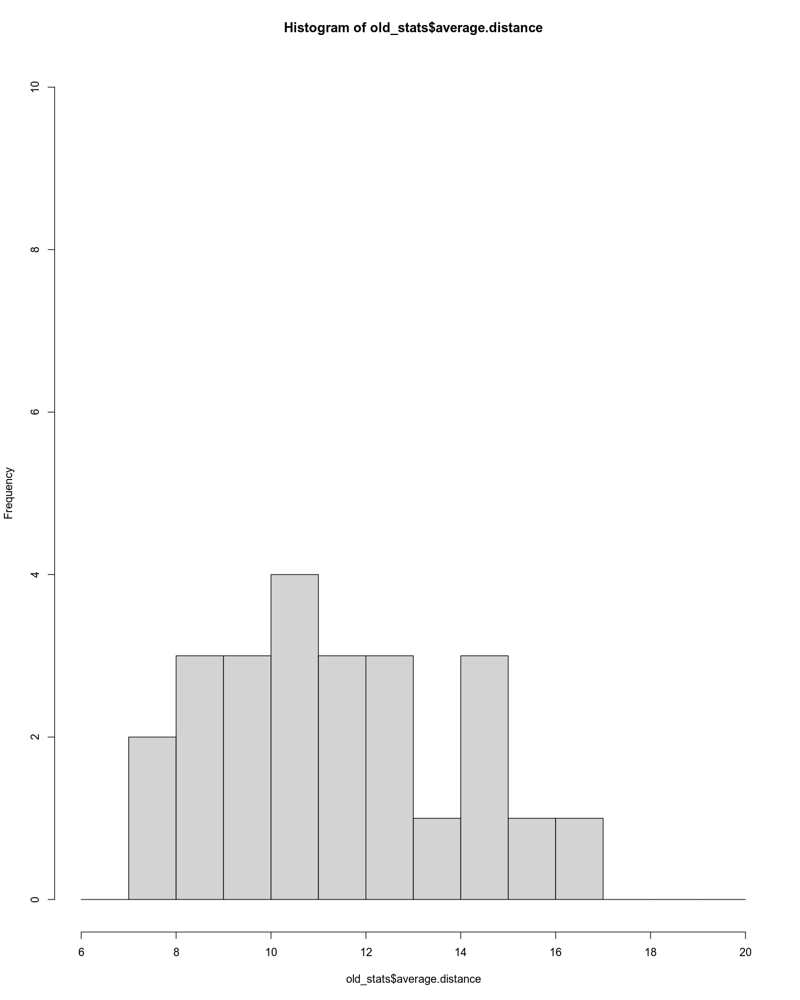

In [83]:
hist(old_stats$average.distance, xlim = c(6, 20), ylim = c(0, 10), breaks = seq(6, 20))

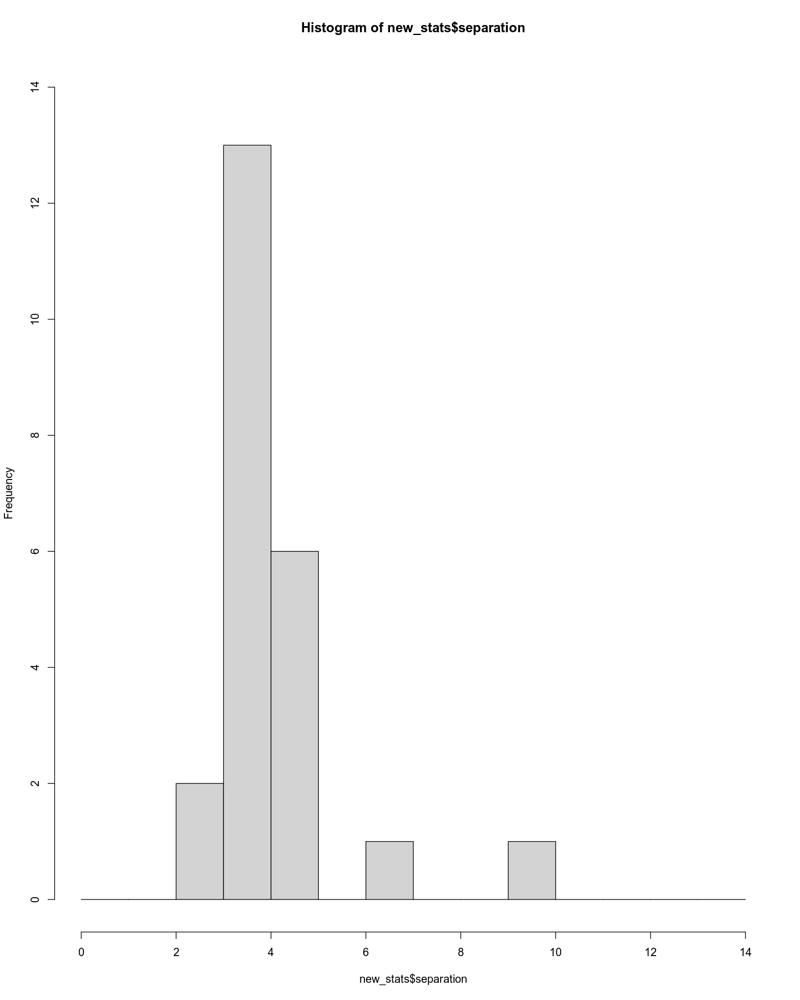

In [77]:
hist(new_stats$separation, xlim = c(0, 14), breaks = seq(0, 14 ,1), ylim = c(0, 14))

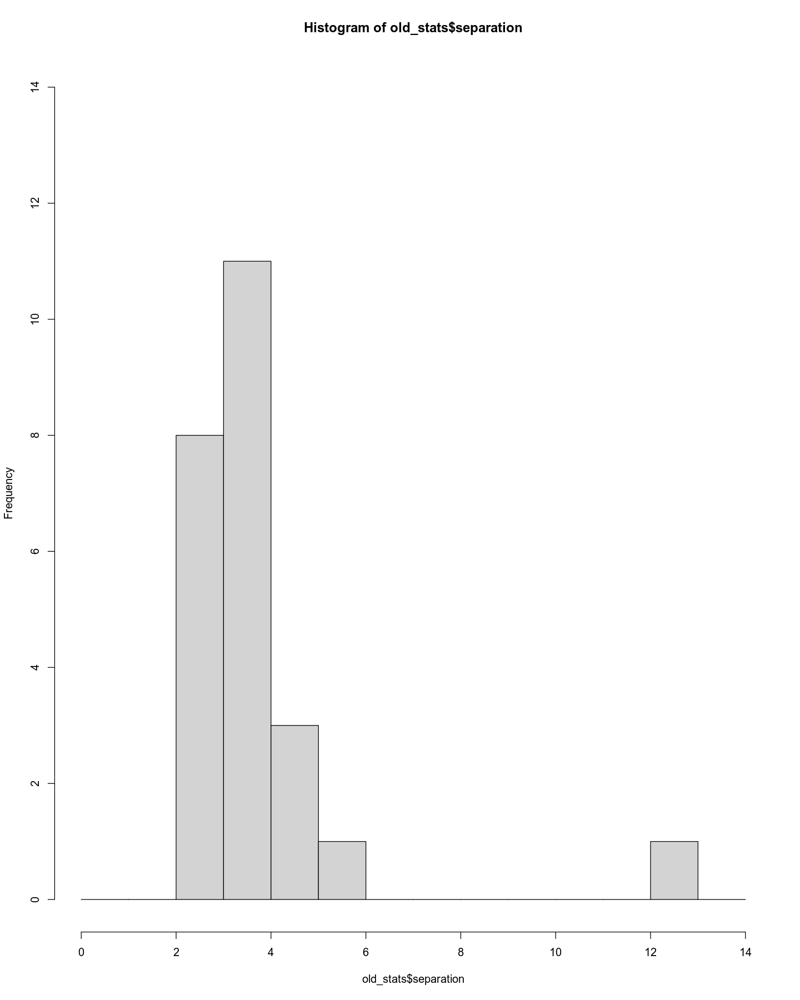

In [78]:
hist(old_stats$separation, xlim = c(0, 14), breaks = seq(0, 14 ,1), ylim = c(0, 14))

In [258]:
library(cluster)

Warning message:
“package ‘cluster’ was built under R version 4.1.2”


In [259]:
old_silhouette <- silhouette(old_annot %>% as.numeric(), dist(old_harmony[, 1:20]))

In [115]:
new_silhouette <- silhouette(qcd_meta$hres0.8, new_dist)

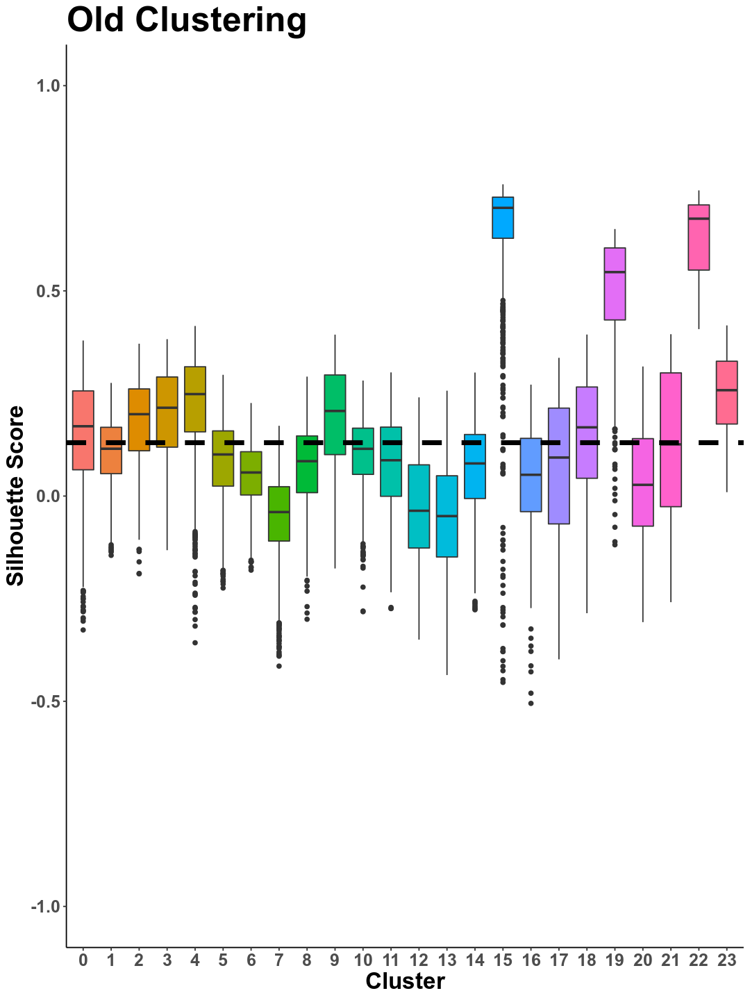

In [264]:
fig.size(12, 9)
ggplot(old_silhouette %>% data.frame() %>% mutate(cluster = cluster - 1), aes(x = factor(cluster), y = sil_width, fill = as.factor(cluster))) +
    geom_boxplot() + 
    theme_classic() + 
    theme(legend.position = 'none', axis.text = element_text(size = 15, face = 'bold'), axis.title = element_text(size = 20, face = 'bold'), plot.title = element_text(size = 30, face = 'bold')) +
    geom_hline(yintercept = 0.130085785691011, linetype = 'dashed', size = 2) + 
    labs(x = 'Cluster', y = 'Silhouette Score', title = 'Old Clustering') + 
    scale_y_continuous(limits = c(-1, 1))

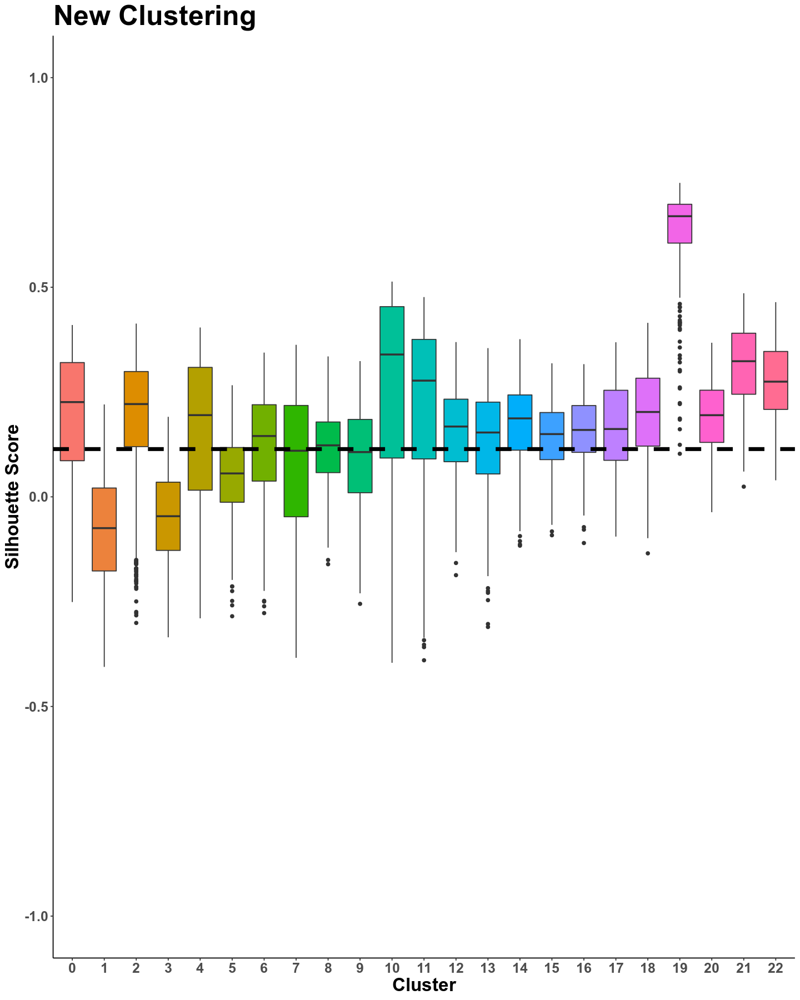

In [220]:
ggplot(new_silhouette %>% data.frame(), aes(x = factor(cluster), y = sil_width, fill = as.factor(cluster))) +
    geom_boxplot() + 
    theme_classic() + 
    theme(legend.position = 'none', axis.text = element_text(size = 15, face = 'bold'), axis.title = element_text(size = 20, face = 'bold'), plot.title = element_text(size = 30, face = 'bold')) +
    geom_hline(yintercept = 0.113963570973156, size = 2, linetype = 'dashed') + 
    labs(x = 'Cluster', y = 'Silhouette Score', title = 'New Clustering') + 
    scale_y_continuous(limits = c(-1, 1))

In [173]:
data.frame(maxwithindist = masxwithindist, avgwithindist = new_stats$average.distance, sep = new_stats$separation)
data.frame(maxwithindist = ,withindist = old_stats$average.distance, sep = old_stats$separation)

withindist,sep
<dbl>,<dbl>
11.824059,2.366592
15.553534,3.316560
10.188081,3.010421
11.594726,3.341013
11.098809,3.642326
12.257585,2.366592
10.676464,3.468850
14.685673,3.952908
9.520267,3.642326


withindist,sep
<dbl>,<dbl>
11.175646,3.172587
7.652553,2.203649
7.383415,2.203649
8.110325,2.591696
9.412293,2.790214
11.141875,3.351598
8.624029,2.587405
14.581079,3.669656
12.697021,3.244657


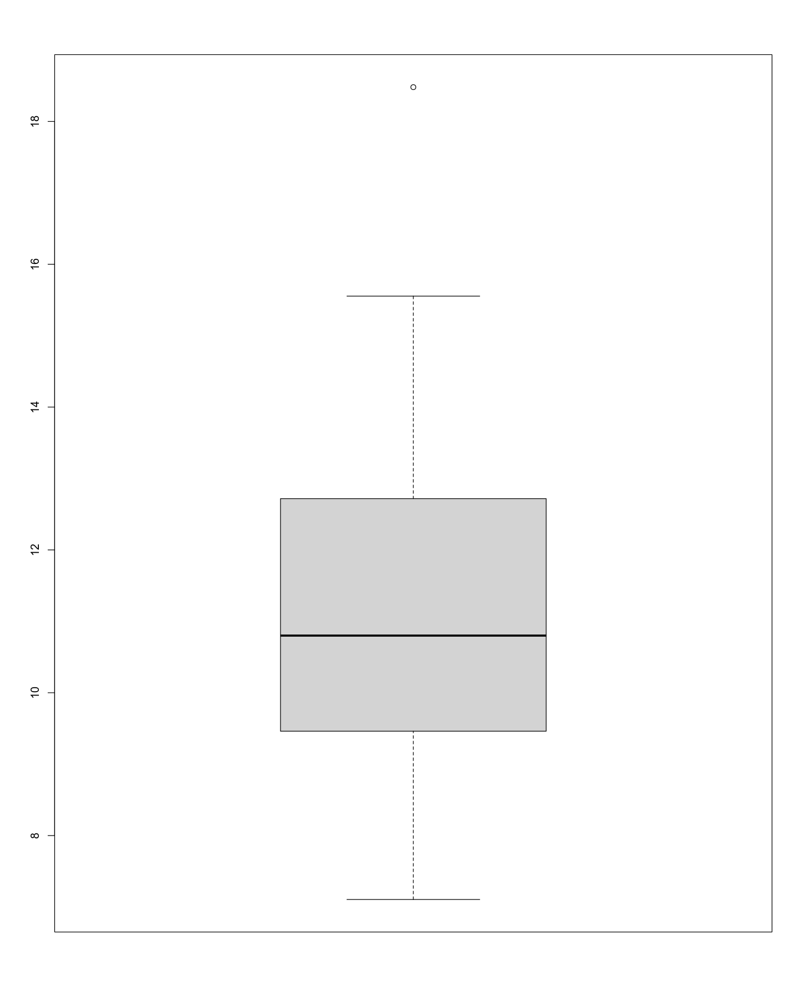

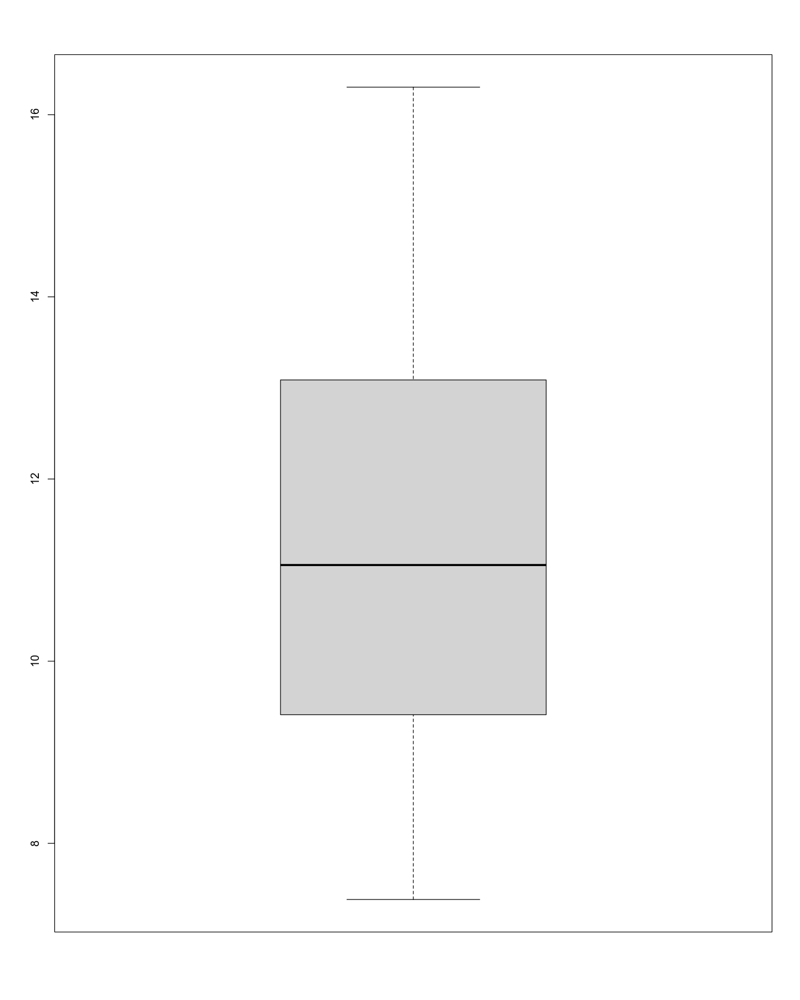

In [175]:
boxplot(new_stats$average.distance)
boxplot(old_stats$average.distance)

In [ ]:
old_ari <- aricode::ARI(old_symphony$arnon_annot, old_symphony$cell_type_pred_knn)

In [280]:
aricode::ARI(as.numeric(old_symphony$old_annot), old_symphony$symphony_cluster)

[1] 0.3742843

In [281]:
aricode::ARI(new_symphony$hres0.8, new_symphony$symphony_cluster)

[1] 0.6186167

In [286]:
aricode::NMI(as.numeric(old_symphony$old_annot), as.numeric(old_symphony$symphony_cluster))

[1] 0.4945114

In [285]:
aricode::NMI(new_symphony$hres0.8, new_symphony$symphony_cluster)

[1] 0.5473981

In [289]:
aricode::entropy(new_symphony$hres0.8, new_symphony$symphony_cluster)

$UV
[1] 3.267373

$U
[1] 2.555374

$V
[1] 2.110806

$sortPairs
$sortPairs$spMat
NULL

$sortPairs$levels
$sortPairs$levels$c1
 [1]  0  6  2 10  4 19  3  8 18 11  1 14 13  5 21 15  9 12  7 17 20 16 22

$sortPairs$levels$c2
 [1] 11 10  7 12  1  5  9  0 13 14  6  3  4  2  8


$sortPairs$nij
  [1] 4080    1   78   26    5    1 1110   14   16   71    4   84    5 2105   47
 [16]    2    3    3    3   26  363   30   26    1    1  159  193   13  590    1
 [31]   18    2    1    1    4    1  177    2    1  844    2    5   69  153  273
 [46]    6    5   40    1   10    1    9    5    1   21   82   24   99    2   49
 [61]    1    1    1   63    1    7    1    2   74   12    2    1  371    1    5
 [76]    3   18    5    6   21    3   44   90   21   21   99   38 1364   22    1
 [91]    1    2   90   16   34   18   18    2    1   70   10   51    5    9    2
[106]    2  151    2  753    4  325    1   25    9  137    1   17    1   43    1
[121]    1   47    6   14    1    2    3   21    6    9   29   82    2    8    2
[136]   30    5  140    9   20  154   19    1   34    1    5   14   21   71    2
[151]   65    1    2    2   13  109    1   13    9    1  522  154    4   25    5
[166]   46    1    1   40    4    2    1    1   88    2   32    2   13   56    5
[181]   88    6    1    1   25   34   20

$sortPairs$ni.
 [1] 4191 1215 2252  446  978  186 1418  286  160  401 1735  182  302 1273  113
[16]  164  358  234  826  126  128  169   80

$sortPairs$n.j
 [1] 5050 2141 2888  747  521 1176  671  680   54   78  723   45 2244  185   20

$sortPairs$pair_c1
  [1]  0  0  0  0  0  0  1  1  1  1  1  2  2  2  2  2  2  2  2  3  3  3  3  3  4
 [26]  4  4  4  4  4  4  4  4  5  5  5  5  5  5  6  6  6  6  6  6  6  6  6  6  6
 [51]  6  6  7  7  7  7  7  7  7  7  7  7  7  8  8  8  8  8  8  8  9  9  9  9  9
 [76]  9  9 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11 11 11 11 11 11 11 11 12
[101] 12 12 12 12 12 12 12 12 13 13 13 13 13 13 13 13 13 13 14 14 14 14 14 14 14
[126] 15 15 15 15 15 15 15 15 15 15 16 16 16 16 16 16 17 17 17 17 17 17 17 17 17
[151] 17 17 18 18 18 18 18 18 18 18 18 18 19 19 19 19 19 19 19 19 20 20 20 20 20
[176] 20 20 21 21 21 21 21 21 22 22 22 22

$sortPairs$pair_c2
  [1]  0  1  2  5 10 12  1  2  5  6  8  0  1  2  5  6 10 12 14  1  3  5  8  9  2
 [26]  4  5  6  7  8 10 12 14  1  2  3  5 12 14  1  2  3  4  5  6  7  8 10 11 12
 [51] 13 14  0  1  2  4  5  6  7 10 12 13 14  1  3  5  6  8  9 10  1  2  3  4  5
 [76] 10 12  0  1  2  3  4  5  6  7 10 11 12 13 14  1  2  4  5  6  7 10 12 13  0
[101]  1  2  4  5  6  9 10 12  0  1  2  4  5  6 10 11 12 13  1  2  3  5  6  8  9
[126]  0  2  4  5  6  7 10 11 12 13  0  1  2  5 10 12  0  1  2  3  4  5  6 10 11
[151] 12 13  0  2  4  5  6  7 10 11 12 13  1  2  4  5  6  7 12 14  2  3  4  5  8
[176] 12 13  1  2  5  6 10 12  1  4  5  6

In [381]:
good_heatmap <- matrix(nrow = 4, ncol = 4)

In [403]:
good_heatmap[1, ] <- c(0.9, 0.033, 0.033, 0.033)
good_heatmap[2, ] <- c(0.033, 0.9, 0.033, 0.033)
good_heatmap[3, ] <- c(0.033, 0.033, 0.9, 0.033)
good_heatmap[4, ] <- c(0.033, 0.033, 0.033, 0.9)

In [404]:
colnames(good_heatmap) <- c('A', 'B', 'C', 'D')
rownames(good_heatmap) <- c('1', '2', '3', '4')

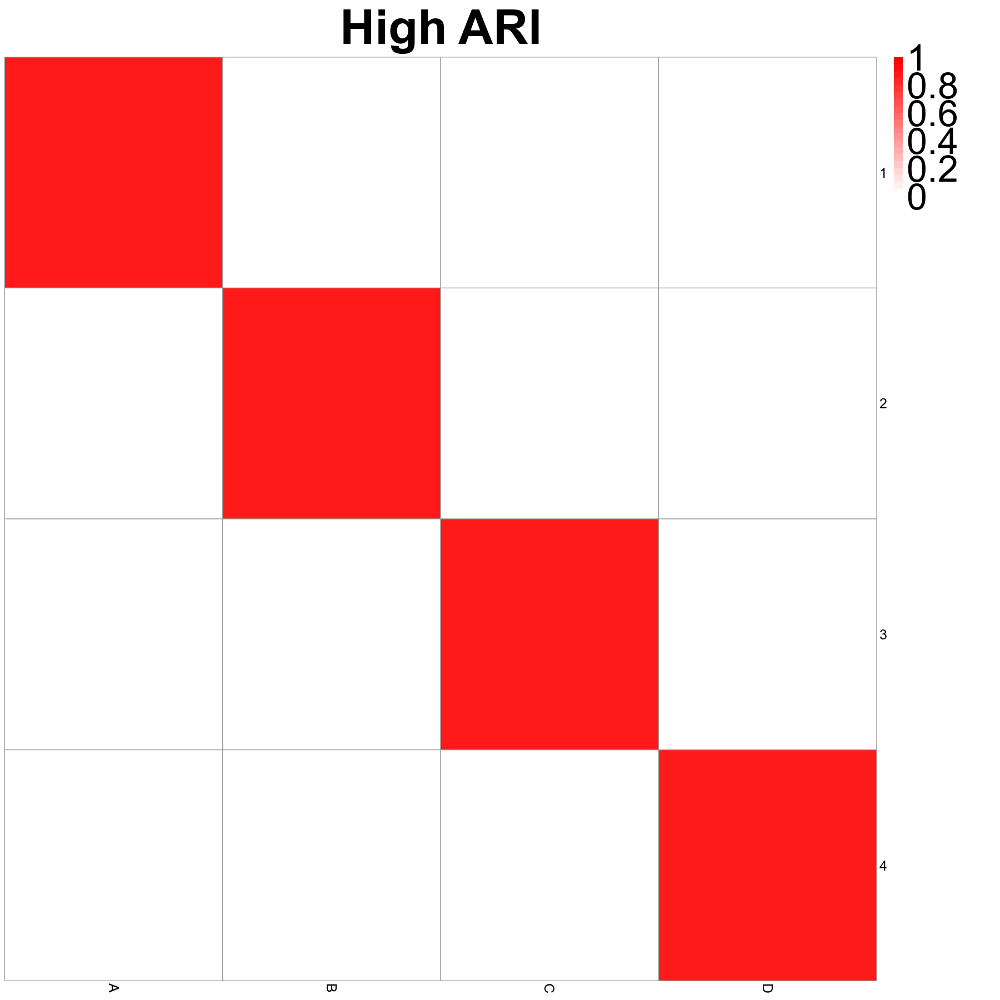

In [405]:
pheatmap(good_heatmap, scale = 'none', cluster_rows = F, cluster_cols = F, color=colorRampPalette(c("white", "red"))(20), breaks = seq(0, 1, 0.05), fontsize_row = 15, fontsize_col = 15, fontsize = 40, main = 'High ARI')

### CNA prep

In [4]:
library(readxl)
library(stringr)
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_meta_harmonizedPCUMAPCellStateClusters_10042022.rds')
clinical <- read_xlsx("/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/cell-seq-output/FinalClinical/final_clinical_data_8-10-21_ResponderNA.xlsx")
clinical <- clinical %>% 
                        mutate(individual = str_split(Sample, '-')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[2])

Warning message:
“package ‘readxl’ was built under R version 4.1.3”


In [13]:
sn_cna_meta <- qcd_meta %>% 
                        filter(dataset == 'snRNAseq') %>% 
                        mutate(individual = str_split(sample, '_')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[3]) %>% left_join(clinical %>% 
                                                                                 select(-c('sample', 'Sample', 'Site', 'Type', 'processing.batch')), 
                                                                                 by = 'individual')
sc_cna_meta <- qcd_meta %>% 
                        filter(dataset == 'scRNAseq') %>% 
                        mutate(individual = str_split(sample, '_')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[3]) %>% left_join(clinical %>% 
                                                                                 select(-c('sample', 'Sample', 'Site', 'Type', 'processing.batch')), 
                                                                                 by = 'individual')

In [33]:
sc_cna_meta %>% filter(Type == "Control") %>% pull(sample) %>% table() %>% data.frame() %>% pull(Freq) %>% mean()

[1] 19.76667

#### Case/Control

In [6]:
meta <- sn_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sn_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sn_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Type == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type_numeric <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_casecontrol_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_casecontrol_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_casecontrol_umap.csv', row.names = FALSE, quote = FALSE)

[1] 0

In [7]:
meta <- sc_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sc_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sc_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Type == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type_numeric <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_casecontrol.meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_casecontrol_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_casecontrol_umap.csv', row.names = FALSE, quote = FALSE)

[1] 0

#### Chronicity

In [90]:
meta <- sn_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sn_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sn_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Chronicity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 301

In [103]:
meta <- sc_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sc_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sc_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Chronicity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 5618

##### scRNAseq Chronicity with snRNAseq Matched Samples

In [98]:
sc_cna_meta_subset <- sc_cna_meta %>% filter(individual %in% unique(sn_cna_meta$individual))

meta <- sc_cna_meta_subset %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                                      colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sc_cna_meta_subset %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sc_cna_meta_subset %>% select(c(hUMAP1, hUMAP2))

ind <- meta$Chronicity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.meta.matchedsamples.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_harmony.matchedsamples.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_umap.matchedsamples.csv', row.names = FALSE, quote = FALSE)

[1] 1139

#### Activity

In [216]:
sn_cna_meta <- qcd_meta %>% 
                        filter(dataset == 'snRNAseq') %>% 
                        mutate(individual = str_split(sample, '_')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[3]) %>% left_join(clinical %>% 
                                                                                 select(-c('sample', 'Sample', 'Site', 'Type', 'processing.batch')), 
                                                                                 by = 'individual')
sc_cna_meta <- qcd_meta %>% 
                        filter(dataset == 'scRNAseq') %>% 
                        mutate(individual = str_split(sample, '_')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[3]) %>% left_join(clinical %>% 
                                                                                 select(-c('sample', 'Sample', 'Site', 'Type', 'processing.batch')), 
                                                                                 by = 'individual')

In [218]:
meta <- sn_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sn_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sn_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Activity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_activity_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_activity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_activity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 287

In [219]:
meta <- sc_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sc_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sc_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Activity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_activity.meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_activity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_activity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 5475

### CNA visualization

In [2]:
library(ggbeeswarm)
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Myeloid_clusterQCd_meta_harmonizedPCUMAPCellStateClusters_10042022.rds')

#### sc Case/Control

Joining, by = "cell"


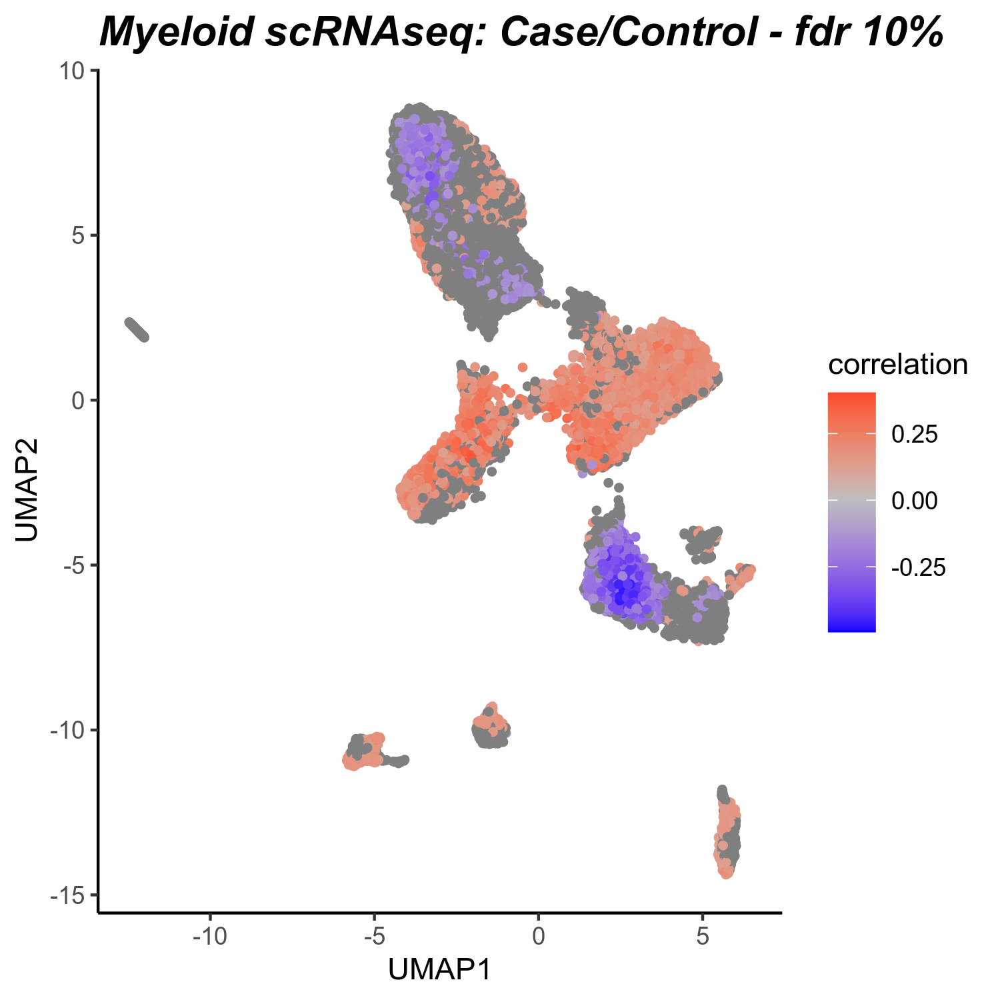

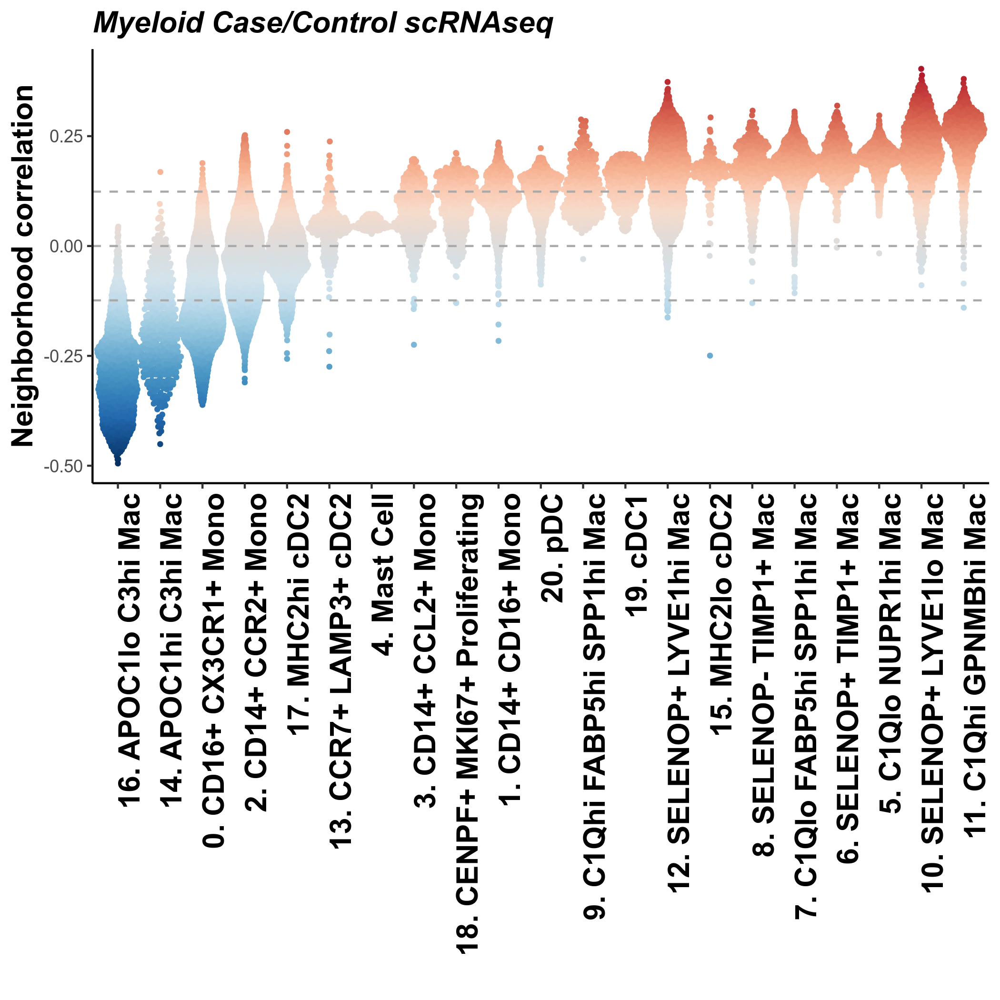

In [4]:
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_casecontrol.meta.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell, annotation))
kept <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_casecontrol.kept.csv')
kept <- kept[, 1]
kept <- which(kept == TRUE)
thresh <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_casecontrol.thresh.csv', header = FALSE)
ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_casecontrol.ncorrs.csv', header = FALSE)
ncorr <- ncorr[, 1]

meta_tmp_1 <- meta
meta_tmp_1$ncorr <- as.numeric(ncorr)

thresh10 <- thresh[2, ]


meta_tmp_1$ncorr <- as.numeric(ncorr)


umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_casecontrol_umap.csv')

sn_umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_casecontrol_umap.csv')

meta_tmp_1$UMAP1 <- umap$hUMAP1
meta_tmp_1$UMAP2 <- umap$hUMAP2


meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh10)] <- NA


fig.size(5, 5)
ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),] %>% rename(correlation = ncorr), 
      aes(x = UMAP1, y = UMAP2)) + 
      geom_point(mapping = aes(color = correlation), alpha = 5, size = 1) + 
#      geom_point(data = qcd_meta %>% filter(dataset == 'snRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'black', alpha = 0.1) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_classic() +
      theme(
        plot.title = element_text(color="black", size=15, face="bold.italic")
        ) +
      labs(title = "Myeloid scRNAseq: Case/Control - fdr 10%") 
pos_fdr_thres <- thresh10
neg_fdr_thresh <- -1 * thresh10


meta$ncorr <- as.numeric(ncorr)

interval <- c(-max(abs(meta$ncorr)), max(abs(meta$ncorr)))


myPalette <- colorRampPalette(c(RColorBrewer::brewer.pal(11, "RdBu")[11:7], "#DCDCDC", RColorBrewer::brewer.pal(11, "RdBu")[5:1]))
fig.size(7, 7)

ggplot(meta, aes(x = reorder(annotation, ncorr), y = ncorr)) +
    ggbeeswarm::geom_quasirandom(aes(color = ncorr), width = 0.5, size = 0.75) +
    geom_hline(yintercept = thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = -1 * thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "darkgrey") +
    scale_colour_gradientn(colours = myPalette(20), limits = interval) +
    labs(title = "Myeloid Case/Control scRNAseq", x= "", y = "Neighborhood correlation") +
    theme_classic() +
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=15, face = "bold.italic"),
        axis.text.x = element_text(color = "black", size = 15, angle = 90, hjust=1, face = "bold"),
        axis.title = element_text(size=15, face = "bold"))

#### sn Case/Control

Joining, by = "cell"


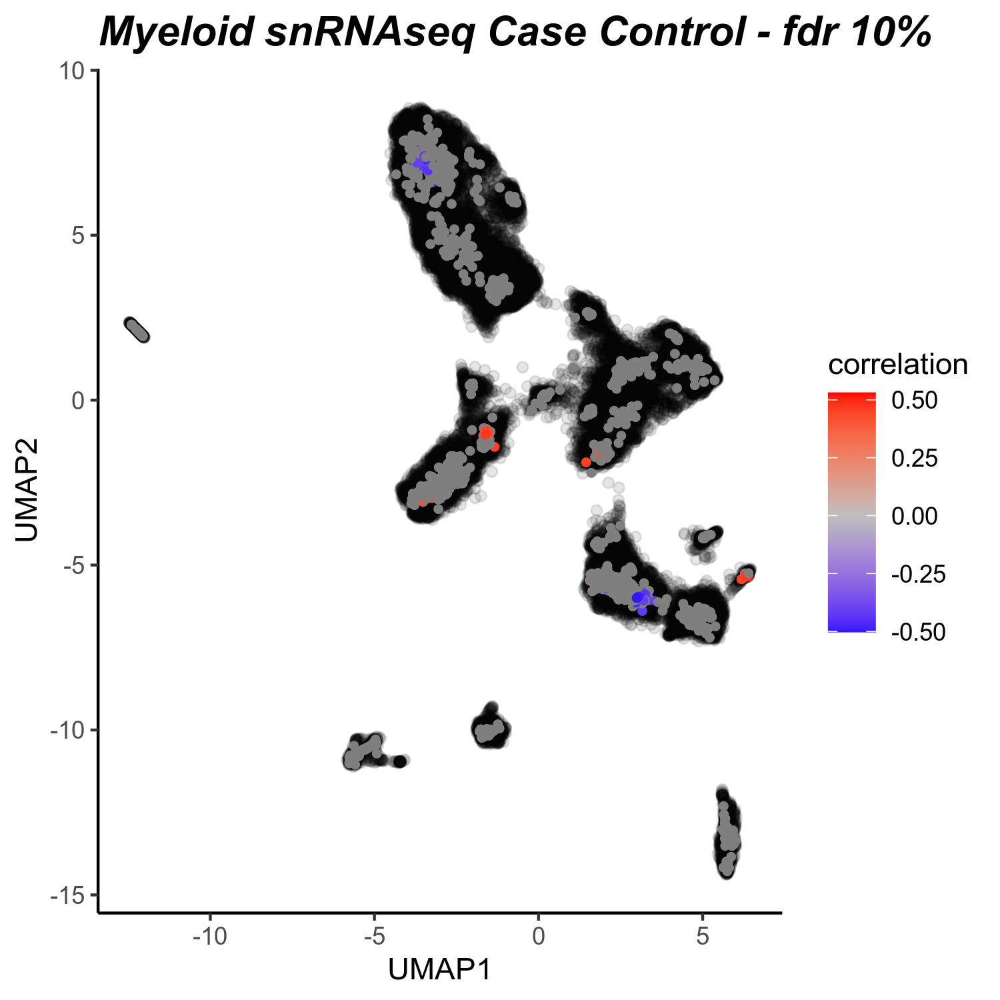

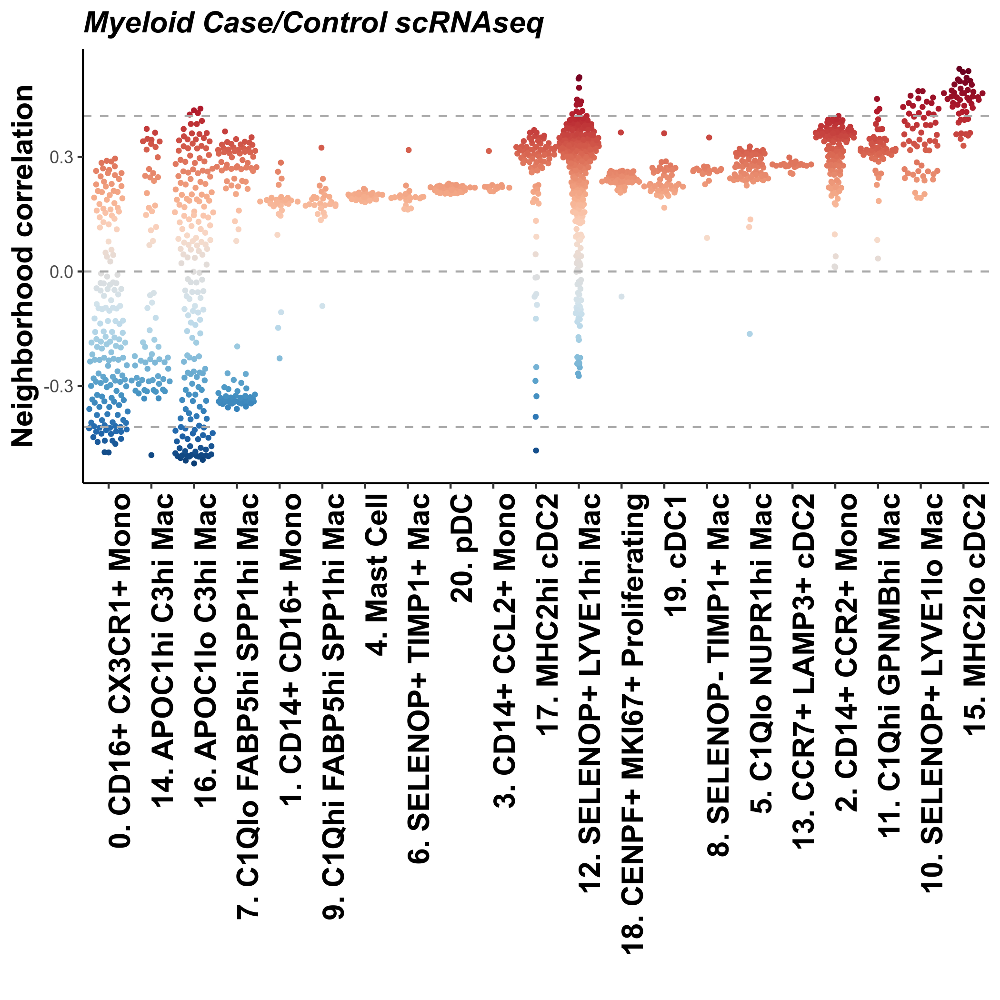

In [5]:
library(ggbeeswarm)

meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_casecontrol_meta.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell, annotation))
kept <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_casecontrol.kept.csv')
kept <- kept[, 1]
kept <- which(kept == TRUE)
thresh <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_casecontrol.thresh.csv', header = FALSE)
ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_casecontrol.ncorrs.csv', header = FALSE)
ncorr <- ncorr[, 1]

thresh10 <- thresh[1, ]


meta_tmp_1 <- meta
meta_tmp_1$ncorr <- as.numeric(ncorr)


umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_casecontrol_umap.csv')

meta_tmp_1$UMAP1 <- umap$hUMAP1
meta_tmp_1$UMAP2 <- umap$hUMAP2

meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh10)] <- NA


sc_umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_casecontrol_umap.csv')

fig.size(5, 5)
ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),] %>% rename(correlation = ncorr), 
      aes(x = UMAP1, y = UMAP2)) + 
      geom_point(data = qcd_meta %>% filter(dataset == 'scRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'black', alpha = 0.1) + 
      geom_point(mapping = aes(color = correlation), alpha = 5, size = 1) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_classic()+
      theme(
        plot.title = element_text(color="black", size=15, face="bold.italic")
        ) +
      labs(title = "Myeloid snRNAseq Case Control - fdr 10%")

pos_fdr_thres <- thresh10
neg_fdr_thresh <- -1 * thresh10


meta$ncorr <- as.numeric(ncorr)

interval <- c(-max(abs(meta$ncorr)), max(abs(meta$ncorr)))


myPalette <- colorRampPalette(c(RColorBrewer::brewer.pal(11, "RdBu")[11:7], "#DCDCDC", RColorBrewer::brewer.pal(11, "RdBu")[5:1]))
fig.size(7, 7)

ggplot(meta, aes(x = reorder(annotation, ncorr), y = ncorr)) +
    ggbeeswarm::geom_quasirandom(aes(color = ncorr), width = 0.5, size = 0.75) +
    geom_hline(yintercept = thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = -1 * thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "darkgrey") +
    scale_colour_gradientn(colours = myPalette(20), limits = interval) +
    labs(title = "Myeloid Case/Control scRNAseq", x= "", y = "Neighborhood correlation") +
    theme_classic() +
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=15, face = "bold.italic"),
        axis.text.x = element_text(color = "black", size = 15, angle = 90, hjust=1, face = "bold"),
        axis.title = element_text(size=15, face = "bold"))

#### sc Chronicity

Joining, by = "cell"


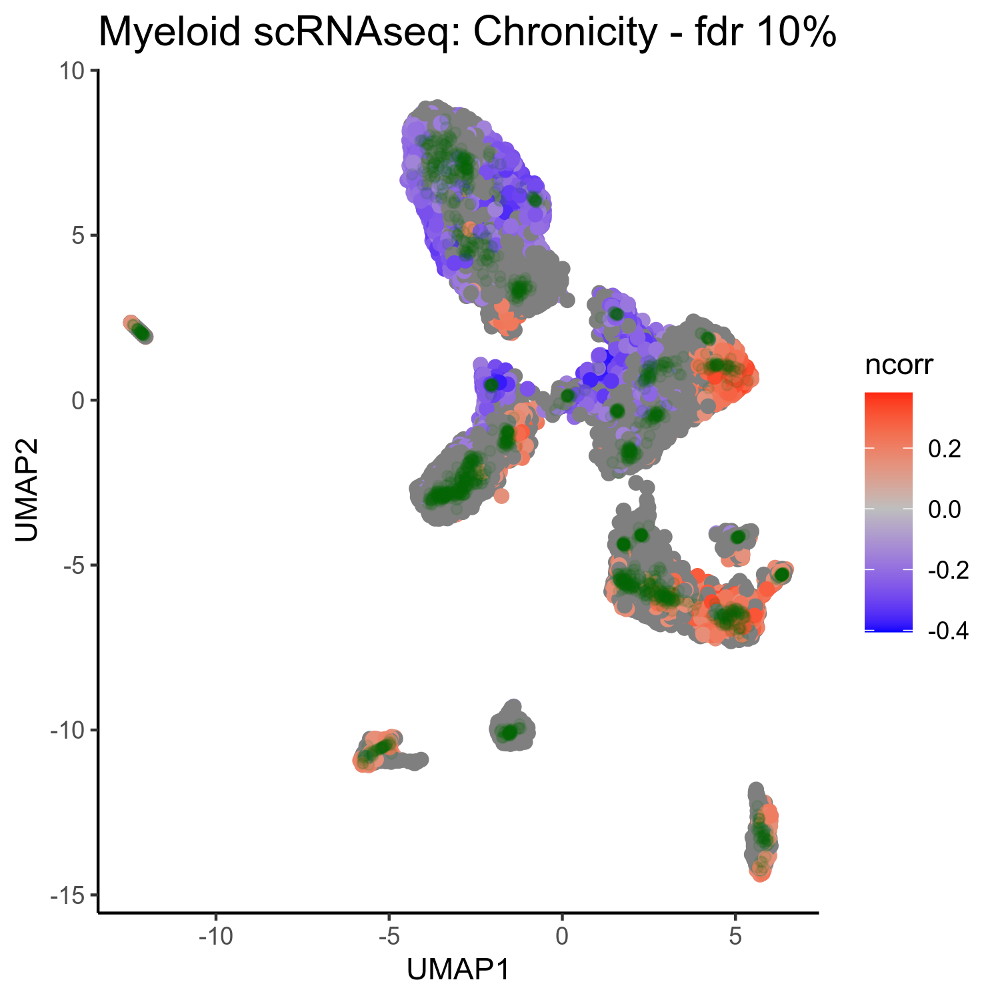

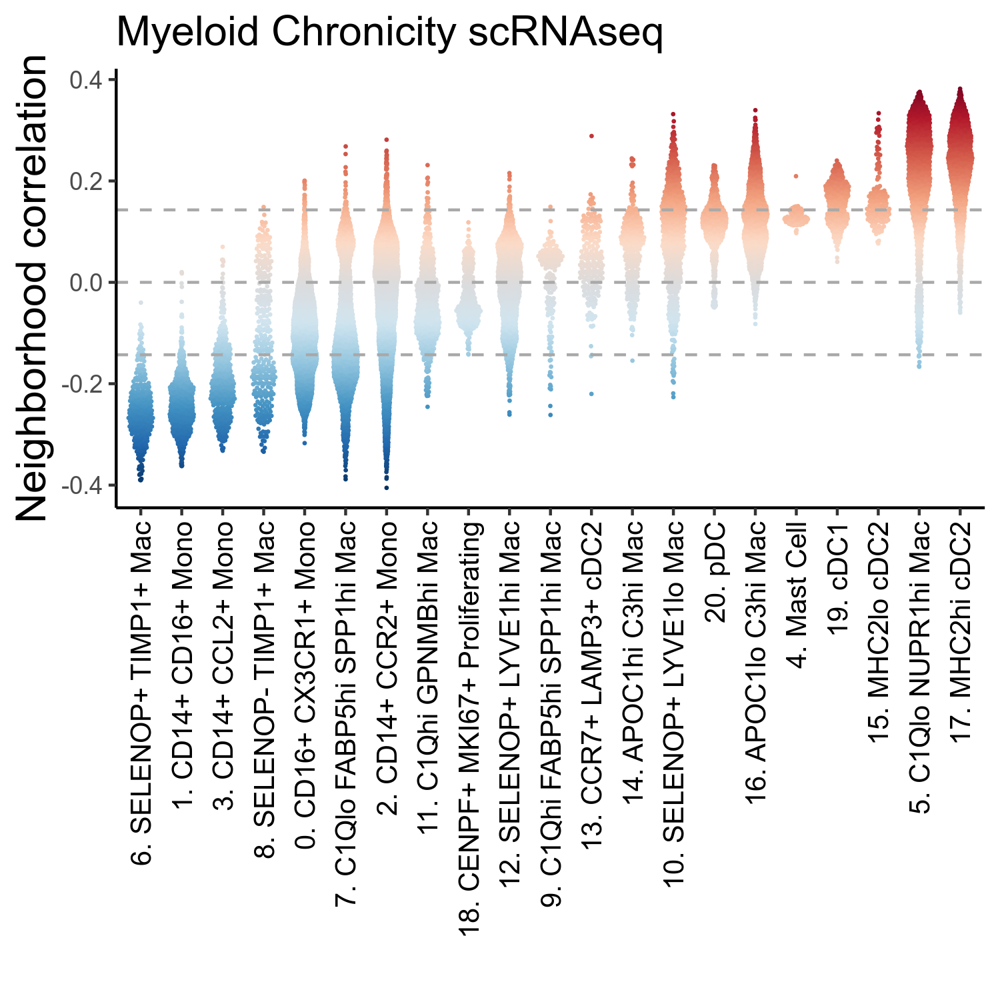

In [4]:
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.meta.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell, annotation))
kept <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.kept.csv')
kept <- kept[, 1]
kept <- which(kept == TRUE)
thresh <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.thresh.csv', check.names = FALSE)
ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.ncorrs.csv', check.names = FALSE)
ncorr <- rbind(colnames(ncorr), ncorr)
ncorr <- ncorr[, 1]

meta_tmp_1 <- meta
meta_tmp_1$ncorr <- as.numeric(ncorr)

thresh10 <- thresh[1, 1]


meta_tmp_1$ncorr <- as.numeric(ncorr)


umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_umap.csv')

sn_umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_umap.csv')

meta_tmp_1$UMAP1 <- umap$hUMAP1
meta_tmp_1$UMAP2 <- umap$hUMAP2


meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh10)] <- NA


fig.size(5, 5)
ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),], 
      aes(x = UMAP1, y = UMAP2)) + 
      geom_point(mapping = aes(color = ncorr), alpha = 5, size = 2) + 
      geom_point(data = qcd_meta %>% filter(dataset == 'snRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'darkgreen', alpha = 0.1) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_classic()+
      theme(
        plot.title = element_text(color="black", size=15), # face="bold.italic"
        ) +
      labs(title = "Myeloid scRNAseq: Chronicity - fdr 10%")


pos_fdr_thres <- thresh10
neg_fdr_thresh <- -1 * thresh10


meta$ncorr <- as.numeric(ncorr)

interval <- c(-max(abs(meta$ncorr)), max(abs(meta$ncorr)))


myPalette <- colorRampPalette(c(RColorBrewer::brewer.pal(11, "RdBu")[11:7], "#DCDCDC", RColorBrewer::brewer.pal(11, "RdBu")[5:1]))
fig.size(5, 5)

ggplot(meta, aes(x = reorder(annotation, ncorr), y = ncorr)) +
    ggbeeswarm::geom_quasirandom(aes(color = ncorr), width = 0.3, size = 0.1) +
    geom_hline(yintercept = thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = -1 * thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "darkgrey") +
    scale_colour_gradientn(colours = myPalette(50), limits = interval) +
    labs(title = "Myeloid Chronicity scRNAseq", x= "", y = "Neighborhood correlation") +
    theme_classic() +
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=15),
        axis.text.x = element_text(color = "black", size = 10, angle = 90, vjust = 0.5, hjust=1),
        axis.title=element_text(size=15))

##### Matched Samples

Joining, by = "cell"


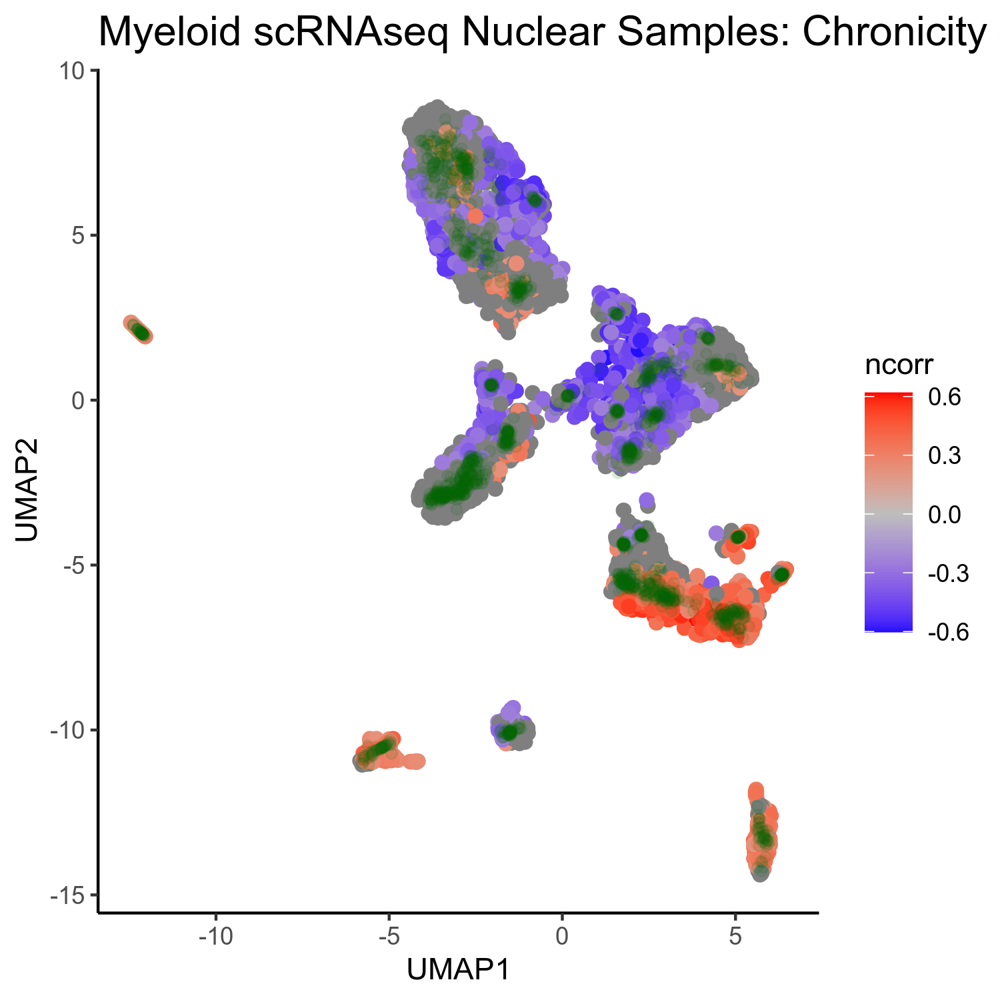

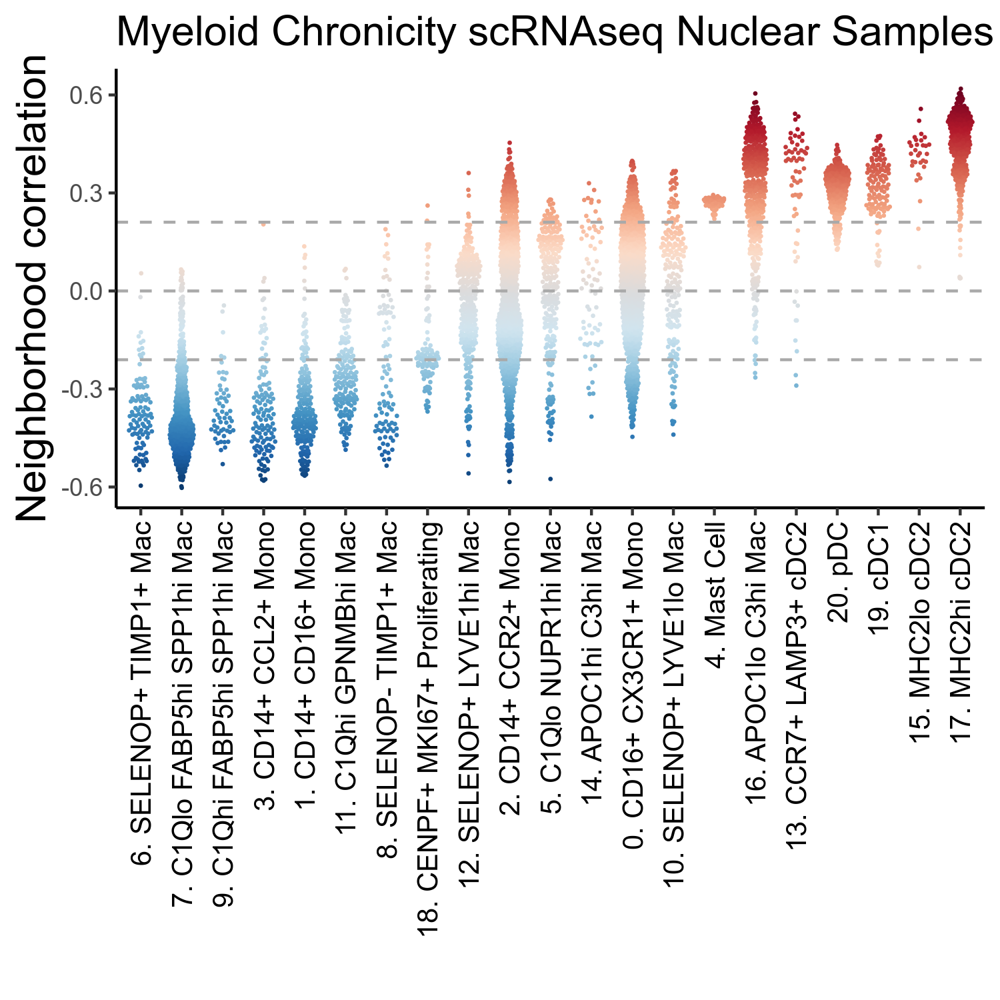

In [5]:
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.meta.matchedsamples.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell, annotation))
kept <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.kept.matchedsamples.csv')
kept <- kept[, 1]
kept <- which(kept == TRUE)
thresh <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.thresh.matchedsamples.csv', check.names = FALSE)
ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.ncorrs.matchedsamples.csv', check.names = FALSE)
ncorr <- rbind(colnames(ncorr), ncorr)
ncorr <- ncorr[, 1]

meta_tmp_1 <- meta
meta_tmp_1$ncorr <- as.numeric(ncorr)

thresh10 <- thresh[1, 1]


meta_tmp_1$ncorr <- as.numeric(ncorr)


umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_umap.matchedsamples.csv')

sn_umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_umap.csv')

meta_tmp_1$UMAP1 <- umap$hUMAP1
meta_tmp_1$UMAP2 <- umap$hUMAP2


meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh10)] <- NA


fig.size(5, 5)
ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),], 
      aes(x = UMAP1, y = UMAP2)) + 
      geom_point(mapping = aes(color = ncorr), alpha = 5, size = 2) + 
      geom_point(data = qcd_meta %>% filter(dataset == 'snRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'darkgreen', alpha = 0.1) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_classic()+
      theme(
        plot.title = element_text(color="black", size=15), # face="bold.italic"
        ) +
      labs(title = "Myeloid scRNAseq Nuclear Samples: Chronicity - fdr 10%")


pos_fdr_thres <- thresh10
neg_fdr_thresh <- -1 * thresh10


meta$ncorr <- as.numeric(ncorr)

interval <- c(-max(abs(meta$ncorr)), max(abs(meta$ncorr)))


myPalette <- colorRampPalette(c(RColorBrewer::brewer.pal(11, "RdBu")[11:7], "#DCDCDC", RColorBrewer::brewer.pal(11, "RdBu")[5:1]))
fig.size(5, 5)

ggplot(meta, aes(x = reorder(annotation, ncorr), y = ncorr)) +
    ggbeeswarm::geom_quasirandom(aes(color = ncorr), width = 0.3, size = 0.1) +
    geom_hline(yintercept = thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = -1 * thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "darkgrey") +
    scale_colour_gradientn(colours = myPalette(50), limits = interval) +
    labs(title = "Myeloid Chronicity scRNAseq Nuclear Samples", x= "", y = "Neighborhood correlation") +
    theme_classic() +
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size = 15),
        axis.text.x = element_text(color = "black", size = 10, angle = 90, vjust = 0.5, hjust=1),
        axis.title=element_text(size=15))

In [135]:
unique(meta$sample) %>% length()

[1] 27

##### Single Dataset Embeddings

In [34]:
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.meta.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell,new_annot))
kept <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_singledataset.kept.csv')
kept <- kept[, 1]
kept <- which(kept == TRUE)
thresh <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_singledataset.thresh.csv')
ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_singledataset.ncorrs.csv')
ncorr <- rbind(colnames(ncorr), ncorr)
ncorr <- ncorr[, 1]

Joining, by = "cell"


Joining, by = c("cell", "hUMAP1", "hUMAP2")
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”


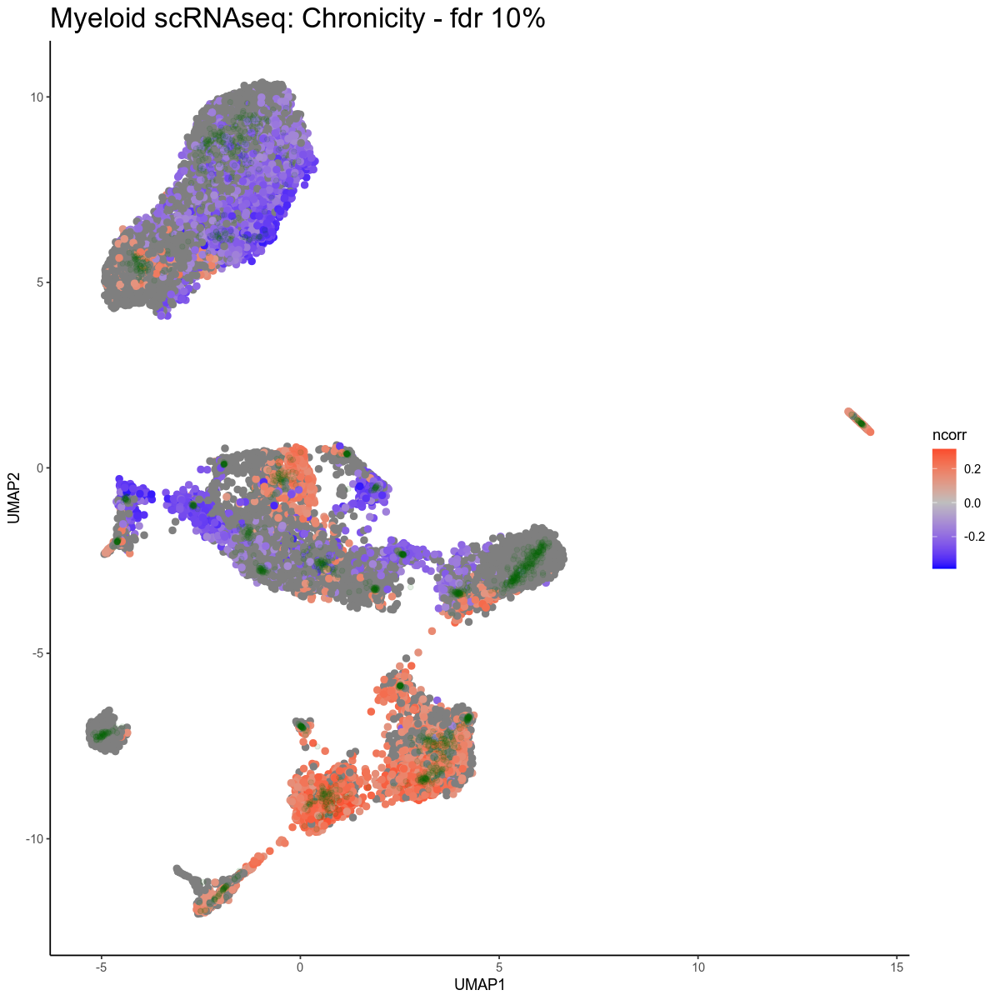

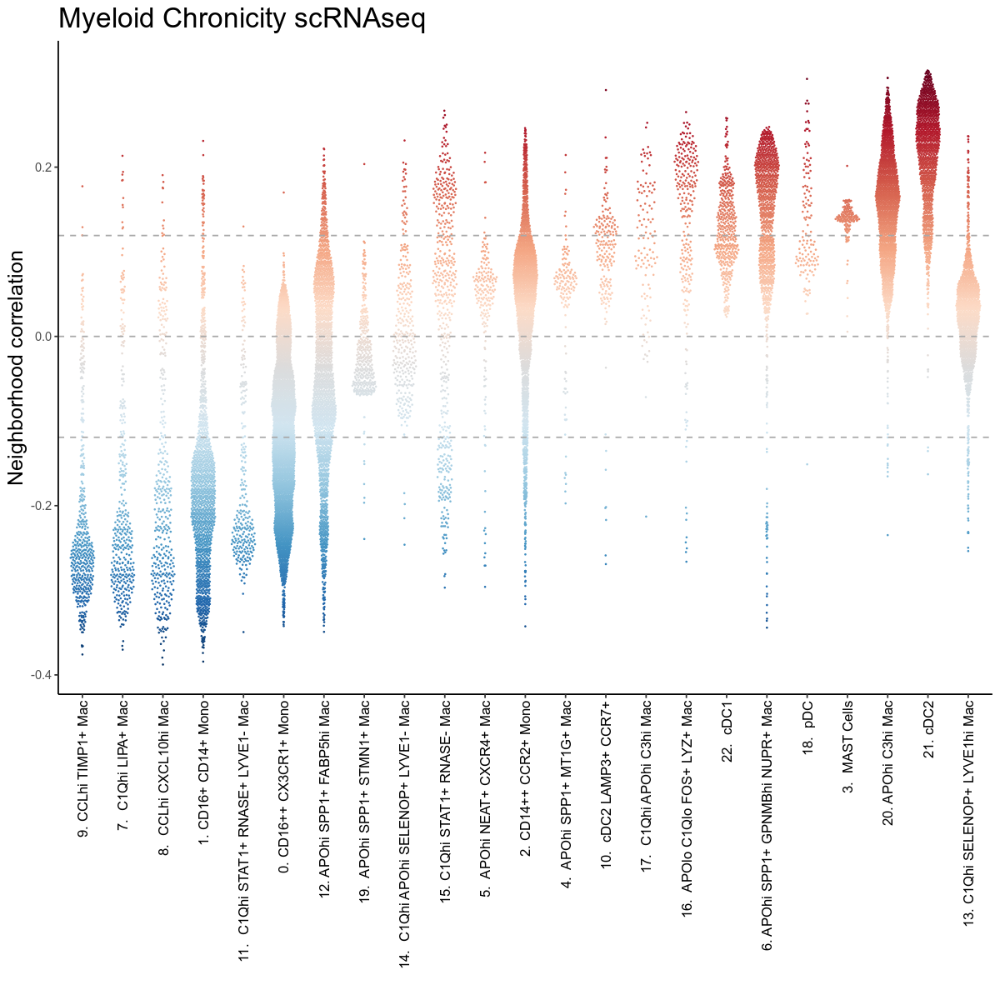

In [36]:
meta <- left_join(meta, qcd_meta %>% select(cell, hUMAP1, hUMAP2))
meta$ncorr <- as.numeric(ncorr)

thresh10 <- thresh[, 1]
meta_tmp_1 <- meta
meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh10)] <- NA


ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),], 
      aes(x = hUMAP1, y = hUMAP2)) + 
      geom_point(mapping = aes(color = ncorr), alpha = 5, size = 2) + 
      geom_point(data = qcd_meta %>% filter(dataset == 'snRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'darkgreen', alpha = 0.1) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_classic()+
      theme(
        plot.title = element_text(color="black", size=20), # face="bold.italic"
        ) +
      labs(title = "Myeloid scRNAseq: Chronicity - fdr 10%")


pos_fdr_thres <- thresh10
neg_fdr_thresh <- -1 * thresh10


interval <- c(-max(abs(meta$ncorr)), max(abs(meta$ncorr)))


myPalette <- colorRampPalette(c(RColorBrewer::brewer.pal(11, "RdBu")[11:7], "#DCDCDC", RColorBrewer::brewer.pal(11, "RdBu")[5:1]))
fig.size(10, 10)

ggplot(meta, aes(x = reorder(new_annot, ncorr), y = ncorr)) +
    ggbeeswarm::geom_quasirandom(aes(color = ncorr), width = 0.3, size = 0.1) +
    geom_hline(yintercept = thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = -1 * thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "darkgrey") +
    scale_colour_gradientn(colours = myPalette(100), limits = interval) +
    labs(title = "Myeloid Chronicity scRNAseq", x= "", y = "Neighborhood correlation") +
    theme_classic() +
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20),
        axis.text.x = element_text(color = "black", size = 10, angle = 90, vjust = 0.5, hjust=1),
        axis.title=element_text(size=15)) 



#### sn Chronicity

Joining, by = "cell"


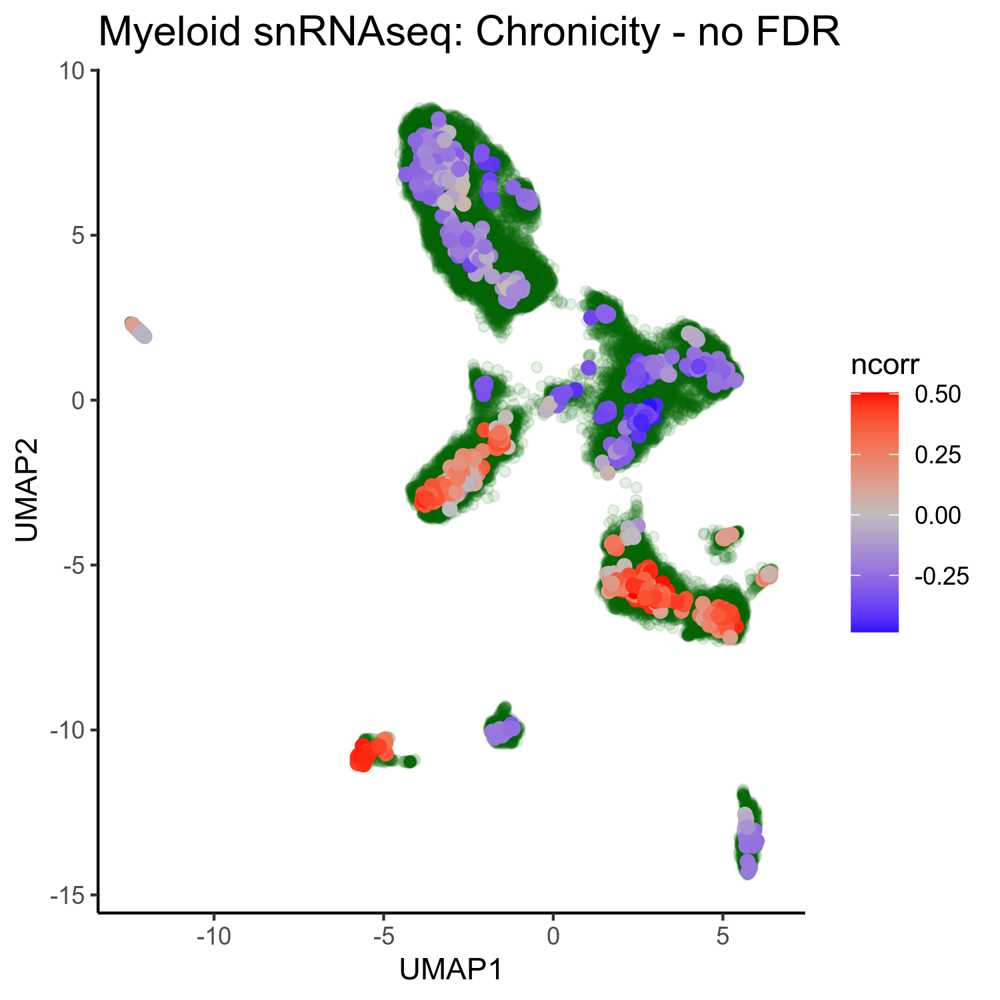

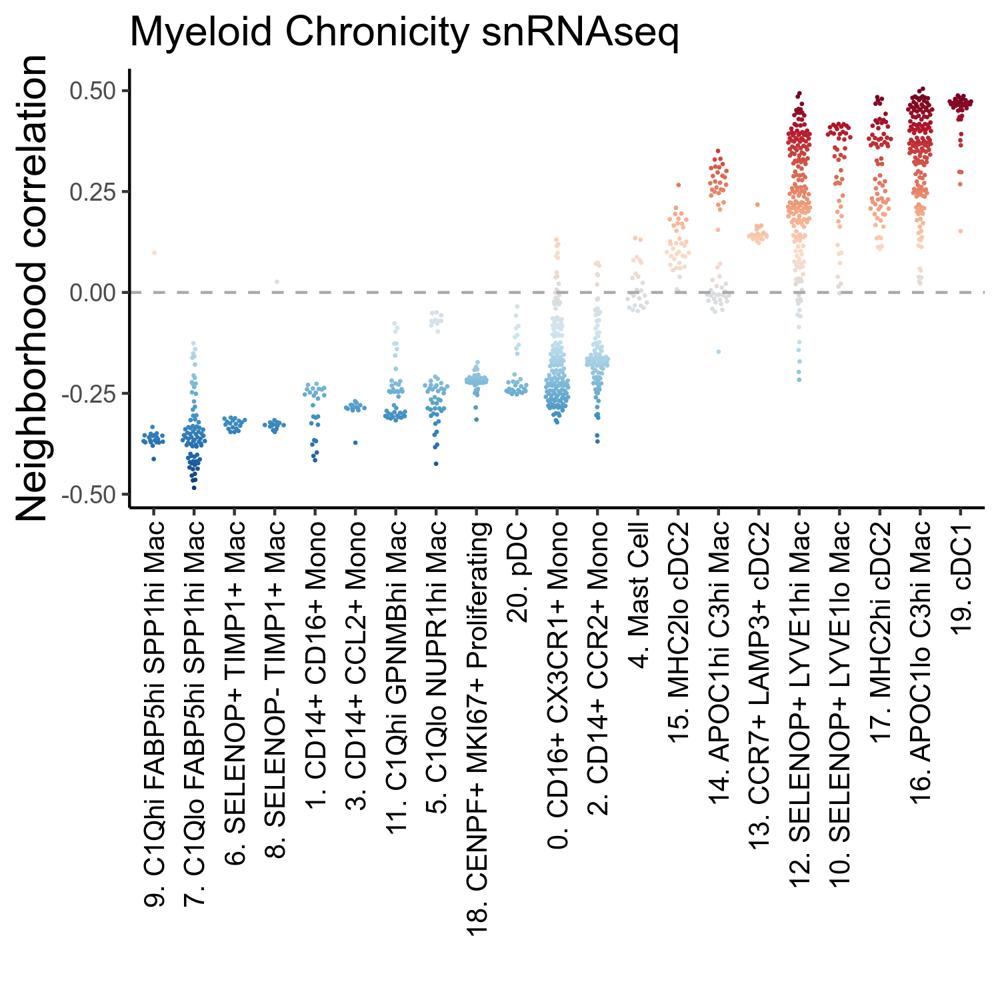

In [6]:
library(ggbeeswarm)

meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_meta.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell, annotation))
kept <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity.kept.csv')
kept <- kept[, 1]
kept <- which(kept == TRUE)
#thresh <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity.thresh.csv')
ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity.ncorrs.csv', check.names = FALSE)
ncorr <- rbind(colnames(ncorr), ncorr)
ncorr <- ncorr[, 1]

#thresh10 <- thresh[, 1]


meta_tmp_1 <- meta
meta_tmp_1$ncorr <- as.numeric(ncorr)


umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_umap.csv')

meta_tmp_1$UMAP1 <- umap$hUMAP1
meta_tmp_1$UMAP2 <- umap$hUMAP2

#meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh10)] <- NA


sc_umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity_umap.csv')

fig.size(5, 5)
ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),], 
      aes(x = UMAP1, y = UMAP2)) + 
      geom_point(data = qcd_meta %>% filter(dataset == 'scRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'darkgreen', alpha = 0.1) + 
      geom_point(mapping = aes(color = ncorr), alpha = 5, size = 2) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_classic()+
      theme(
        plot.title = element_text(color="black", size=15), # face="bold.italic"
        ) +
      labs(title = "Myeloid snRNAseq: Chronicity - no FDR")

pos_fdr_thresh <- thresh10
neg_fdr_thresh <- -1 * thresh10


meta$ncorr <- as.numeric(ncorr)

interval <- c(-max(abs(meta$ncorr)), max(abs(meta$ncorr)))


myPalette <- colorRampPalette(c(RColorBrewer::brewer.pal(11, "RdBu")[11:7], "#DCDCDC", RColorBrewer::brewer.pal(11, "RdBu")[5:1]))

fig.size(5, 5)
ggplot(meta, aes(x = reorder(annotation, ncorr), y = ncorr)) +
    geom_quasirandom(aes(color = ncorr), width = 0.3, size = 0.1) +
#   geom_hline(yintercept = pos_fdr_thresh, linetype = "dashed", color = "darkgrey") +
#    geom_hline(yintercept = neg_fdr_thresh, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "darkgrey") +
    scale_colour_gradientn(colours = myPalette(100), limits = interval) +
    labs(title = "Myeloid Chronicity snRNAseq", x= "", y = "Neighborhood correlation") +
    theme_classic() +
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=15),
        axis.text.x = element_text(color = "black", size = 10, angle = 90, vjust = 0.5, hjust=1),
        axis.title=element_text(size=15))

In [137]:
unique(meta$sample) %>% length()

[1] 27

##### Single Dataset Embeddings

In [37]:
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_meta.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell, annotation))
kept <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_singledataset.kept.csv')
kept <- kept[, 1]
kept <- which(kept == TRUE)
ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sn_myeloid_chronicity_singledataset.ncorrs.csv', check.names = FALSE)
ncorr <- rbind(colnames(ncorr), ncorr)
ncorr <- ncorr[, 1]

thresh25 <- 0.355603

Joining, by = "cell"


Joining, by = "cell"


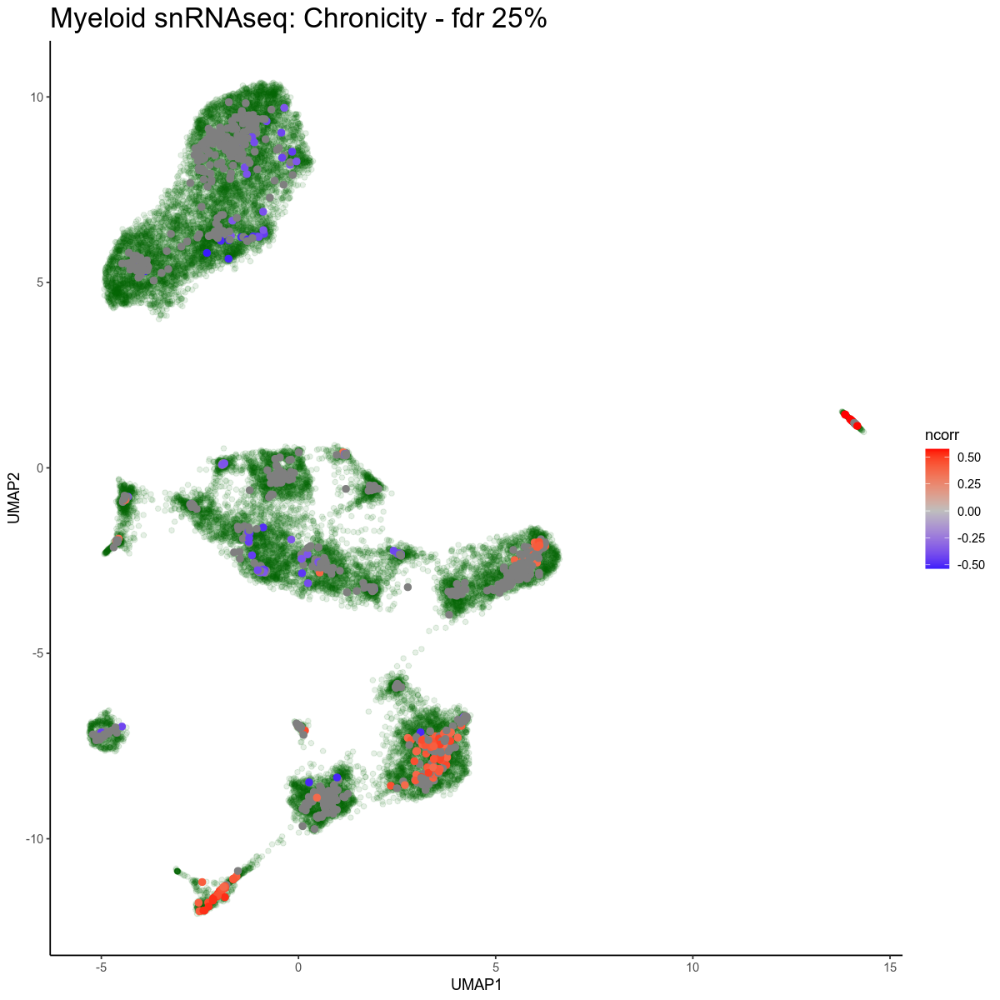

In [38]:
meta <- left_join(meta, qcd_meta %>% select(cell, hUMAP1, hUMAP2))
meta$ncorr <- as.numeric(ncorr)

meta_tmp_1 <- meta
meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh25)] <- NA


ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),], 
      aes(x = hUMAP1, y = hUMAP2)) + 
      geom_point(data = qcd_meta %>% filter(dataset == 'scRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'darkgreen', alpha = 0.1) + 
      geom_point(mapping = aes(color = ncorr), alpha = 5, size = 2) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_classic()+
      theme(
        plot.title = element_text(color="black", size=20), # face="bold.italic"
        ) +
      labs(title = "Myeloid snRNAseq: Chronicity - fdr 25%")


#### Old vs New nCorr

In [12]:
meta <- read.csv("/data/srlab/ssg34/SLE_kidney/data/Myeloid/all_myeloid_cells.post_meta_CNA_chronicity.csv")
ncorr <- read.csv("/data/srlab/ssg34/SLE_kidney/data/Myeloid/myeloid_postQC_responder_ncorrs_chronicity.csv",header = F)
ncorr <- ncorr$V1
meta$ncorr <- as.numeric(ncorr)

thresh <- read.csv("/data/srlab/ssg34/SLE_kidney/data/Myeloid/myeloid_postQC_responder_chronicity_fdrs.csv",header = F)


thresh5 <- thresh$V1[1]
thresh10 <- thresh$V1[2]

#meta$ncorr[which(abs(meta$ncorr) < thresh10)] <- NA

In [2]:
meta <- left_join(meta, qcd_meta %>% select(cell, hUMAP1, hUMAP2))
meta$ncorr <- as.numeric(ncorr)

thresh10 <- thresh[, 1]
meta_tmp_1 <- meta
meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh10)] <- NA


ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),], 
      aes(x = hUMAP1, y = hUMAP2)) + 
      geom_point(mapping = aes(color = ncorr), alpha = 5, size = 2) + 
      geom_point(data = qcd_meta %>% filter(dataset == 'snRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'darkgreen', alpha = 0.1) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_classic()+
      theme(
        plot.title = element_text(color="black", size=20), # face="bold.italic"
        ) +
      labs(title = "Myeloid scRNAseq: Chronicity - fdr 10%")


ERROR: Error in left_join(meta, qcd_meta %>% select(cell, hUMAP1, hUMAP2)): could not find function "left_join"


In [7]:
new_meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.meta.csv')
new_ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.ncorrs.csv', check.names = FALSE)
new_ncorr <- rbind(colnames(new_ncorr), new_ncorr)
new_ncorr <- new_ncorr[, 1]
new_meta$new_ncorr <- as.numeric(new_ncorr)

thresh <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/myeloid/sc_myeloid_chronicity.thresh.csv')
thresh10 <- thresh[, 1]

#new_meta$new_ncorr[which(abs(new_meta$new_ncorr) < thresh10)] <- NA

In [13]:
ncorrs <- left_join(new_meta %>% select(cell, new_ncorr) %>% 
                        rename(cells = cell) %>% na.omit(), 
                    meta %>% select(cells, ncorr) %>% 
                        na.omit()) %>% na.omit()

Joining, by = "cells"


In [14]:
cor.test(ncorrs$new_ncorr, ncorrs$ncorr)


	Pearson's product-moment correlation

data:  ncorrs$new_ncorr and ncorrs$ncorr
t = 210.74, df = 18012, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.8392103 0.8476390
sample estimates:
      cor 
0.8434766 


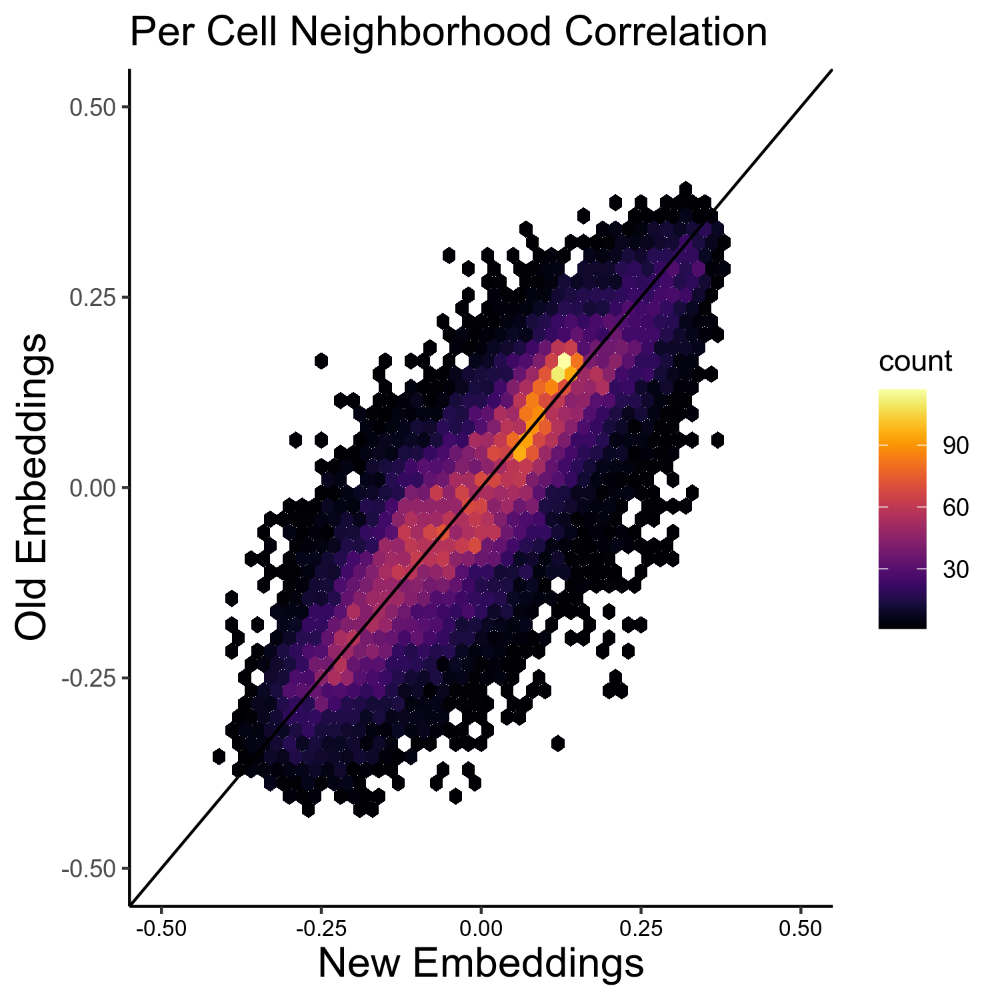

In [16]:
fig.size(5, 5)
ggplot(ncorrs, aes(x = new_ncorr, y = ncorr)) +
    geom_hex(binwidth = c(0.02, 0.02)) + 
    theme_classic() + 
    scale_fill_viridis(option = 'inferno') +
    labs(x = 'New Embeddings', y = 'Old Embeddings', title = 'Per Cell Neighborhood Correlation') + 
    theme(plot.title = element_text(color="black", size=15),
            axis.text.x = element_text(color = "black", size = 8),
            axis.title=element_text(size=15)) +
    geom_abline() + 
    scale_x_continuous(limits = c(-0.5, 0.5)) + 
    scale_y_continuous(limits = c(-0.5, 0.5))